<a href="https://colab.research.google.com/github/SuhyunL/projects/blob/main/jewerly_data_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle --upgrade
from google.colab import files
files.upload()

Requirement already up-to-date: kaggle in /usr/local/lib/python3.7/dist-packages (1.5.10)


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sueleehyun","key":"80d5031e7ae6927072b21c577546cda3"}'}

In [ ]:
!mkdir -p ~/.kaggle  
!cp kaggle.json ~/.kaggle/    
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!pip install imbalanced-learn
!pip install category_encoders
!pip install pandas-profiling==2.7.1 
!pip install -U scikit-learn
!pip install catboost
!pip install eli5
!pip install pdpbox
!pip install shap
!pip install plotly==4.14.3

In [ ]:
!pip install plotly==4.14.3

In [ ]:
!kaggle datasets download -d mkechinov/ecommerce-purchase-history-from-jewelry-store

  0% 0.00/3.12M [00:00<?, ?B/s]
100% 3.12M/3.12M [00:00<00:00, 102MB/s]


In [ ]:
!ls

ecommerce-purchase-history-from-jewelry-store.zip  kaggle.json	sample_data


#**E-Commerce Purchase History from Jewerly Store**
https://www.kaggle.com/mkechinov/ecommerce-purchase-history-from-jewelry-store


## **1. 분석배경**

이커머스 시장은 급격히 성장중에 있다. 본 데이터는 전 세계적으로 패션 이커머스가 본격화된 2018년부터, 코로나를 지나오며 이커머스 시장의 놀라운 성장세를 보인 2020년까지의 데이터를 담고 있다. 이 데이터를 바탕으로 이커머스 시장에서의 소비자 행동과 미래 도래할 트렌드에 대해 알아보고자 한다. 추가로 시장의 trend 형성에 주요한 역할을 하는 trend leader의 존재와, 그 영향의 정도까지도 알아보고자 한다. 본 분석이 나의 호기심의 갈증을 해결해주기를 기대하는 바이다.

      



## **2. 분석목표**

### **1) Brand 분석**
#### Brand
- 어떤 Brand가 성장할까?

### **2) Trend 분석**
####2.1. 상품별 분석
- 2018년도부터 지금까지 트렌드는 어떻게 변하는가?
- 소재, 종류, 색상 등의 관점에서 트렌드 변화를 분석
- 내년엔 어떤 Trend가 뜰 것으로 보이는가?

####2.2. Trend leader별 분석
- 몇몇 leader가 시장의 트렌드를 이끄는가? 그런 리더들이 있는가? 
- Trend Leader가 언제쯤부터 시작하고, 트렌드가 시작되었다고 보이는 큰 Sales는 언제쯤부터 발생하는가?


### **3) Sales 분석**
####3.1. 시간대별 Sales 분석
- 언제 제일 많이 사는가?
- 가장 많이 팔리는 요일은?
- 가장 많이 팔리는 시간대는?
- 가장 많이 팔리는 달은? (=시기는?)

####3.2. 재구매별 Sales 분석
- 재구매 비율은 어느정도 되는가?
- 유난히 재구매가 많이 일어난 브랜드가 있는가?
- 브랜드별 재구매는 

### **4) 브랜드별 2021년 어떤 제품을, 언제 출시해야 할지 추측하기**
- 어떤 category? (반지? 팔찌? 목걸이? ..) -> 분류 모델
- 어느 정도의 가격? -> 회귀 모델
- 출시 이후, 프로모션을 해야한다면 언제쯤 하는것이 좋을까? (특정한 월? 시간대? 요일?) -> 분류 모델
- 출시 이후 몇몇 고객을 선정해 체험단을 할 것인가? (Trend leader중 누구를 선택할 것인가?)

In [ ]:
import pandas as pd
df = pd.read_csv('ecommerce-purchase-history-from-jewelry-store.zip')
df

,event_time,order_id,product_id,quantity,category_id,category_code,brand,price,user_id,gender,color,metal,gem
0,2018-11-29 16:30:45 UTC,1923415742179443254,1836250225916772582,1,1.806829e+18,jewelry.pendant,0.0,67.78,1.515916e+18,NaN,red,gold,diamond
1,2018-11-29 16:52:07 UTC,1923426489303302817,1836015460420681761,1,1.806829e+18,jewelry.pendant,0.0,32.63,1.515916e+18,NaN,red,gold,NaN
2,2018-11-29 17:58:37 UTC,1923459963229831173,1806829194936582544,1,1.806829e+18,jewelry.ring,1.0,75.21,1.515916e+18,NaN,red,gold,amethyst
3,2018-11-29 20:25:52 UTC,1923534078074684181,1835566854668550661,1,1.806829e+18,jewelry.earring,0.0,131.37,1.515916e+18,f,red,gold,NaN
4,2018-11-29 20:30:01 UTC,1923536169069445939,1836568752905257618,1,1.806829e+18,jewelry.bracelet,0.0,102.60,1.515916e+18,f,red,gold,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
113297,2020-11-29 14:23:55 UTC,2453162965403173054,1956663847666319760,1,1.806829e+18,jewelry.ring,1.0,152.42,1.515916e+18,NaN,white,gold,NaN
113298,2020-11-29 14:32:30 UTC,2453167283086819594,1956663836853404084,1,1.806829e+18,NaN,1.0,209.48,1.515916e+18,f,red,gold,NaN
113299,2020-11-29 14:32:30 UTC,2453167283086819594,1927585748282770109,1,1.806829e+18,jewelry.pendant,0.0,93.47,1.515916e+18,f,red,gold,topaz
113300,2020-11-29 14:36:52 UTC,2453169475306914089,1956663846458360689,1,1.806829e+18,jewelry.ring,0.0,239.59,1.515916e+18,f,red,gold,diamond


✔︎ 전체 data 확인

In [ ]:
df.describe(include = 'all')

,event_time,order_id,product_id,quantity,category_id,category_code,brand,price,user_id,gender,color,metal,gem
count,113302,1.133020e+05,1.133020e+05,113302.000000,1.129050e+05,103674,1.119360e+05,112905.000000,1.129050e+05,62223,110166,112851,77095
unique,85458,NaN,NaN,NaN,NaN,202,NaN,NaN,NaN,2,5,3,32
top,2019-12-21 12:42:30 UTC,NaN,NaN,NaN,NaN,jewelry.ring,NaN,NaN,NaN,f,red,gold,diamond
freq,30,NaN,NaN,NaN,NaN,39269,NaN,NaN,NaN,61664,84676,111301,34804
mean,NaN,2.200117e+18,1.854770e+18,1.000009,1.806637e+18,NaN,5.330749e+15,292.254944,1.512850e+18,NaN,NaN,NaN,NaN
std,NaN,1.410954e+17,1.910882e+17,0.002971,9.733465e+15,NaN,8.939869e+16,481.857658,2.250084e+16,NaN,NaN,NaN,NaN
min,NaN,1.923416e+18,1.313551e+18,1.000000,1.313678e+18,NaN,0.000000e+00,0.920000,1.313554e+18,NaN,NaN,NaN,NaN
25%,NaN,2.086874e+18,1.851564e+18,1.000000,1.806829e+18,NaN,0.000000e+00,110.580000,1.515916e+18,NaN,NaN,NaN,NaN
50%,NaN,2.201607e+18,1.956664e+18,1.000000,1.806829e+18,NaN,1.000000e+00,204.380000,1.515916e+18,NaN,NaN,NaN,NaN
75%,NaN,2.317472e+18,1.956664e+18,1.000000,1.806829e+18,NaN,1.000000e+00,346.530000,1.515916e+18,NaN,NaN,NaN,NaN


✔︎ 결측치 확인

In [ ]:
[(x, df[x].isnull().sum()) for x in df.columns if df[x].isnull().any()]

#Gender, Gem에 결측치가 많다. 

[('category_id', 397),
 ('category_code', 9628),
 ('brand', 1366),
 ('price', 397),
 ('user_id', 397),
 ('gender', 51079),
 ('color', 3136),
 ('metal', 451),
 ('gem', 36207)]

In [ ]:
df.nunique()
#약 20개의 카테고리 id, 200개의 제품 카테고리 코드 [-> groupby로 정리해서 제품 카테고리 확인 및 cardinality 정리가 필요해 보임
#시간도 정리가 좀 필요해 보임. 분석 목표에 써두었듯 자세한 분석을 위해선 date, days, month, time등으로 구분이 필요함.

event_time       85458
order_id         85604
product_id       10194
quantity             2
category_id         20
category_code      202
brand               88
price             4210
user_id          45194
gender               2
color                5
metal                3
gem                 32
dtype: int64

In [ ]:
df[['order_id','user_id','product_id','category_id']] = df[['order_id','user_id','product_id','category_id']].astype(str)

# **✔︎ 데이터 전처리**

###**1. Product Category Code 정리**
- Category Id를 활용해 high cardinality(200정도)
- Nan값도 확인이 필요

> Cardinality 정리

In [ ]:
#Unique Value 확인 - category로 보이지 않는 애들이 많음. 각 value들의 구성 비율 확인이 필요
pd.set_option('display.max_rows', 30)
df.category_code.unique()

array(['jewelry.pendant', 'jewelry.ring', 'jewelry.earring',
       'jewelry.bracelet', 'electronics.clocks', nan, 'jewelry.stud',
       'jewelry.brooch', 'jewelry.necklace', 'jewelry.souvenir', '697.58',
       '230.12', '202.36', '140.51', '639.00', '1098.03', '321.78',
       '1128.62', '81.27', '34.25', '582.16', '227.37', '234.22',
       '131.82', '150.55', '2123.15', '109.45', '26.03', '49.22',
       '472.47', '205.38', '2061.51', '313.36', '2746.44', '2.73',
       '51.08', '1636.85', '335.59', '108.33', '752.01', '231.12',
       '152.33', '184.22', '1095.75', '76.97', '3054.73', '212.19',
       '184.90', '560.92', '2.88', '380.10', '357.49', '15.47', '135.33',
       '719.75', '93.01', '177.95', '287.53', '412.30', '102.10',
       '595.75', '469.56', '427.07', '53.62', '77.53', '1469.18',
       '355.27', '184.89', '154.66', '300.58', '83.73', '271.19',
       '3294.21', '278.04', '3626.26', '126.03', '143.15', '283.52',
       '306.12', '328.73', '114.38', '89.04', '3022

In [ ]:
propcat = df.category_code.unique()[0:10] #제대로된 category만 리스트를 만들어 봄
check = df.category_code.isin(propcat)
check.value_counts(normalize = True) #제대로 입력되지 않은 애들은 극소수.(0.0035) drop해도 무방해 보임.

True     0.996496
False    0.003504
Name: category_code, dtype: float64

In [ ]:
# drop 이전에 혹시 몰라 category_code가 정상적으로 입력되지 않은 값들 확인. (총 397개)
import numpy as np
pd.reset_option('display.max_rows', 500)
display(df.iloc[np.where(check == False)].isna().sum()) #category id, Price, User id 등의 칼럼들은 전체가 nan임.
df.iloc[np.where(check == False)].head() # dataframe으로 확인. drop해도 무방해 보임. Price도 없어 drop해도 무방해 보임.

event_time         0
order_id           0
product_id         0
quantity           0
category_id        0
category_code      0
brand              0
price            397
user_id            0
gender           397
color            397
metal            397
gem              397
dtype: int64

,event_time,order_id,product_id,quantity,category_id,category_code,brand,price,user_id,gender,color,metal,gem
2055,2019-01-19 16:50:29 UTC,1960389233814274426,1916614406133776515,1,nan,697.58,1.515916e+18,NaN,nan,NaN,NaN,NaN,NaN
3296,2019-01-26 05:51:21 UTC,1965130913738130034,1937825427510789079,1,nan,230.12,1.550613e+18,NaN,nan,NaN,NaN,NaN,NaN
5462,2019-02-05 08:39:25 UTC,1972463258694582403,1536903766496772737,1,nan,202.36,1.325156e+18,NaN,nan,NaN,NaN,NaN,NaN
7224,2019-02-14 08:19:11 UTC,1978976060741517517,1515966222725010479,1,nan,140.51,1.515916e+18,NaN,nan,NaN,NaN,NaN,NaN
7225,2019-02-14 08:19:11 UTC,1978976060741517517,1515966222725010480,1,nan,639.00,1.515916e+18,NaN,nan,NaN,NaN,NaN,NaN


In [ ]:
df.drop(np.where(check == False)[0], inplace = True)

> 이외 Category Code가 정상적으로 입력된 값 정리
- Electronics.clocks라는 jewerly가 아닌 값의 비율을 확인하고 정리
- Nan값을 category id를 활용해 대체 

In [ ]:
display(df.category_code.value_counts(normalize=True))
print('\nNan in Category id:\n', df[['category_id','category_code']].isna().sum())
#electronics.clocks와 nan값이 보임.
#전자시계는 비율 상 모두 drop해도 무방해 보이고, nan값은 category_id값을 통해 채워넣을 수 있을 것으로 보임.

jewelry.ring          0.380230
jewelry.earring       0.348945
jewelry.pendant       0.159338
jewelry.bracelet      0.069357
jewelry.necklace      0.023945
jewelry.brooch        0.012607
jewelry.souvenir      0.002818
electronics.clocks    0.002382
jewelry.stud          0.000378
Name: category_code, dtype: float64


Nan in Category id:
 category_id         0
category_code    9628
dtype: int64


In [ ]:
#electronic clock drop 전 값 확인
pd.options.display.float_format = '{:.0f}'.format
check = df[['category_code','category_id']][df.category_code == 'electronics.clocks']
display(check)
df.drop(check.index, inplace=True) #확인 후 별다른 특이사항 없음, drop

,category_code,category_id
9,electronics.clocks,1.806829202008179e+18
180,electronics.clocks,1.806829202008179e+18
290,electronics.clocks,1.806829202008179e+18
300,electronics.clocks,1.806829202008179e+18
301,electronics.clocks,1.806829202008179e+18
...,...,...
108672,electronics.clocks,1.806829202008179e+18
110649,electronics.clocks,1.806829202008179e+18
111279,electronics.clocks,1.806829202008179e+18
112038,electronics.clocks,1.806829202008179e+18


In [ ]:
#nan값 처리를 위한 category_code 별 id 확인. 주로 한개의 코드 당 한개의 아이디가 배정되나, earring이나 pendent, ring의 경우 여러개의 id 배정.
a = df.groupby('category_id').category_code.value_counts()
a = pd.DataFrame(a)
display(a)
key = a.rename(columns = {'category_code':'count'}).reset_index()[['category_id','category_code']]

,,category_code
category_id,category_code,
1.313677631836652e+18,jewelry.pendant,2
1.313677631878595e+18,jewelry.ring,8
1.3136776318953723e+18,jewelry.earring,9
1.8068292018655726e+18,jewelry.bracelet,7163
1.8068292018823498e+18,jewelry.ring,39261
1.8068292018907384e+18,jewelry.earring,36029
1.8068292019159043e+18,jewelry.pendant,16454
1.8068292019242929e+18,jewelry.necklace,2473
1.80682920194107e+18,jewelry.brooch,1302


In [ ]:
df = df.drop(['category_code'], axis = 1) #기존의 nan값이 있던 category code drop
df = df.merge(key, on = 'category_id') #대신 key값과 merge를 통해 nan값 처리!
df.head()

,event_time,order_id,product_id,quantity,category_id,brand,price,user_id,gender,color,metal,gem,category_code
0,2018-11-29 16:30:45 UTC,1923415742179443254,1836250225916772582,1,1.8068292019159043e+18,0,68,1.5159156252331968e+18,NaN,red,gold,diamond,jewelry.pendant
1,2018-11-29 16:52:07 UTC,1923426489303302817,1836015460420681761,1,1.8068292019159043e+18,0,33,1.5159156252330294e+18,NaN,red,gold,NaN,jewelry.pendant
2,2018-11-30 11:31:06 UTC,1923989698926084952,1879831915385586469,1,1.8068292019159043e+18,0,209,1.5159156251791265e+18,NaN,red,gold,amber,jewelry.pendant
3,2018-11-30 16:46:28 UTC,1924148425264201748,1839803839394349564,1,1.8068292019159043e+18,4,1,1.5159156251711667e+18,NaN,NaN,silver,fianit,jewelry.pendant
4,2018-11-30 16:46:28 UTC,1924148425264201748,1840638201165775183,1,1.8068292019159043e+18,4,1,1.5159156251711667e+18,NaN,NaN,silver,fianit,jewelry.pendant


In [ ]:
df[['category_id','category_code']].isna().sum()
#nan값 처리 완료

category_id      0
category_code    0
dtype: int64

###**2. 구매 시점(Event Time) 정리**
- 현재 Event time은 초까지 적혀있음, 동시에 구매하지 않는 이상 다른 값으로 처리되어 해당 feature를 활용한 소비자들의 구매시점 경향 파악이 어려움
- 이에 해당 column을 활용해 날짜, 요일, 시간, 시간대, 시기(월) 등의 feature를 생성할 것임.

> Event time 칼럼 활용 이전에, 모든 value의 기준 시간이 UTC로 동일한지 확인



In [ ]:
import numpy as np
import re
for col in df:
  time_range = [re.search('[A-Z]{3}', item).group(0) for item in df['event_time']]

np.unique(np.array(time_range)) #모두 UTC 시간 기준으로 정해진 데이터임. UTC는 후처리에서 지워도 상관없을 듯 함.

array(['UTC'], dtype='<U3')

> event_time이라는 구매 지표 활용해 구매 일자, 시간, 요일, 시간대 칼럼 생성

In [ ]:
from google.colab import files
files.upload() # days라는 각 요일별 날짜가 있는 dataframe과 merge를 통해 각 날짜별 요일을 구할 것

Saving day.csv to day.csv


{'day.csv': b'\xef\xbb\xbf2018-01-01,Monday\r\n2018-01-02,Tuesday\r\n2018-01-03,Wednesday\r\n2018-01-04,Thursday\r\n2018-01-05,Friday\r\n2018-01-06,Saturday\r\n2018-01-07,Sunday\r\n2018-01-08,Monday\r\n2018-01-09,Tuesday\r\n2018-01-10,Wednesday\r\n2018-01-11,Thursday\r\n2018-01-12,Friday\r\n2018-01-13,Saturday\r\n2018-01-14,Sunday\r\n2018-01-15,Monday\r\n2018-01-16,Tuesday\r\n2018-01-17,Wednesday\r\n2018-01-18,Thursday\r\n2018-01-19,Friday\r\n2018-01-20,Saturday\r\n2018-01-21,Sunday\r\n2018-01-22,Monday\r\n2018-01-23,Tuesday\r\n2018-01-24,Wednesday\r\n2018-01-25,Thursday\r\n2018-01-26,Friday\r\n2018-01-27,Saturday\r\n2018-01-28,Sunday\r\n2018-01-29,Monday\r\n2018-01-30,Tuesday\r\n2018-01-31,Wednesday\r\n2018-02-01,Thursday\r\n2018-02-02,Friday\r\n2018-02-03,Saturday\r\n2018-02-04,Sunday\r\n2018-02-05,Monday\r\n2018-02-06,Tuesday\r\n2018-02-07,Wednesday\r\n2018-02-08,Thursday\r\n2018-02-09,Friday\r\n2018-02-10,Saturday\r\n2018-02-11,Sunday\r\n2018-02-12,Monday\r\n2018-02-13,Tuesday\r\n2

In [ ]:
days = pd.read_csv('day.csv', header = None)
days[0] = days[0].apply(lambda x: str(x).replace('-',''))
days = days[:-2].rename(columns = {0:'date', 1:'day'})
days.head(3)

,date,day
0,20180101,Monday
1,20180102,Tuesday
2,20180103,Wednesday


In [ ]:
import warnings
warnings.filterwarnings(action='ignore') 

df['date'] = df['event_time'].str[0:10].apply(lambda x: x.replace('-',''))
df = df.merge(days, on = 'date')

df['time'] = df['event_time'].str[11:19]

df['month'] = df['date'].str[4:6]

def ampm(x):
  x = int(str(x)[0:2])
  if (x < 12 and x >= 5):
    return 'morning'
  elif (x >=12 and x < 18):
    return 'afternoon'
  elif (x >=18 and x < 24):
    return 'evening'
  else:
    return 'night'

df['ampm'] = list(map(ampm, df['time']))

df.head()

,event_time,order_id,product_id,quantity,category_id,brand,price,user_id,gender,color,metal,gem,category_code,date,day,time,month,ampm
0,2018-11-29 16:30:45 UTC,1923415742179443254,1836250225916772582,1,1.8068292019159043e+18,0,68,1.5159156252331968e+18,NaN,red,gold,diamond,jewelry.pendant,20181129,Thursday,16:30:45,11,afternoon
1,2018-11-29 16:52:07 UTC,1923426489303302817,1836015460420681761,1,1.8068292019159043e+18,0,33,1.5159156252330294e+18,NaN,red,gold,NaN,jewelry.pendant,20181129,Thursday,16:52:07,11,afternoon
2,2018-11-29 17:58:37 UTC,1923459963229831173,1806829194936582544,1,1.8068292018823498e+18,1,75,1.5159156252332285e+18,NaN,red,gold,amethyst,jewelry.ring,20181129,Thursday,17:58:37,11,afternoon
3,2018-11-29 23:27:58 UTC,1923625730730623830,1836918640855745365,1,1.8068292018823498e+18,1,74,1.5159156251573225e+18,NaN,white,gold,amethyst,jewelry.ring,20181129,Thursday,23:27:58,11,evening
4,2018-11-29 20:25:52 UTC,1923534078074684181,1835566854668550661,1,1.8068292018907384e+18,0,131,1.5159156252332892e+18,f,red,gold,NaN,jewelry.earring,20181129,Thursday,20:25:52,11,evening


In [ ]:
df.drop('event_time', axis = 1, inplace=True) #후처리 완료 후 event_time drop

In [ ]:
#전처리 이후 보기 편한 순서대로 reorder
df = df[['date','time','month','day','ampm','order_id', 'user_id', 'product_id', 'category_id','category_code', 'brand', 'quantity', 'price',
        'gender', 'color', 'metal', 'gem']]
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem
0,20181129,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond
1,20181129,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN
2,20181129,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst
3,20181129,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst
4,20181129,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103026,20200503,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN
103027,20200503,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2279188208812032095,1.8068292018655726e+18,jewelry.bracelet,nan,1,376,f,red,gold,diamond
103028,20200503,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1515966223353731514,1.8068292018655726e+18,jewelry.bracelet,0,1,207,f,red,gold,fianit
103029,20200503,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1515966223150615411,1.8068292018655726e+18,jewelry.bracelet,0,1,407,f,red,gold,diamond


In [ ]:
a = df[df.price > 10000]
df = df.drop(a.index)

#아웃라이어 drop(10개 정도)

#**✔︎ 브랜드 분석**

- 시기(월)별로 구매 금액, 평균값, 최댓값 등에 차이가 있는가?
- 소비자들은 주로 어떤 시간대에 구매하는가?
- 구매가 유난히 많이 발생하는 요일이 있는가?

In [ ]:
pd.DataFrame(df.groupby('brand').price.agg(['count','sum','mean','max'])).T

#0번 브랜드, 1번 브랜드가 많다. 6번 브랜드는 거의 구매하지 않는 수준. 

brand,0,1,2,4,5,6
count,45770,45017,66,216,10695,7
sum,13064828,12213943,4829,3873,2888615,1068
mean,285,271,73,18,270,153
max,9584,6191,362,248,1600,220


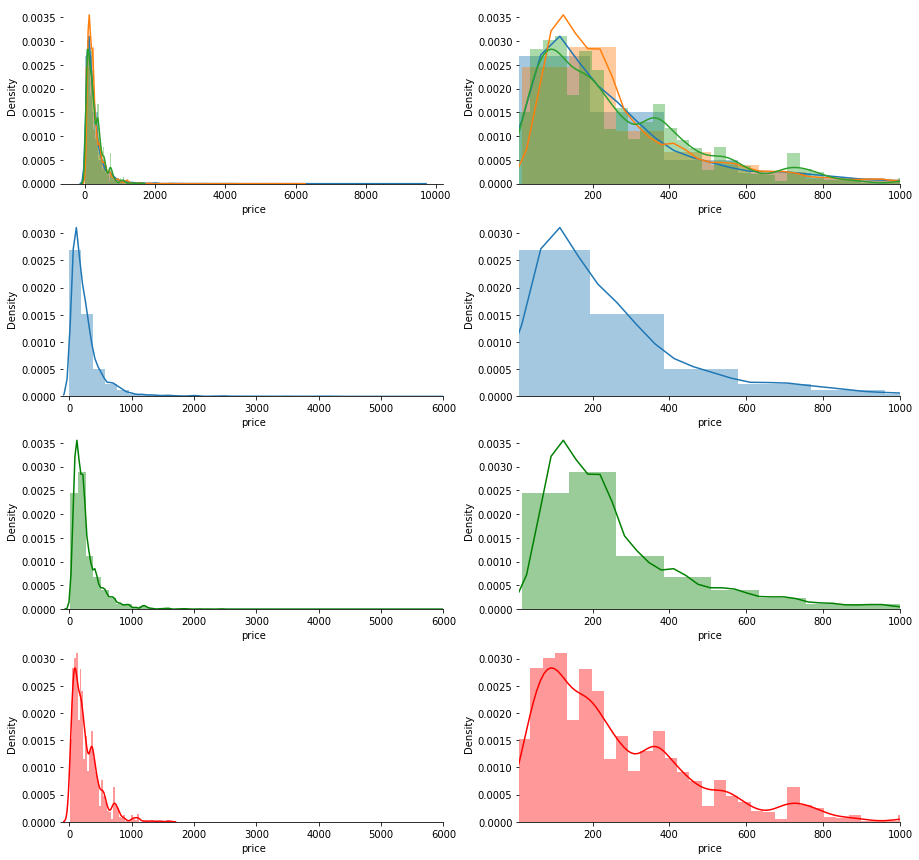

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

f, axes = plt.subplots(4, 2, figsize=(15, 15))
sns.despine(left=True)

sns.distplot(df.price[df.brand == 0], ax = axes[1,0]);
axes[1,0].set_xlim([-100,6000]);
sns.distplot(df.price[df.brand == 0], ax = axes[1,1]);
axes[1,1].set_xlim([10,1000]);

sns.distplot(df.price[df.brand == 1], color='g', ax = axes[2,0]),
axes[2,0].set_xlim([-100,6000]);
sns.distplot(df.price[df.brand == 1], color='g', ax = axes[2,1]);
axes[2,1].set_xlim([10,1000]);

sns.distplot(df.price[df.brand == 5], color = 'r', ax = axes[3,0]);
axes[3,0].set_xlim([-100,6000]);
sns.distplot(df.price[df.brand == 5], color = 'r', ax = axes[3,1]);
axes[3,1].set_xlim([10,1000]);

sns.distplot(df.price[df.brand == 0], ax = axes[0,0]);
sns.distplot(df.price[df.brand == 0], ax = axes[0,1]);
sns.distplot(df.price[df.brand == 1], ax = axes[0,0]);
sns.distplot(df.price[df.brand == 1], ax = axes[0,1]);
sns.distplot(df.price[df.brand == 5], ax = axes[0,0]);
sns.distplot(df.price[df.brand == 5], ax = axes[0,1]);
axes[0,1].set_xlim([10,1000]); #브랜드별 상품 분포

In [ ]:
# 브랜드별 

In [ ]:
pd.DataFrame(df.groupby(['year_quarter','brand'])['price'].sum()).T

year_quarter 2018-4                          ... 2020-3 2020-4                       
brand             0     1   2   4     5   6  ...      6      0       1   2   4      5
price        140586 52099 245 946 13151 458  ...    133 782855 1064501 405 147 233437

[1 rows x 49 columns]

In [ ]:
brand_sale = pd.DataFrame(df.groupby(['year_quarter','brand'])['price'].sum()).reset_index()
brand_sale.head()

,year_quarter,brand,price
0,2018-4,0,140586
1,2018-4,1,52099
2,2018-4,2,245
3,2018-4,4,946
4,2018-4,5,13151


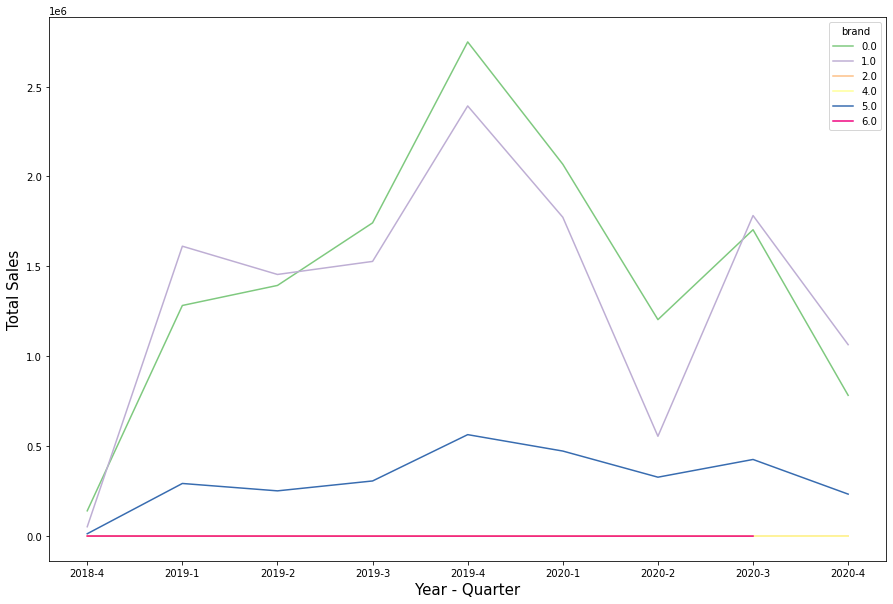

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [15, 10]
sns.lineplot(x = 'year_quarter', y = 'price', hue = 'brand', data = brand_sale, palette = 'Accent');
plt.xlabel('Year - Quarter', fontsize = 15)
plt.ylabel('Total Sales', fontsize = 15)
plt.show();

# **Trend 분석**

### ✔︎ 상품별 분석


In [ ]:
df.groupby('product_id')[['category_code','brand','price']].agg(['count','sum'])

category_code  ... price
                            count  ...   sum
product_id                         ...      
1313550904313512734             1  ...   322
1313551195582759731             2  ...   408
1313551636999701338             3  ...   133
1313551664447226717            20  ...  8554
1313551677961274206             1  ...   150
...                           ...  ...   ...
2415519414561538715             1  ...   218
2430001796257677984             1  ...   261
2436554985878585992             1  ...   537
2440041221880545732             1  ...   170
2440041221880545736             1  ...   466

[9481 rows x 6 columns]

In [ ]:
df.product_id.mode()

0    1956663847666319760
dtype: object

In [ ]:
pop_product_id = df['product_id'].value_counts()[:20]
pop_product_id

1956663847666319760    802
1956663845585944582    629
1956663847725040099    628
1956663840242401751    590
1956663836450751375    563
1956663836207481430    561
1956663836207481431    502
1956663831283368958    486
1956663840309510725    478
1352907200745439279    371
1956663845862769039    370
1956663845720162501    352
1956663831300145187    341
1956663845644664920    302
1924582891589731058    289
1956663840401785541    283
1956663830721331445    270
1956663845736939733    268
1956663836031320509    263
1515966223286862478    258
Name: product_id, dtype: int64

In [ ]:
pop_product = df[df.product_id.isin(pop_product_id.index)][['product_id','category_code','brand','price','color','metal','gem']]
pop_product = pop_product.drop_duplicates(keep = 'first')
pop_product

#인기 상품은 거의 다 ring!!!

,product_id,category_code,brand,price,color,metal,gem
1113,1956663845644664920,jewelry.ring,0,329,red,gold,diamond
1496,1956663836450751375,jewelry.ring,1,108,red,gold,NaN
1724,1956663845720162501,jewelry.ring,1,146,red,gold,NaN
1762,1956663831300145187,jewelry.ring,1,154,red,gold,NaN
1818,1956663836207481431,jewelry.ring,1,103,red,gold,NaN
1885,1956663840242401751,jewelry.ring,1,203,red,gold,NaN
2023,1956663847725040099,jewelry.ring,1,221,NaN,gold,NaN
2130,1956663845862769039,jewelry.ring,0,262,white,gold,NaN
2325,1956663845585944582,jewelry.ring,1,122,white,gold,NaN
2486,1956663836207481430,jewelry.ring,1,91,red,gold,NaN


In [ ]:
# 왜 링일까?

df.groupby('category_code')['product_id'].agg(['count']).T

category_code,jewelry.bracelet,jewelry.brooch,jewelry.earring,jewelry.necklace,jewelry.pendant,jewelry.ring,jewelry.souvenir,jewelry.stud
count,7163,1302,36021,2473,16456,39266,291,39


In [ ]:
# 왜 링일까?

df.groupby('category_code')['price'].agg(['count','mean']).T #평균 가격도 비싸고, 많이 출시도 하고. 이어링이랑 비슷한 ㅊ루

category_code,jewelry.bracelet,jewelry.brooch,jewelry.earring,jewelry.necklace,jewelry.pendant,jewelry.ring,jewelry.souvenir,jewelry.stud
count,7163,1302,36021,2473,16456,39266,291,39
mean,381,198,312,400,124,297,27,298


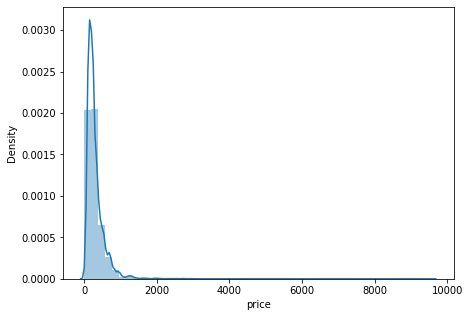

In [ ]:
jewelry_type = df.category_code.unique()
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [7, 5]
sns.distplot(df[df.category_code == 'jewelry.ring']['price']);

In [ ]:
df.category_code.unique()

array(['jewelry.pendant', 'jewelry.ring', 'jewelry.earring',
       'jewelry.bracelet', 'jewelry.stud', 'jewelry.brooch',
       'jewelry.necklace', 'jewelry.souvenir'], dtype=object)

(-100.0, 2000.0)

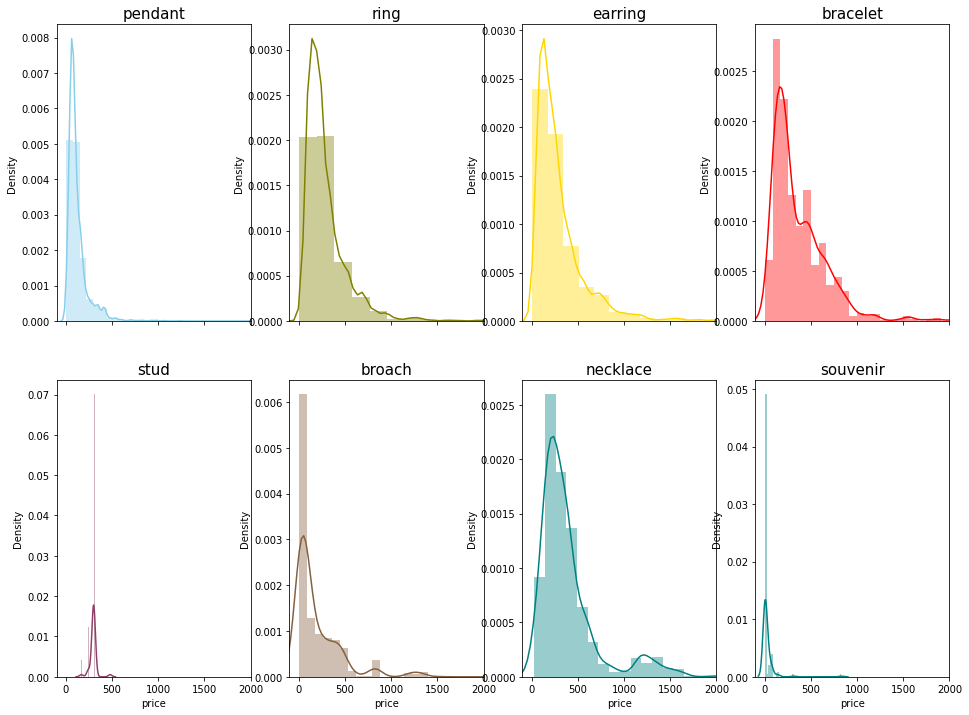

In [ ]:
import seaborn
#seaborn.set(style='ticks', context='paper')

# plot
f, axes = plt.subplots(2, 4, figsize=(16, 12), sharex=True)
sns.distplot( df[df.category_code == 'jewelry.pendant']['price'], color="skyblue", ax=axes[0, 0])
axes[0,0].set_title('pendant', fontsize = 15)
sns.distplot( df[df.category_code == 'jewelry.ring']['price'], color="olive", ax=axes[0, 1])
axes[0,1].set_title('ring', fontsize = 15)
sns.distplot( df[df.category_code == 'jewelry.earring']['price'], color="gold", ax=axes[0, 2])
axes[0,2].set_title('earring', fontsize = 15)
sns.distplot( df[df.category_code == 'jewelry.bracelet']['price'], color="red", ax=axes[0, 3])
axes[0,3].set_title('bracelet', fontsize = 15)
sns.distplot( df[df.category_code == 'jewelry.stud']['price'], color="#8f4068", ax=axes[1, 0])
axes[1,0].set_title('stud', fontsize = 15)
sns.distplot( df[df.category_code == 'jewelry.brooch']['price'], color="#85603f", ax=axes[1, 1])
axes[1,1].set_title('broach', fontsize = 15)
sns.distplot( df[df.category_code == 'jewelry.necklace']['price'], color="teal", ax=axes[1, 2])
axes[1,2].set_title('necklace', fontsize = 15)
sns.distplot( df[df.category_code == 'jewelry.souvenir']['price'],color="teal", ax=axes[1, 3])
axes[1,3].set_title('souvenir', fontsize = 15)

plt.xlim(-100,2000)

In [ ]:
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,68
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,33
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,74
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:03:40,05,Sunday,morning,2300738475193794654,1.5159156254536732e+18,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1,1,439,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,439
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0,1,351,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0,1,407,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,407
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,427


In [ ]:
df.metal.value_counts()

gold        101632
silver        1356
platinum         3
Name: metal, dtype: int64

### ✔︎ Trend Leader 분석

In [ ]:
product_count = pd.DataFrame(df.product_id.value_counts())
morethan100 = product_count[product_count.product_id >= 100].index
morethan100

Index(['1956663847666319760', '1956663845585944582', '1956663847725040099',
       '1956663840242401751', '1956663836450751375', '1956663836207481430',
       '1956663836207481431', '1956663831283368958', '1956663840309510725',
       '1352907200745439279', '1956663845862769039', '1956663845720162501',
       '1956663831300145187', '1956663845644664920', '1924582891589731058',
       '1956663840401785541', '1956663830721331445', '1956663845736939733',
       '1956663836031320509', '1515966223286862478', '1956663848194802489',
       '1956663831274980339', '1956663845334287095', '1956663845569168363',
       '1956663846349308653', '1956663836400419658', '1956663845745328354',
       '1956663836769517900', '1956663840250790374', '1956663847725040105',
       '1956663845627887682', '1956663846273811079', '1956663845577556991',
       '1956663831182705514', '1956663848219968340', '1956663847481770106',
       '1956663847372719084', '1956663836224258664', '1956663848287077291',
       '1956

In [ ]:
for product in morethan100:
  data = df[df.product_id == product].sort_values(['date','time'])
  first = data[:1]['date'].values[0]
  last = data[-1:]['date'].values[0]
  print(f'product: {product} \ntime: {first} ~ {last} \n')

product: 1956663847666319760 
time: 2019-01-18T00:00:00.000000000 ~ 2020-11-29T00:00:00.000000000 

product: 1956663845585944582 
time: 2019-01-15T00:00:00.000000000 ~ 2020-11-27T00:00:00.000000000 

product: 1956663847725040099 
time: 2019-01-15T00:00:00.000000000 ~ 2020-11-29T00:00:00.000000000 

product: 1956663840242401751 
time: 2019-01-15T00:00:00.000000000 ~ 2020-11-21T00:00:00.000000000 

product: 1956663836450751375 
time: 2019-01-15T00:00:00.000000000 ~ 2020-11-27T00:00:00.000000000 

product: 1956663836207481430 
time: 2019-01-15T00:00:00.000000000 ~ 2020-11-29T00:00:00.000000000 

product: 1956663836207481431 
time: 2019-01-15T00:00:00.000000000 ~ 2020-11-29T00:00:00.000000000 

product: 1956663831283368958 
time: 2019-01-16T00:00:00.000000000 ~ 2020-11-27T00:00:00.000000000 

product: 1956663840309510725 
time: 2019-01-16T00:00:00.000000000 ~ 2020-11-29T00:00:00.000000000 

product: 1352907200745439279 
time: 2019-01-21T00:00:00.000000000 ~ 2020-11-21T00:00:00.000000000 



In [ ]:
timeline = []

for product in morethan100:
  data = df[df.product_id == product].sort_values(['date','time'])
  first = data[:1]['date'].values[0]
  last = data[-1:]['date'].values[0]

  timeline.append(
      {
          'product' : product,
          'first_date' : first,
          'last_date' : last
      }
  )

timeline = pd.DataFrame(timeline)
timeline

,product,first_date,last_date
0,1956663847666319760,2019-01-18,2020-11-29
1,1956663845585944582,2019-01-15,2020-11-27
2,1956663847725040099,2019-01-15,2020-11-29
3,1956663840242401751,2019-01-15,2020-11-21
4,1956663836450751375,2019-01-15,2020-11-27
...,...,...,...
81,1956663846139593182,2019-01-14,2020-11-23
82,1956663830796829031,2019-02-05,2020-11-29
83,1939220074049044543,2018-12-22,2020-11-26
84,1956663836123595291,2019-01-14,2020-11-17


In [ ]:
timeline['first_date'] = pd.to_datetime(timeline['first_date'])
timeline['last_date'] = pd.to_datetime(timeline['last_date'])

timeline['first_date'] = pd.to_datetime(timeline['first_date'])
timeline['last_date'] = pd.to_datetime(timeline['last_date'])
timeline = timeline.rename( columns = {'product' : 'Task', 'first_date' : 'Start', 'last_date' : 'Finish'})

In [ ]:
import plotly.express as px
import plotly.figure_factory as ff

fig = px.timeline(timeline, x_start="Start", x_end="Finish", y="Task", width=1000, height=800)
fig.update_yaxes(autorange="reversed") # otherwise tasks are listed from the bottom up
fig.update_traces(width=0.2)
fig.show()

In [ ]:
df_morethan100 = df[df.product_id.isin(morethan100)]
df_morethan100 = pd.DataFrame(df_morethan100.groupby(['product_id','year_quarter']).price.sum()).reset_index().rename(columns = {'price':'Total_Sales'})
df_morethan100

,product_id,year_quarter,Total_Sales
0,1313553543965180896,2019-1,1003
1,1313553543965180896,2019-2,17052
2,1313553543965180896,2019-3,7523
3,1313553543965180896,2019-4,9027
4,1313553543965180896,2020-1,9027
...,...,...,...
669,1956663848396128320,2019-4,9201
670,1956663848396128320,2020-1,4313
671,1956663848396128320,2020-2,575
672,1956663848396128320,2020-3,4313


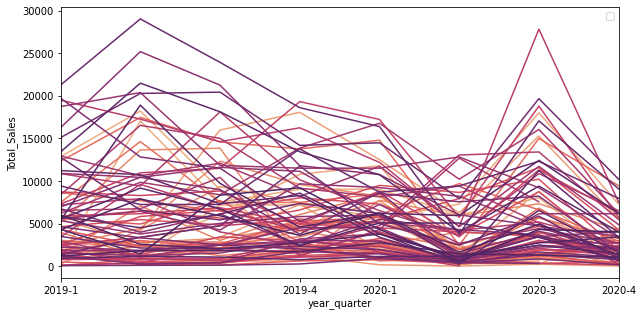

In [ ]:
sns.lineplot(x = 'year_quarter', y = 'Total_Sales', hue= 'product_id', estimator=None, data = df_morethan100, palette= 'flare');
plt.legend('');
plt.xlim('2019-1','2020-4');

In [ ]:
df[df.product_id.isin(morethan100)] #인기 있는 상품들을 구매한 구매자들 목록

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter
215,2018-12-02,18:27:23,12,Sunday,evening,1925648767768330465,1.515915625233911e+18,1917419394766471463,1.8068292018823498e+18,jewelry.ring,0,1,342,f,red,gold,diamond,2018-12-01,1,5,2018,4,2018-4,5,1712
216,2018-12-03,07:31:34,12,Monday,morning,1926043464122761756,1.515915625203785e+18,1917419394766471463,1.8068292018823498e+18,jewelry.ring,0,1,342,f,red,gold,diamond,2018-12-01,2,5,2018,4,2018-4,5,1712
217,2018-12-03,13:10:00,12,Monday,afternoon,1926213803909841134,1.515915625233911e+18,1917419394766471463,1.8068292018823498e+18,jewelry.ring,0,1,342,f,red,gold,diamond,2018-12-01,2,5,2018,4,2018-4,5,1712
218,2018-12-04,13:08:31,12,Tuesday,afternoon,1926937834480992554,1.5159156252058186e+18,1917419394766471463,1.8068292018823498e+18,jewelry.ring,0,1,342,f,red,gold,diamond,2018-12-01,1,5,2018,4,2018-4,5,1712
219,2018-12-08,08:07:44,12,Saturday,morning,1929685547215749176,1.5159156252302559e+18,1917419394766471463,1.8068292018823498e+18,jewelry.ring,0,1,342,f,red,gold,diamond,2018-12-01,1,5,2018,4,2018-4,5,1712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102388,2020-11-11,09:14:39,11,Wednesday,morning,2439961341604135599,1.5159156254283694e+18,1515966222864636714,1.8068292018823498e+18,jewelry.ring,0,1,240,f,red,gold,fianit,2020-11-01,1,1,2020,4,2020-4,1,240
102507,2020-11-14,15:01:07,11,Saturday,afternoon,2442310048261603389,1.515915625246807e+18,1956663840401785541,1.8068292018823498e+18,jewelry.ring,0,1,254,NaN,red,gold,NaN,2020-11-01,1,1,2020,4,2020-4,1,254
102589,2020-11-16,20:35:38,11,Monday,evening,2443927964547547271,1.5159156255399534e+18,1912564007428948276,1.8068292019159043e+18,jewelry.pendant,0,1,68,f,red,gold,topaz,2020-11-01,1,1,2020,4,2020-4,1,68
102644,2020-11-17,12:55:39,11,Tuesday,afternoon,2444421225208873575,1.515915625540333e+18,1956663836601745513,1.8068292018907384e+18,jewelry.earring,0,1,85,f,red,gold,NaN,2020-11-01,2,2,2020,4,2020-4,2,169


In [ ]:
df[df.product_id.isin(morethan100)].price.sum() #인기 있는 상품들을 구매한 구매자들 목록

3470128.43

In [ ]:
df.price.sum()

28920719.240000006

In [ ]:
from category_encoders import OrdinalEncoder #user_id가 다 거기서 거기라 보기가 불편합니다. 인코딩을 해서 보기 편하게 만들어야겠습니다.
ecd = OrdinalEncoder()
df.user_id = ecd.fit_transform(df.user_id)
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,68
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,2,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,33
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,3,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,4,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,74
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,5,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:03:40,05,Sunday,morning,2300738475193794654,42668,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1,1,439,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,439
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0,1,351,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0,1,407,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,407
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,427


In [ ]:
early_user = []
all_user = []

for product in morethan100:
  data = df[df.product_id == product].sort_values(['date','time'])
  early = int(len(data)*0.2)
  all = len(data)
  
  early_user.append(data[:early].user_id)
  all_user.append(data[:all].user_id)

In [ ]:
early_user = np.array(early_user)
all_user = np.array(all_user)

early_user = pd.DataFrame(early_user).rename(columns = {0 : 'Users'})
all_user = pd.DataFrame(all_user).rename(columns = {0 : 'Users'})
early_user

,Users
0,4827 253 4828 96 4829 2498 4830...
1,2325 1390 2326 1390 2327 1391 2328...
2,2023 513 2024 513 2025 768 2026...
3,1885 1219 1886 1219 1887 1040 1888...
4,1496 251 1497 1039 1498 1040 1499...
...,...
81,1258 860 1259 861 1260 665 1261...
82,10367 5240 10368 513 10369 354 1037...
83,759 304 760 101 761 533 762 ...
84,1211 820 1212 821 1213 822 1214...


In [ ]:
all_user

,Users
0,4827 253 4828 96 4829 2498 4...
1,2325 1390 2326 1390 2327 1391 2...
2,2023 513 2024 513 2025 768 2...
3,1885 1219 1886 1219 1887 1040 1...
4,1496 251 1497 1039 1498 1040 1...
...,...
81,1258 860 1259 861 1260 665 1...
82,10367 5240 10368 513 10369 354 1...
83,759 304 760 101 761 533 7...
84,1211 820 1212 821 1213 82...


In [ ]:
from collections import Counter
from itertools import chain

early_count = Counter(chain.from_iterable(early_user['Users']))
all_count = Counter(chain.from_iterable(all_user['Users']))

In [ ]:
early_count.most_common() #774번 고객은 무려 86개 상품 중 61개의 상품에서 early buyer!!!

[(774, 61),
 (96, 45),
 (101, 39),
 (59, 37),
 (105, 30),
 (1211, 28),
 (665, 22),
 (437, 21),
 (513, 20),
 (1042, 20),
 (718, 19),
 (453, 18),
 (154, 18),
 (1018, 18),
 (1324, 17),
 (805, 17),
 (47, 17),
 (48, 16),
 (1314, 14),
 (869, 14),
 (334, 14),
 (503, 14),
 (1068, 13),
 (781, 12),
 (779, 12),
 (6388, 12),
 (1197, 12),
 (202, 11),
 (1084, 11),
 (556, 11),
 (456, 11),
 (1123, 11),
 (149, 11),
 (367, 11),
 (780, 11),
 (1066, 11),
 (6368, 11),
 (435, 11),
 (6485, 10),
 (164, 10),
 (533, 10),
 (1045, 10),
 (632, 10),
 (1222, 10),
 (1200, 9),
 (438, 9),
 (261, 9),
 (1043, 9),
 (1050, 9),
 (2780, 8),
 (1389, 8),
 (303, 8),
 (1232, 8),
 (1204, 8),
 (6377, 8),
 (471, 8),
 (854, 8),
 (1310, 7),
 (1171, 7),
 (462, 7),
 (1563, 7),
 (1029, 7),
 (1235, 7),
 (43, 7),
 (1049, 7),
 (1051, 7),
 (353, 7),
 (1190, 7),
 (1126, 7),
 (6375, 7),
 (757, 7),
 (685, 7),
 (2471, 6),
 (1151, 6),
 (1312, 6),
 (6476, 6),
 (1408, 6),
 (2469, 6),
 (1313, 6),
 (1453, 6),
 (1194, 6),
 (1181, 6),
 (1186, 6),
 (20

In [ ]:
61/86*100

70.93023255813954

In [ ]:
all_count.most_common() #1092번 고객은 얼리어답터 - 트렌드 팔로워 중 어딘가. 757번 고객은 어쩌구 저쩌구. '트렌드 리더'는 존재한다.

[(805, 137),
 (774, 116),
 (59, 91),
 (437, 87),
 (1200, 83),
 (101, 83),
 (96, 82),
 (154, 81),
 (48, 77),
 (6388, 74),
 (30242, 74),
 (6407, 66),
 (718, 65),
 (43, 63),
 (513, 62),
 (15948, 59),
 (105, 58),
 (1235, 55),
 (30246, 55),
 (16132, 54),
 (1211, 52),
 (303, 51),
 (12950, 51),
 (34708, 50),
 (1389, 48),
 (1068, 45),
 (475, 44),
 (1186, 43),
 (202, 42),
 (47, 41),
 (10895, 40),
 (632, 40),
 (11597, 40),
 (141, 39),
 (792, 38),
 (6385, 36),
 (23544, 36),
 (1114, 35),
 (334, 35),
 (685, 35),
 (1232, 34),
 (1143, 34),
 (2971, 33),
 (453, 32),
 (3609, 31),
 (6419, 30),
 (6471, 30),
 (3435, 30),
 (1029, 29),
 (164, 29),
 (665, 29),
 (14366, 29),
 (1084, 28),
 (642, 28),
 (4930, 27),
 (11018, 27),
 (869, 26),
 (976, 26),
 (2469, 26),
 (30481, 26),
 (1942, 25),
 (6357, 25),
 (11329, 25),
 (1313, 25),
 (1018, 25),
 (1204, 25),
 (764, 24),
 (757, 24),
 (25250, 24),
 (7515, 24),
 (15962, 23),
 (6643, 23),
 (16573, 22),
 (17214, 22),
 (16723, 22),
 (34212, 21),
 (503, 21),
 (2966, 21),


In [ ]:
print(len(early_count), len(all_count))

1789 8305


In [ ]:
df.user_id.nunique()

42668

In [ ]:
#pd.options.display.max_rows = 999
pd.set_option('display.float_format', '{:.0e}'.format)

print('Trend Leader ID:')
print(ecd.mapping[0]['mapping'][756:757].index[0])
print(ecd.mapping[0]['mapping'][40:41].index[0])
print(ecd.mapping[0]['mapping'][58:59].index[0])

print('\nLoyal Trend Follower ID:')
print(ecd.mapping[0]['mapping'][804:805].index[0])
print(ecd.mapping[0]['mapping'][773:774].index[0])
print(ecd.mapping[0]['mapping'][58:59].index[0])
print(ecd.mapping[0]['mapping'][436:437].index[0])
print(ecd.mapping[0]['mapping'][1199:1200].index[0])

Trend Leader ID:
1.5159156252085763e+18
1.5159156251556114e+18
1.5159156252125676e+18

Loyal Trend Follower ID:
1.515915625245643e+18
1.5159156252405898e+18
1.5159156252125676e+18
1.5159156252141396e+18
1.5159156250451197e+18


In [ ]:
pd.set_option('display.float_format', '{:.0e}'.format)
pd.reset_option('display.float_format', '{:.0e}'.format)

In [ ]:
trend_leader = [757, 41, 49, 59, 52]
df[df.user_id.isin(trend_leader)].sort_values(['date','time']).tail(20)[['date','product_id','category_code','brand','price','color','metal','gem']] #1313570294371189670

,date,product_id,category_code,brand,price,color,metal,gem
59502,2020-01-29,1455088600633836104,jewelry.ring,0.0,336.96,white,gold,diamond
58651,2020-02-02,1917418488553537823,jewelry.ring,0.0,266.99,red,gold,diamond
62135,2020-02-02,1917999732609778231,jewelry.earring,0.0,366.75,red,gold,diamond
62596,2020-02-10,1956663836274590384,jewelry.ring,1.0,308.19,white,gold,diamond
62853,2020-02-10,1956663830880715238,jewelry.earring,1.0,431.37,white,gold,diamond
69669,2020-02-12,1515966223087669132,jewelry.ring,0.0,437.64,red,gold,diamond
69453,2020-02-21,1956663846273811080,jewelry.earring,1.0,139.70,red,gold,citrine
71459,2020-02-21,1956663836576579657,jewelry.brooch,5.0,804.42,red,gold,diamond
71469,2020-02-21,1515966223447704828,jewelry.pendant,0.0,230.10,red,gold,pearl
71486,2020-02-21,1956663836350087959,jewelry.ring,0.0,4672.58,yellow,gold,diamond


### ✔︎ 시각화

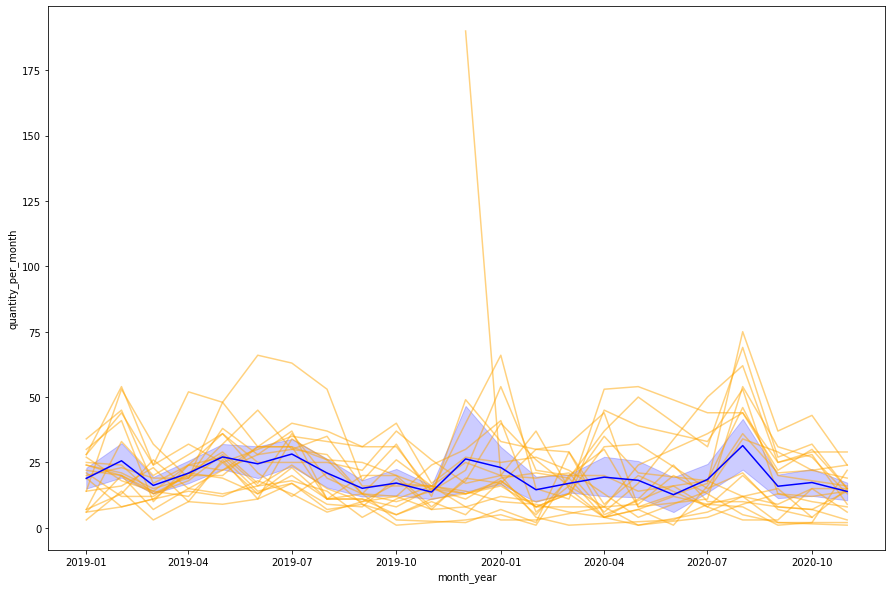

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

p = df[df.product_id.isin(pop_product_id.index)][['month_year','product_id','quantity_per_month','price']].drop_duplicates(keep = 'first')

plt.rcParams['figure.figsize'] = [15, 10]
sns.lineplot(x = 'month_year', y = 'quantity_per_month', units="product_id", estimator=None, data = p, alpha = 0.5, color = 'orange');
sns.lineplot(x = 'month_year', y = 'quantity_per_month', data = p, color = 'blue');

#mean and 95% confidence interval

(0.0, 100.0)

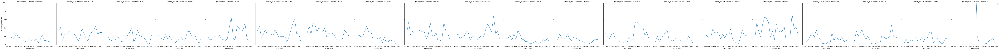

In [ ]:
sns.relplot(x = 'month_year',
            y = 'quantity_per_month', 
            col = 'product_id', 
            estimator=None, 
            data = p,  
            palette='Accent', 
            kind = 'line');
plt.legend('')
plt.ylim(0,100);

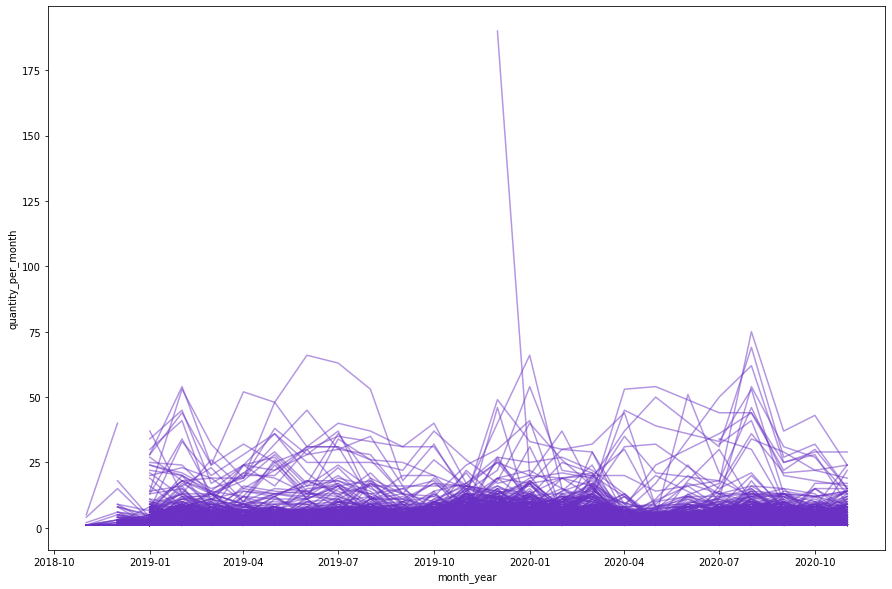

In [ ]:
all = df[['month_year','product_id','quantity_per_month','price']].drop_duplicates(keep = 'first')

plt.rcParams['figure.figsize'] = [15, 10]
import seaborn as sns
sns.lineplot(x = 'month_year', y = 'quantity_per_month', units = 'product_id', estimator=None, alpha = 0.5, data = all, color = '#6930c3');
#ns.lineplot(x = 'month_year', y = 'quantity_per_month', data = all[all.quantity_per_month >= 20], color = '#16c79a');
#mean and 95% confidence interval

NameError: ignored

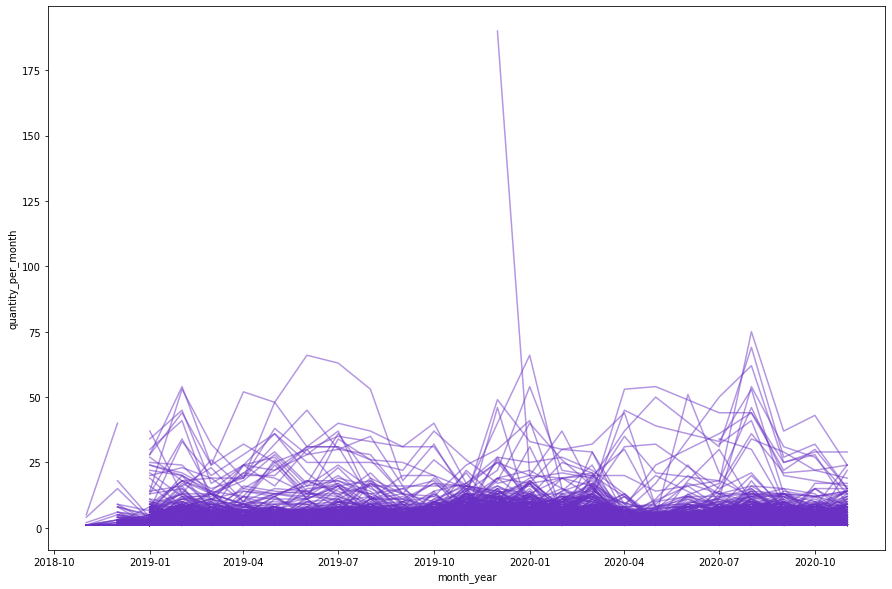

In [ ]:
all = df[['month_year','product_id','quantity_per_month','price']].drop_duplicates(keep = 'first')

plt.rcParams['figure.figsize'] = [15, 10]
import seaborn as sns
sns.lineplot(x = 'month_year', y = 'quantity_per_month', units = 'product_id', estimator=None, alpha = 0.5, data = all, color = '#6930c3');
plt.xlim(xmin= datetime.datetime(2018, 11, 1),
         xmax= datetime.datetime(2019, 5, 1)
         ) 
plt.ylim(0,100)

In [ ]:
df.dtypes

In [ ]:
all = df[['month_year','product_id','quantity_per_month','price']].drop_duplicates(keep = 'first')

In [ ]:
df.quantity_per_month.value_counts()
#월에 1개 팔린게 무려 26000개. 20%. 적어도 15개는 넘어여 좀 팔렦다고 할 수 있음. 15개 이상인 애들만 뽑아보기.

In [ ]:
all

(0.0, 75.0)

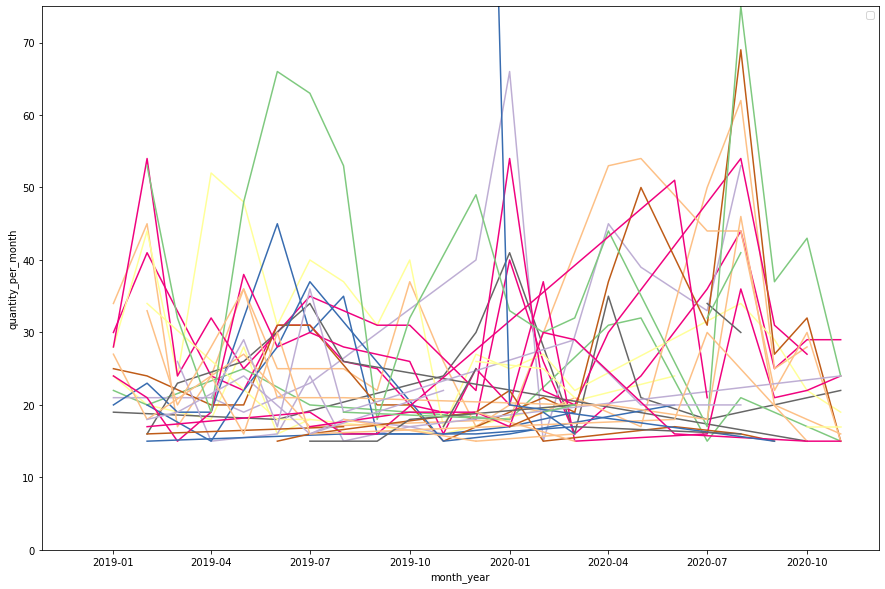

In [ ]:
#좀 팔린 애들만 뽑아서 트렌드 분석.
trend = all[all.quantity_per_month >= 15] #한번이라도 한달에 15개이상 팔린 상품은 240개.
trend

palette = sns.color_palette("mako_r", 84)

sns.lineplot(x = 'month_year', y = 'quantity_per_month', hue = 'product_id', estimator=None, data = trend,  palette='Accent', color = '#6930c3');
plt.legend('')
#sns.lineplot(x = 'month_year', y = 'quantity_per_month', data = trend, color = '#16c79a');
plt.ylim(0,75)

In [ ]:
year = pd.DataFrame(trend.product_id.value_counts())
year = year[year.product_id >= 12]
year.index # >= 12 #일년은 지켜봐야 트렌드 ...

Index(['1956663840242401751', '1956663847666319760', '1956663831283368958',
       '1956663836450751375', '1956663847725040099', '1956663836207481430',
       '1956663845585944582', '1956663840309510725', '1956663845862769039',
       '1352907200745439279'],
      dtype='object')

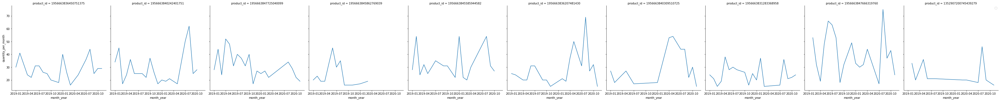

In [ ]:
sns.relplot(x = 'month_year',
            y = 'quantity_per_month', 
            col = 'product_id', 
            estimator=None, 
            data = trend[trend.product_id.isin(year.index)],  
            palette='Accent', 
            kind = 'line');
plt.legend('')

In [ ]:
all[all.quantity_per_month >= 15].product_id.nunique()

In [ ]:
trend

# **Sales 분석**

### ✔︎ 시간대별 분석

- 시기(월)별로 구매 금액, 평균값, 최댓값 등에 차이가 있는가?
- 소비자들은 주로 어떤 시간대에 구매하는가?
- 구매가 유난히 많이 발생하는 요일이 있는가?

In [ ]:
print('Order by Month')
display(df.groupby('month').price.agg(['count','mean','sum']).T)

print('\nOrder by time')
display(df.groupby('ampm').price.agg(['count','mean','sum']).T)

print('\nOrder by day')
display(df.groupby('day').price.agg(['count','mean' ,'sum']).T[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])

Order by Month


month,01,02,03,04,05,06,07,08,09,10,11,12
count,9.136000e+03,1.026200e+04,9.662000e+03,6.708000e+03,6.260000e+03,6.941000e+03,8.817000e+03,1.002400e+04,7.829000e+03,8.862000e+03,1.010900e+04,8.401000e+03
mean,2.648486e+02,2.720678e+02,2.650412e+02,2.630540e+02,2.577826e+02,2.836826e+02,2.837257e+02,2.886143e+02,2.888733e+02,2.902442e+02,3.125737e+02,2.871954e+02
sum,2.419657e+06,2.791960e+06,2.560828e+06,1.764566e+06,1.613719e+06,1.969041e+06,2.501609e+06,2.893070e+06,2.261589e+06,2.572144e+06,3.159808e+06,2.412728e+06



Order by time


ampm,afternoon,evening,morning,night
count,3.911000e+04,1.702100e+04,4.288700e+04,3.993000e+03
mean,2.904489e+02,2.579497e+02,2.830005e+02,2.588677e+02
sum,1.135946e+07,4.390562e+06,1.213704e+07,1.033659e+06



Order by day


day,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
count,1.380000e+04,1.498400e+04,1.489400e+04,1.634300e+04,1.575600e+04,1.404200e+04,1.319200e+04
mean,2.762426e+02,2.820188e+02,2.766915e+02,2.754705e+02,2.784129e+02,2.904070e+02,2.876877e+02
sum,3.812148e+06,4.225769e+06,4.121043e+06,4.502014e+06,4.386674e+06,4.077895e+06,3.795176e+06


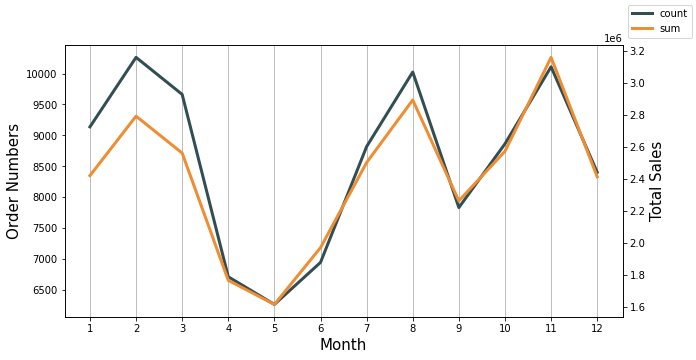

In [ ]:
month_sales = df.groupby('month').price.agg(['count','mean','sum']).reset_index()

plt.rcParams['figure.figsize'] = [10, 5]

ax = month_sales.plot(x = 'month', y = 'count', color = '#314e52', linewidth = 3, legend = False);
ax.set_xlabel('Month',fontsize = 15)
ax.set_ylabel('Order Numbers', fontsize = 15)
ax2 = ax.twinx()
month_sales.plot(x = 'month', y = 'sum', ax = ax2, color = "#ef8d32", linewidth = 3, legend = False);
ax2.set_ylabel('Total Sales', fontsize = 15)
ax.figure.legend()
ticks = range(1,13,1)
ax.set_xticks(range(0,12,1), minor=False)
ax.set_xticklabels(ticks)
ax.grid(axis = 'x')
plt.show()

In [ ]:
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,68
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,33
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,74
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:03:40,05,Sunday,morning,2300738475193794654,1.5159156254536732e+18,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1,1,439,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,439
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0,1,351,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0,1,407,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,407
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,427


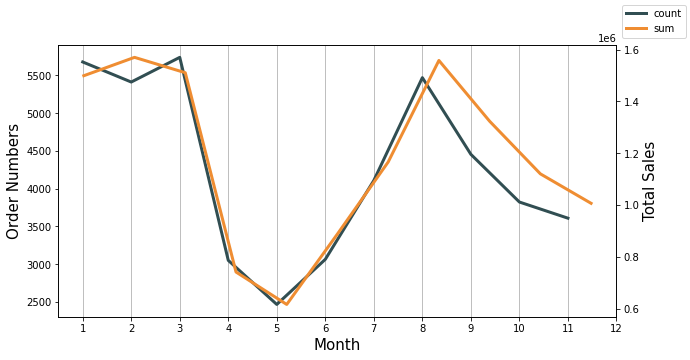

In [ ]:
month_sales = df[df.year == 2020].groupby('month').price.agg(['count','mean','sum']).reset_index()

plt.rcParams['figure.figsize'] = [10, 5]

ax = month_sales.plot(x = 'month', y = 'count', color = '#314e52', linewidth = 3, legend = False);
ax.set_xlabel('Month',fontsize = 15)
ax.set_ylabel('Order Numbers', fontsize = 15)
ax2 = ax.twinx()
month_sales.plot(x = 'month', y = 'sum', ax = ax2, color = "#ef8d32", linewidth = 3, legend = False);
ax2.set_ylabel('Total Sales', fontsize = 15)
ax.figure.legend()
ticks = range(1,13,1)
ax.set_xticks(range(0,12,1), minor=False)
ax.set_xticklabels(ticks)
ax.grid(axis = 'x')
plt.show()

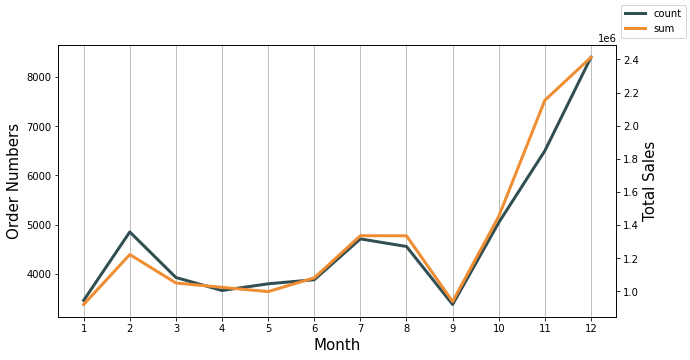

In [ ]:
month_sales = df[df.year != 2020].groupby('month').price.agg(['count','mean','sum']).reset_index()

plt.rcParams['figure.figsize'] = [10, 5]

ax = month_sales.plot(x = 'month', y = 'count', color = '#314e52', linewidth = 3, legend = False);
ax.set_xlabel('Month',fontsize = 15)
ax.set_ylabel('Order Numbers', fontsize = 15)
ax2 = ax.twinx()
month_sales.plot(x = 'month', y = 'sum', ax = ax2, color = "#ef8d32", linewidth = 3, legend = False);
ax2.set_ylabel('Total Sales', fontsize = 15)
ax.figure.legend()
ticks = range(1,13,1)
ax.set_xticks(range(0,12,1), minor=False)
ax.set_xticklabels(ticks)
ax.grid(axis = 'x')
plt.show()

In [ ]:
df['time'] = pd.to_datetime(df['time'], format='%H:%M:%S')
df['hour'] = df.time.dt.hour
df['time'] = df['time'].dt.time
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter,hour
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0.0,1,67.78,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,67.78,16
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,2,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0.0,1,32.63,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,32.63,16
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,3,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1.0,1,75.21,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75.21,17
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,4,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1.0,1,73.93,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,73.93,23
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,5,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0.0,1,131.37,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131.37,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:03:40,05,Sunday,morning,2300738475193794654,42668,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1.0,1,438.67,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,438.67,7
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0.0,1,351.33,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351.33,7
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0.0,1,406.71,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,406.71,7
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5.0,1,426.62,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,426.62,7


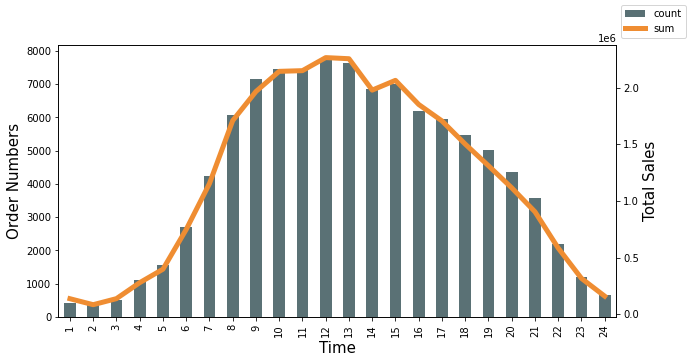

In [ ]:
time_sales = df.groupby('hour').price.agg(['count','sum']).reset_index()

plt.rcParams['figure.figsize'] = [10, 5]

ax = time_sales.plot.bar(x = 'hour', y = 'count', color = '#314e52', linewidth = 3, legend = False, alpha = 0.8);
ax.set_xlabel('Time',fontsize = 15)
ax.set_ylabel('Order Numbers', fontsize = 15)
ax2 = ax.twinx()
time_sales.plot(x = 'hour', y = 'sum', ax = ax2, color = "#ef8d32", linewidth = 5, legend = False);
ax2.set_ylabel('Total Sales', fontsize = 15)
ax.figure.legend()
ax.set_xticklabels(range(24))
ticks = range(1,25,1)
ax.set_xticks(range(0,24,1), minor=False)
ax.set_xticklabels(ticks)
plt.show()

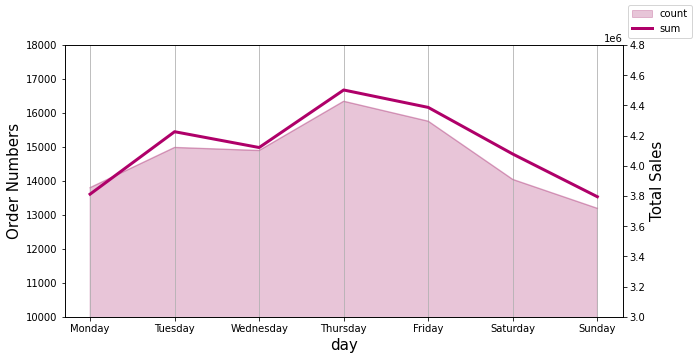

In [ ]:
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_sales = df.groupby('day').price.agg(['count','sum']).reindex(cats).reset_index()
day_sales

plt.rcParams['figure.figsize'] = [10, 5]

ax = day_sales.plot.area(x = 'day', y = 'count', color = '#b34180', legend = False, alpha = 0.3);
ax.set_xlabel('day',fontsize = 15)
ax.set_ylabel('Order Numbers', fontsize = 15)
ax.set_ylim(10000, 18000)
ax2 = ax.twinx()
day_sales.plot(x = 'day', y = 'sum', ax = ax2, color = "#af0069", linewidth = 3, legend = False);
ax2.set_ylabel('Total Sales', fontsize = 15)
ax2.set_ylim(3e+06, 4.8e+06)
ax.figure.legend()

ax.set_xticks(range(0,7,1), minor=False)
ax.set_xticklabels(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax.grid(axis = 'x')
plt.show()

In [ ]:
"""
 시간별 세일즈의 차이가 가장 두드러지게 나타나는 것은 단연코 시간대이다. 쥬얼리 구매는 오후 혹은 아침에 일어났으며, 저녁 시간대나 밤에는 주문량이 절반, 혹은 그 아래로 떨어진다.
 월별 세일즈의 평균은 11월, 12월 등 연말에 살짝 증가폭을 보였다.
"""

'\n 시간별 세일즈의 차이가 가장 두드러지게 나타나는 것은 단연코 시간대이다. 쥬얼리 구매는 오후 혹은 아침에 일어났으며, 저녁 시간대나 밤에는 주문량이 절반, 혹은 그 아래로 떨어진다.\n 월별 세일즈의 평균은 11월, 12월 등 연말에 살짝 증가폭을 보였다.\n'

### ✔︎ 재구매별 분석

In [ ]:
# 재구매는 얼마나 일어나는가? (동일자에 구매한 경우를 제외하고, 다른 날짜에 구매가 이루어진 경우 재구매로 봄)
rebuy = pd.DataFrame(df.groupby('user_id')['date'].unique())
rebuy = rebuy.reset_index()
rebuy['count'] = rebuy['date'].apply(lambda x: len(x))
rebuy.count = pd.to_numeric(rebuy['count']) #현재 method 객체라 int로 변환 필요
rebuy

,user_id,date,count
0,1,[2018-11-29T00:00:00.000000000],1
1,2,[2018-11-29T00:00:00.000000000],1
2,3,[2018-11-29T00:00:00.000000000],1
3,4,"[2018-11-29T00:00:00.000000000, 2019-03-06T00:...",8
4,5,[2018-11-29T00:00:00.000000000],1
...,...,...,...
42663,42664,[2020-11-29T00:00:00.000000000],1
42664,42665,[2020-11-29T00:00:00.000000000],1
42665,42666,[2020-11-29T00:00:00.000000000],1
42666,42667,[2019-01-12T00:00:00.000000000],1


In [ ]:
rebuy_true = rebuy[rebuy.count >= 2]
print('number of repurchase:',len(rebuy_true))
print('ratio of repurchase:',len(rebuy_true) / len(rebuy) * 100) #재구매율 약 17%. 나쁘진 않아 보인다.

number of repurchase: 7325
ratio of repurchase: 17.167432267741635


In [ ]:
df['date'] = pd.to_datetime(df['date'], format="%m/%d/%Y")
df['time'] = pd.to_datetime(df['time'], format="%H:%M:%S")
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter,hour
0,2018-11-29,1900-01-01 16:30:45,11,Thursday,afternoon,1923415742179443254,1,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0.0,1,67.78,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,67.78,16
1,2018-11-29,1900-01-01 16:52:07,11,Thursday,afternoon,1923426489303302817,2,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0.0,1,32.63,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,32.63,16
2,2018-11-29,1900-01-01 17:58:37,11,Thursday,afternoon,1923459963229831173,3,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1.0,1,75.21,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75.21,17
3,2018-11-29,1900-01-01 23:27:58,11,Thursday,evening,1923625730730623830,4,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1.0,1,73.93,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,73.93,23
4,2018-11-29,1900-01-01 20:25:52,11,Thursday,evening,1923534078074684181,5,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0.0,1,131.37,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131.37,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,1900-01-01 07:03:40,05,Sunday,morning,2300738475193794654,42668,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1.0,1,438.67,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,438.67,7
103007,2020-05-03,1900-01-01 07:36:50,05,Sunday,morning,2300755162030932428,34017,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0.0,1,351.33,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351.33,7
103008,2020-05-03,1900-01-01 07:36:50,05,Sunday,morning,2300755162030932428,34017,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0.0,1,406.71,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,406.71,7
103009,2020-05-03,1900-01-01 07:36:50,05,Sunday,morning,2300755162030932428,34017,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5.0,1,426.62,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,426.62,7


> Frequency by repurchases


,2,3,4,5,6,7,8,9,10,11,14,13,12,17,15,18,19,28,16,20,24,36,31,26,33,37,40,35,44,23,68,34,21,57,61,22,38,30,29,48,...,172,152,108,104,92,52,56,192,231,53,58,111,99,87,75,71,67,39,222,178,110,102,70,62,50,69,46,42,225,209,123,169,165,129,121,101,93,81,77,185
count,4741,1242,438,261,121,94,59,43,34,22,17,17,16,10,10,7,7,6,6,6,6,6,5,5,5,5,5,5,4,4,4,4,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1



> Most Repurchase: 231


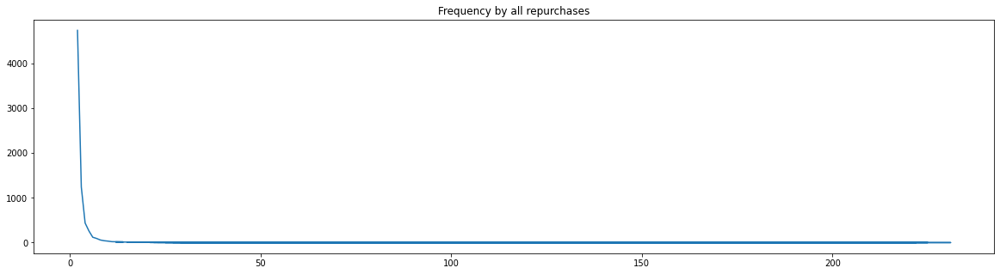

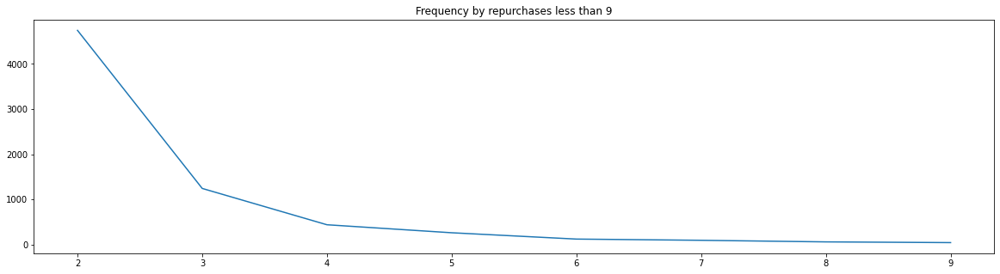

In [ ]:
#@title
print('> Frequency by repurchases')
a = pd.DataFrame(rebuy_true['count'].value_counts())
display(a.T)

print('\n> Most Repurchase:', rebuy_true['count'].max())

import matplotlib.pyplot as plt;
a = a.reset_index()
plt.figure(figsize=(20, 5))
plt.plot('index', 'count', data = a);
plt.title('Frequency by all repurchases')

plt.figure(figsize=(20, 5))
plt.plot('index', 'count', data = a[a.index <= 7]);
plt.title('Frequency by repurchases less than 9');

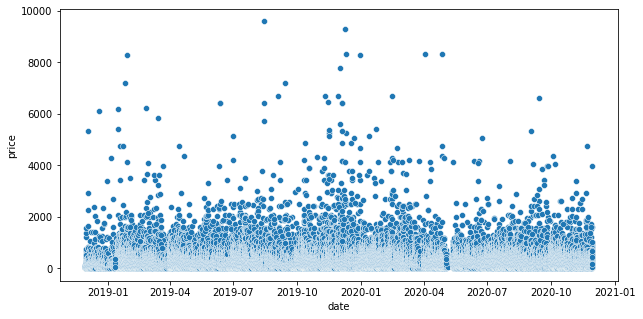

In [ ]:
#@title
sns.scatterplot('date', 'price', data = df);

In [ ]:
#@title
time = pd.DataFrame(df.groupby('date').price.agg(['count','sum','mean']));
display(time.T)

date,2018-11-29,2018-11-30,2018-12-01,2018-12-02,2018-12-03,2018-12-04,2018-12-05,2018-12-06,2018-12-07,2018-12-08,2018-12-09,2018-12-10,2018-12-11,2018-12-12,2018-12-13,2018-12-14,2018-12-15,2018-12-16,2018-12-17,2018-12-18,2018-12-19,2018-12-20,2018-12-21,2018-12-22,2018-12-23,2018-12-24,2018-12-25,2018-12-26,2018-12-27,2018-12-28,2018-12-29,2018-12-30,2018-12-31,2019-01-01,2019-01-02,2019-01-03,2019-01-04,2019-01-05,2019-01-06,2019-01-07,...,2020-10-21,2020-10-22,2020-10-23,2020-10-24,2020-10-25,2020-10-26,2020-10-27,2020-10-28,2020-10-29,2020-10-30,2020-10-31,2020-11-01,2020-11-02,2020-11-03,2020-11-04,2020-11-05,2020-11-06,2020-11-07,2020-11-08,2020-11-09,2020-11-10,2020-11-11,2020-11-12,2020-11-13,2020-11-14,2020-11-15,2020-11-16,2020-11-17,2020-11-18,2020-11-19,2020-11-20,2020-11-21,2020-11-22,2020-11-23,2020-11-24,2020-11-25,2020-11-26,2020-11-27,2020-11-28,2020-11-29
count,6.000000,41.000000,42.000000,23.000000,33.000000,30.000000,41.000000,20.0000,27.000000,22.000000,27.000000,20.0000,29.000000,46.000000,28.000000,38.000000,24.000000,19.000000,25.0000,41.000000,21.000000,26.000000,18.000000,33.000000,25.0000,21.000000,28.000000,23.000000,22.000,22.000000,16.0000,15.000,18.000000,2.00,3.000000,6.000,6.000000,10.000,11.000000,9.000000,...,138.000000,155.000000,137.00000,136.000000,79.000000,87.000000,95.000000,99.000000,116.000,148.000000,107.000000,106.000000,115.000000,119.000000,77.000000,162.000000,135.000000,100.000,150.000000,90.000000,125.00000,137.000000,104.00000,146.000000,157.000000,115.000000,119.000000,104.000000,117.00000,107.000000,127.000000,144.000000,106.000000,104.000000,126.000000,101.000000,150.00,203.000000,166.000000,97.000000
sum,483.520000,10255.270000,4429.570000,3162.340000,16437.520000,7027.330000,3738.960000,3859.9900,4522.820000,7213.560000,4740.300000,3692.6100,6343.550000,12572.600000,6220.300000,9596.440000,7398.550000,4001.690000,6384.8900,6828.890000,11010.920000,4597.230000,5245.080000,5029.470000,6327.2400,5904.670000,7764.780000,4229.790000,7562.830,4838.730000,3602.2000,3815.160,8646.830000,632.98,401.360000,3874.950,1107.520000,2604.080,6621.930000,3397.020000,...,33410.830000,48598.790000,38907.50000,39200.900000,21456.940000,22948.760000,31351.600000,31798.750000,30948.220,42525.710000,38971.100000,31318.280000,34499.070000,30590.820000,23620.750000,47918.960000,44663.750000,29151.800,45074.110000,26077.740000,36468.76000,41332.210000,21470.93000,33239.870000,44194.340000,33256.710000,31949.010000,28247.110000,28057.66000,25188.300000,39253.110000,37360.360000,29987.160000,27321.340000,32364.610000,23252.670000,36588.00,56171.850000,54355.520000,33485.310000
mean,80.586667,250.128537,105.465952,137.493043,498.106667,234.244333,91.194146,192.9995,167.511852,327.889091,175.566667,184.6305,218.743103,273.317391,222.153571,252.537895,308.272917,210.615263,255.3956,166.558293,524.329524,176.816538,291.393333,152.408182,253.0896,281.174762,277.313571,183.903913,343.765,219.942273,225.1375,254.344,480.379444,316.49,133.786667,645.825,184.586667,260.408,601.993636,377.446667,...,242.107464,313.540581,283.99635,288.241912,271.606835,263.778851,330.016842,321.199495,266.795,287.335878,364.215888,295.455472,299.991913,257.065714,306.762987,295.796049,330.842593,291.518,300.494067,289.752667,291.75008,301.694964,206.45125,227.670342,281.492611,289.188783,268.479076,271.606827,239.80906,235.404673,309.079606,259.446944,282.897736,262.705192,256.861984,230.224455,243.92,276.708621,327.442892,345.209381


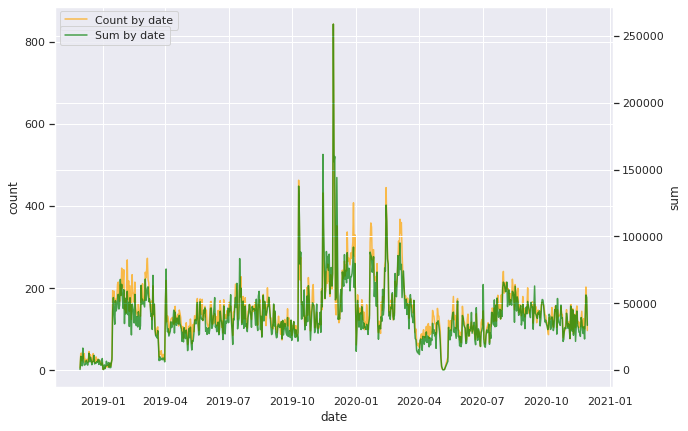

In [ ]:
#@title
time = pd.DataFrame(df.groupby('date').price.agg(['count','sum']));

sns.set(rc={'figure.figsize':(10,7)});
fig, ax = plt.subplots()


sns.lineplot(time.index, time['count'], label = 'Count by date', ax=ax, color = 'orange', alpha = 0.7);
ax2 = plt.twinx();
sns.lineplot(time.index, time['sum'], ax = ax2, label = 'Sum by date', color = 'green', alpha = 0.7);
ax.legend(loc=(0.01,0.94));
ax2.legend(loc=(0.01,0.90));

(0.0, 125000.0)

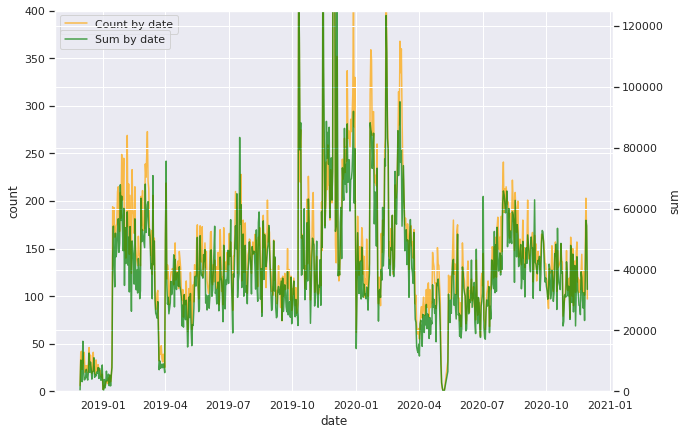

In [ ]:
#@title
time = pd.DataFrame(df.groupby('date').price.agg(['count','sum']));

sns.set(rc={'figure.figsize':(10,7)});
fig, ax = plt.subplots()


sns.lineplot(time.index, time['count'], label = 'Count by date', ax=ax, color = 'orange', alpha = 0.7);
ax2 = plt.twinx();
sns.lineplot(time.index, time['sum'], ax = ax2, label = 'Sum by date', color = 'green', alpha = 0.7);
ax.legend(loc=(0.01,0.94));
ax2.legend(loc=(0.01,0.90));
ax.set_ylim(0,400)
ax2.set_ylim(0,125000)

###✔︎ 세일별 분석

In [ ]:
a = pd.DataFrame(df.groupby(['product_id','price']).quantity_per_month.count()).reset_index()
a

,product_id,price,quantity_per_month
0,1313550904313512734,322,1
1,1313551195582759731,204,2
2,1313551636999701338,44,3
3,1313551664447226717,428,20
4,1313551677961274206,150,1
...,...,...,...
9476,2415519414561538715,218,1
9477,2430001796257677984,261,1
9478,2436554985878585992,537,1
9479,2440041221880545732,170,1


In [ ]:
a.product_id.nunique()

9481

# **모델 학습**

### ✔︎ Daysales, Month_year 등등


In [ ]:
df.date = pd.to_datetime(df.date)
daysales= df.groupby(['date','product_id'])['quantity'].sum().reset_index().rename(columns = { 'quantity' :  'quantity_per_day'})
daysales

,date,product_id,quantity_per_day
0,2018-11-29,1806829194936582544,1
1,2018-11-29,1835566854668550661,1
2,2018-11-29,1836015460420681761,1
3,2018-11-29,1836250225916772582,1
4,2018-11-29,1836568752905257618,1
...,...,...,...
89416,2020-11-29,1956663848387739697,1
89417,2020-11-29,1956663848387739704,1
89418,2020-11-29,1956663848387739706,1
89419,2020-11-29,2230973537609318893,1


In [ ]:
df['month_year'] = df.date.dt.to_period('M').astype(str)
df['month_year'] = pd.to_datetime(df['month_year'])
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103026,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01
103027,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2279188208812032095,1.8068292018655726e+18,jewelry.bracelet,nan,1,376,f,red,gold,diamond,2020-05-01
103028,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1515966223353731514,1.8068292018655726e+18,jewelry.bracelet,0,1,207,f,red,gold,fianit,2020-05-01
103029,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1515966223150615411,1.8068292018655726e+18,jewelry.bracelet,0,1,407,f,red,gold,diamond,2020-05-01


In [ ]:
monthsales= df.groupby(['month_year','product_id'])['quantity'].sum().reset_index().rename(columns = { 'quantity' :  'quantity_per_month'})
monthsales

,month_year,product_id,quantity_per_month
0,2018-11-01,1313677630628692275,1
1,2018-11-01,1313677630662246778,1
2,2018-11-01,1313677631148786681,1
3,2018-11-01,1316034274201174417,1
4,2018-11-01,1806829188452188624,1
...,...,...,...
46906,2020-11-01,2415519414561538715,1
46907,2020-11-01,2430001796257677984,1
46908,2020-11-01,2436554985878585992,1
46909,2020-11-01,2440041221880545732,1


In [ ]:
daysales= df.groupby(['date','product_id'])['quantity'].sum().reset_index().rename(columns = { 'quantity' :  'quantity_per_day'})
daysales

,date,product_id,quantity_per_day
0,2018-11-29,1806829194936582544,1
1,2018-11-29,1835566854668550661,1
2,2018-11-29,1836015460420681761,1
3,2018-11-29,1836250225916772582,1
4,2018-11-29,1836568752905257618,1
...,...,...,...
89416,2020-11-29,1956663848387739697,1
89417,2020-11-29,1956663848387739704,1
89418,2020-11-29,1956663848387739706,1
89419,2020-11-29,2230973537609318893,1


In [ ]:
df = pd.merge(df, daysales, on = ['date','product_id'])
df = pd.merge(df, monthsales, on = ['month_year','product_id'])
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01,1,1
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01,1,1
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01,1,1
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01,1,1
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0,1,351,f,red,gold,NaN,2020-05-01,1,1
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0,1,407,f,red,gold,fianit,2020-05-01,1,1
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01,1,1
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2279188208812032095,1.8068292018655726e+18,jewelry.bracelet,nan,1,376,f,red,gold,diamond,2020-05-01,1,1


In [ ]:
df['year'] = df.date.dt.year
df['quarter'] = df.date.dt.quarter
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01,1,1,2018,4
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01,1,1,2018,4
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01,1,1,2018,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0,1,351,f,red,gold,NaN,2020-05-01,1,1,2020,2
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0,1,407,f,red,gold,fianit,2020-05-01,1,1,2020,2
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01,1,1,2020,2
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2279188208812032095,1.8068292018655726e+18,jewelry.bracelet,nan,1,376,f,red,gold,diamond,2020-05-01,1,1,2020,2


In [ ]:
df['year_quarter'] = df.year.astype(str) + '-' + df.quarter.astype(str)
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0,1,351,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0,1,407,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2279188208812032095,1.8068292018655726e+18,jewelry.bracelet,nan,1,376,f,red,gold,diamond,2020-05-01,1,1,2020,2,2020-2


In [ ]:
quarter = pd.DataFrame(df.groupby(['year_quarter','product_id'])[['quantity','price']].sum()).reset_index().rename(columns = {'quantity' : 'quantity_per_quarter',
                                                                                                                    'price' : 'sales_per_quarter'})
                                                                                            

In [ ]:
df = pd.merge(df, quarter, on =[ 'year_quarter', 'product_id' ])
df

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1.5159156252331968e+18,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0,1,68,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,68
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,1.5159156252330294e+18,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0,1,33,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,33
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,1.5159156252332285e+18,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1,1,75,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,1.5159156251573225e+18,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1,1,74,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,74
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,1.5159156252332892e+18,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0,1,131,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:03:40,05,Sunday,morning,2300738475193794654,1.5159156254536732e+18,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1,1,439,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,439
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0,1,351,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0,1,407,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,407
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5,1,427,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,427


### ✔︎ Train, Val

In [ ]:
first_half = [1,2]
last_half = [3,4]

year_2018_2 = df[(df.quarter.isin(last_half) )& (df.year == 2018)]
year_2019_1 = df[(df.quarter.isin(first_half) )& (df.year == 2019)]
year_2019_2 = df[(df.quarter.isin(last_half) )& (df.year == 2019)]
year_2020_1 = df[(df.quarter.isin(first_half) )& (df.year == 2020)]
year_2020_2 = df[(df.quarter.isin(last_half) )& (df.year == 2020)]

In [ ]:
year_2018_2['next_quarter'] = year_2018_2['product_id'].isin(year_2019_1.product_id.unique())
year_2019_1['next_quarter'] = year_2019_1['product_id'].isin(year_2019_2.product_id.unique())
year_2019_2['next_quarter'] = year_2019_2['product_id'].isin(year_2020_1.product_id.unique())
year_2020_1['next_quarter'] = year_2020_1['product_id'].isin(year_2020_2.product_id.unique())

In [ ]:
train = pd.concat([year_2018_2,year_2019_1,year_2019_2,year_2020_1], axis = 0)
predict = year_2020_2.copy()
train.shape, predict.shape

((81544, 26), (21467, 25))

In [ ]:
train

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter,next_quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0.0,1,67.78,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,67.78,False
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,2,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0.0,1,32.63,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,32.63,False
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,3,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1.0,1,75.21,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75.21,False
3,2018-11-29,23:27:58,11,Thursday,evening,1923625730730623830,4,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1.0,1,73.93,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,73.93,False
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,5,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0.0,1,131.37,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131.37,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,07:03:40,05,Sunday,morning,2300738475193794654,42668,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1.0,1,438.67,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,438.67,True
103007,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0.0,1,351.33,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351.33,False
103008,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0.0,1,406.71,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,406.71,True
103009,2020-05-03,07:36:50,05,Sunday,morning,2300755162030932428,34017,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5.0,1,426.62,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,426.62,False


In [ ]:
save = df.copy()

In [ ]:
save_train = train.copy()

In [ ]:
## regression할 때

In [ ]:
train = pd.concat([year_2018_2,year_2019_1,year_2019_2,year_2020_1], axis = 0)
val = year_2020_2.copy()
train.shape, val.shape

((81544, 26), (21467, 25))

In [ ]:
df.sort_values(['date','time'])

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter
0,2018-11-29,16:30:45,11,Thursday,afternoon,1923415742179443254,1,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0.0,1,67.78,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,67.78
1,2018-11-29,16:52:07,11,Thursday,afternoon,1923426489303302817,2,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0.0,1,32.63,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,32.63
2,2018-11-29,17:58:37,11,Thursday,afternoon,1923459963229831173,3,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1.0,1,75.21,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75.21
4,2018-11-29,20:25:52,11,Thursday,evening,1923534078074684181,5,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0.0,1,131.37,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131.37
5,2018-11-29,20:30:01,11,Thursday,evening,1923536169069445939,6,1836568752905257618,1.8068292018655726e+18,jewelry.bracelet,0.0,1,102.60,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,102.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102996,2020-11-29,14:21:39,11,Sunday,afternoon,2453161822262395043,42063,1515966223509090291,1.8068292018907384e+18,jewelry.earring,5.0,1,417.03,f,red,gold,NaN,2020-11-01,1,1,2020,4,2020-4,1,417.03
97535,2020-11-29,14:23:55,11,Sunday,afternoon,2453162965403173054,40569,1956663847666319760,1.8068292018823498e+18,jewelry.ring,1.0,1,152.42,NaN,white,gold,NaN,2020-11-01,1,24,2020,4,2020-4,67,10212.14
102988,2020-11-29,14:32:30,11,Sunday,afternoon,2453167283086819594,42663,1927585748282770109,1.8068292019159043e+18,jewelry.pendant,0.0,1,93.47,f,red,gold,topaz,2020-11-01,1,1,2020,4,2020-4,1,93.47
98877,2020-11-29,14:36:52,11,Sunday,afternoon,2453169475306914089,41161,1956663846458360689,1.8068292018823498e+18,jewelry.ring,0.0,1,239.59,f,red,gold,diamond,2020-11-01,2,2,2020,4,2020-4,3,718.77


###✔︎ XG Boost 분류

####✔︎ 학습 이전 데이터 처리 - nan

In [ ]:
train

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter,hour,next_quarter
0,2018-11-29,1900-01-01 16:30:45,11,Thursday,afternoon,1923415742179443254,1,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0.0,1,67.78,NaN,red,gold,diamond,2018-11-01,1,1,2018,4,2018-4,1,67.78,16,False
1,2018-11-29,1900-01-01 16:52:07,11,Thursday,afternoon,1923426489303302817,2,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0.0,1,32.63,NaN,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,32.63,16,False
2,2018-11-29,1900-01-01 17:58:37,11,Thursday,afternoon,1923459963229831173,3,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1.0,1,75.21,NaN,red,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,75.21,17,False
3,2018-11-29,1900-01-01 23:27:58,11,Thursday,evening,1923625730730623830,4,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1.0,1,73.93,NaN,white,gold,amethyst,2018-11-01,1,1,2018,4,2018-4,1,73.93,23,False
4,2018-11-29,1900-01-01 20:25:52,11,Thursday,evening,1923534078074684181,5,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0.0,1,131.37,f,red,gold,NaN,2018-11-01,1,1,2018,4,2018-4,1,131.37,20,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,2020-05-03,1900-01-01 07:03:40,05,Sunday,morning,2300738475193794654,42668,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1.0,1,438.67,NaN,white,gold,diamond,2020-05-01,1,1,2020,2,2020-2,1,438.67,7,True
103007,2020-05-03,1900-01-01 07:36:50,05,Sunday,morning,2300755162030932428,34017,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0.0,1,351.33,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,351.33,7,False
103008,2020-05-03,1900-01-01 07:36:50,05,Sunday,morning,2300755162030932428,34017,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0.0,1,406.71,f,red,gold,fianit,2020-05-01,1,1,2020,2,2020-2,1,406.71,7,True
103009,2020-05-03,1900-01-01 07:36:50,05,Sunday,morning,2300755162030932428,34017,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5.0,1,426.62,f,red,gold,NaN,2020-05-01,1,1,2020,2,2020-2,1,426.62,7,False


In [ ]:
train.isna().sum()

date                        0
time                        0
month                       0
day                         0
ampm                        0
order_id                    0
user_id                     0
product_id                  0
category_id                 0
category_code               0
brand                     936
quantity                    0
price                       0
gender                  35135
color                    2113
metal                      13
gem                     20835
month_year                  0
quantity_per_day            0
quantity_per_month          0
year                        0
quarter                     0
year_quarter                0
quantity_per_quarter        0
sales_per_quarter           0
hour                        0
next_quarter                0
dtype: int64

In [ ]:
def fillnan(df):
  df.brand = df.brand.fillna(7)
  df.gender = df.gender.fillna('unknown')
  df.color = df.color.fillna('unknown-color')
  df.metal = df.metal.fillna('unknown')
  df.gem = df.gem.fillna('unknown')

  return df

#fillnan(predict)
fillnan(train)
fillnan(val)

,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,month_year,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter
81533,2020-07-01,00:17:58,07,Wednesday,night,2343296046773305609,34607,1515966223467164785,1.8068292019159043e+18,jewelry.pendant,0.0,1,53.04,f,red,gold,fianit,2020-07-01,1,2,2020,3,2020-3,2,106.08
81534,2020-07-29,07:37:27,07,Wednesday,morning,2363810966384148747,34608,1515966223467164785,1.8068292019159043e+18,jewelry.pendant,0.0,1,53.04,f,red,gold,fianit,2020-07-01,1,2,2020,3,2020-3,2,106.08
81535,2020-07-01,05:06:34,07,Wednesday,morning,2343441300746928608,34609,1956663847750205966,1.8068292019159043e+18,jewelry.pendant,5.0,1,56.48,f,red,gold,garnet,2020-07-01,1,3,2020,3,2020-3,18,1016.64
81536,2020-07-21,12:48:28,07,Tuesday,afternoon,2358169297378869421,30242,1956663847750205966,1.8068292019159043e+18,jewelry.pendant,5.0,1,56.48,f,red,gold,garnet,2020-07-01,1,3,2020,3,2020-3,18,1016.64
81537,2020-07-27,16:29:44,07,Monday,afternoon,2362629316660953537,2971,1956663847750205966,1.8068292019159043e+18,jewelry.pendant,5.0,1,56.48,f,red,gold,garnet,2020-07-01,1,3,2020,3,2020-3,18,1016.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102995,2020-11-29,11:41:46,11,Sunday,morning,2453081350689784357,18835,1956663846374474513,1.8068292018907384e+18,jewelry.earring,1.0,1,670.86,unknown,red,gold,diamond,2020-11-01,1,1,2020,4,2020-4,1,670.86
102996,2020-11-29,14:21:39,11,Sunday,afternoon,2453161822262395043,42063,1515966223509090291,1.8068292018907384e+18,jewelry.earring,5.0,1,417.03,f,red,gold,unknown,2020-11-01,1,1,2020,4,2020-4,1,417.03
102997,2020-11-29,11:47:49,11,Sunday,morning,2453084397507707489,42666,1515966223545341186,1.8068292018655726e+18,jewelry.bracelet,5.0,1,159.08,f,unknown-color,silver,unknown,2020-11-01,1,1,2020,4,2020-4,1,159.08
102998,2020-11-29,10:09:03,11,Sunday,morning,2453034685341631171,30246,1515966222711500252,1.80682920194107e+18,jewelry.brooch,5.0,1,424.52,f,red,gold,rhodolite,2020-11-01,1,1,2020,4,2020-4,1,424.52


In [ ]:
train.isna().sum()

date                    0
time                    0
month                   0
day                     0
ampm                    0
order_id                0
user_id                 0
product_id              0
category_id             0
category_code           0
brand                   0
quantity                0
price                   0
gender                  0
color                   0
metal                   0
gem                     0
month_year              0
quantity_per_day        0
quantity_per_month      0
year                    0
quarter                 0
year_quarter            0
quantity_per_quarter    0
sales_per_quarter       0
hour                    0
next_quarter            0
dtype: int64

####✔︎ 학습에 적절한 datatype 처리

In [ ]:
train.dtypes

date                    datetime64[ns]
time                    datetime64[ns]
month                           object
day                             object
ampm                            object
order_id                        object
user_id                          int64
product_id                      object
category_id                     object
category_code                   object
brand                          float64
quantity                         int64
price                          float64
gender                          object
color                           object
metal                           object
gem                             object
month_year              datetime64[ns]
quantity_per_day                 int64
quantity_per_month               int64
year                             int64
quarter                          int64
year_quarter                    object
quantity_per_quarter             int64
sales_per_quarter              float64
hour                     

In [ ]:
date = ['date','time', 'month_year'] #datetime value는 모델학습에 반영할 수 없으므로 drop
train.drop(date, axis = 1, inplace=True)
predict.drop(date, axis = 1, inplace=True)

In [ ]:
target = 'next_quarter'

def dataType_classifier(df):
  df[target] = df[target].astype(int) #bool tyoe -> int로 변환
  df[['brand','quarter','year']] = df[['brand','quarter','year']].astype('category') #continuous data로 처리되어있지만, 카테고리인 것은 카테고리로 변경.
  #df[['price','sales_per_quarter']] = df[['price','sales_per_quarter']].astype(int)

dataType_classifier(train)
dataType_classifier(predict)

### ✔︎ 모델 train, val 분리

In [ ]:
val = train[-10000:]
#val = train[train.year_quarter == '2020-2'] #2020년도 2분기 데이터를 
train = train.drop(val.index)#train 80000개 중 약 20% 정도.

fillnan(val)
dataType_classifier(val)

In [ ]:
x_train = train.drop(target, axis = 1)
y_train = train[target]

x_val = val.drop(target, axis = 1)
y_val = val[target]

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((71544, 23), (71544,), (10000, 23), (10000,))

In [ ]:
train[target].value_counts(normalize = True)

1    0.869116
0    0.130884
Name: next_quarter, dtype: float64

✔︎ Baseline Model

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

baseline = [1]*len(val)
print('검증 정확도: ', accuracy_score(y_val, baseline))
print(classification_report(y_val, baseline))

검증 정확도:  0.7798
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2202
           1       0.78      1.00      0.88      7798

    accuracy                           0.78     10000
   macro avg       0.39      0.50      0.44     10000
weighted avg       0.61      0.78      0.68     10000



In [ ]:
from sklearn.metrics import roc_auc_score
auc_score = roc_auc_score(y_val, baseline)
auc_score

0.5

In [ ]:
#모델 생성 & 이후 permutation importance를 통한 특성 확인 및 필요없는 특성 정리.
from category_encoders import OrdinalEncoder
from xgboost import XGBClassifier


from sklearn.pipeline import Pipeline
pipe = Pipeline([
    ('preprocessing', OrdinalEncoder()),
    ('xgb', XGBClassifier(
                          )) 
])

pipe.fit(x_train, y_train)

print('검증 정확도: ', pipe.score(x_val, y_val)) 
y_pred = pipe.predict(x_val)
print(classification_report(y_val, y_pred)) #0에 대한 precision과 recall 스코어가 좀 오름

검증 정확도:  0.7965
              precision    recall  f1-score   support

           0       0.57      0.31      0.40      2202
           1       0.83      0.93      0.88      7798

    accuracy                           0.80     10000
   macro avg       0.70      0.62      0.64     10000
weighted avg       0.77      0.80      0.77     10000



In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import eli5
from eli5.sklearn import PermutationImportance

# permuter 정의
permuter = PermutationImportance(
    pipe.named_steps['xgb'], # model
    scoring='f1', # metric
    n_iter=10, # 다른 random seed를 사용하여 5번 반복
    random_state=2
)

x_val_encoded = pipe.named_steps['preprocessing'].transform(x_val)

permuter.fit(x_val_encoded, y_val);

In [ ]:
pipe.named_steps['preprocessing'].mapping

[{'col': 'month', 'data_type': dtype('O'), 'mapping': 11      1
  12      2
  01      3
  02      4
  03      5
  04      6
  06      7
  05      8
  07      9
  08     10
  09     11
  10     12
  NaN    -2
  dtype: int64},
 {'col': 'day', 'data_type': dtype('O'), 'mapping': Thursday     1
  Friday       2
  Saturday     3
  Wednesday    4
  Tuesday      5
  Sunday       6
  Monday       7
  NaN         -2
  dtype: int64},
 {'col': 'ampm', 'data_type': dtype('O'), 'mapping': afternoon    1
  evening      2
  morning      3
  night        4
  NaN         -2
  dtype: int64},
 {'col': 'order_id',
  'data_type': dtype('O'),
  'mapping': 1923415742179443254        1
  1923426489303302817        2
  1923459963229831173        3
  1923625730730623830        4
  1923534078074684181        5
                         ...  
  2249332748760121624    54152
  2261164982055993823    54153
  2249624644208296345    54154
  2260167326198399483    54155
  NaN                       -2
  Length: 54156, dt

In [ ]:
feature_names = x_val.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values()

gender                 -0.002109
year_quarter           -0.000285
category_code          -0.000168
order_id               -0.000060
quarter                 0.000000
year                    0.000000
metal                   0.000000
quantity                0.000000
hour                    0.000000
ampm                    0.000000
day                     0.000000
user_id                 0.000081
sales_per_quarter       0.000230
month                   0.000287
quantity_per_month      0.001233
gem                     0.001564
quantity_per_day        0.002861
color                   0.003485
product_id              0.004133
category_id             0.004393
price                   0.006101
quantity_per_quarter    0.008060
brand                   0.010495
dtype: float64

In [ ]:
# 특성별 score 확인
eli5.show_weights(
    permuter, 
    top=None, # top n 지정 가능, None 일 경우 모든 특성 보이기 
    feature_names=list(feature_names) # list로 넣음.
)

## 

Weight,Feature
0.0105 ± 0.0017,brand
0.0081 ± 0.0032,quantity_per_quarter
0.0061 ± 0.0011,price
0.0044 ± 0.0016,category_id
0.0041 ± 0.0015,product_id
0.0035 ± 0.0014,color
0.0029 ± 0.0008,quantity_per_day
0.0016 ± 0.0008,gem
0.0012 ± 0.0010,quantity_per_month
0.0003 ± 0.0006,month


In [ ]:
#이를 활용해 특성을 선택
minimum_importance = 0
mask = permuter.feature_importances_ > minimum_importance
features = x_train.columns[mask]
x_train_selected = x_train[features]
x_val_selected = x_val[features]

In [ ]:
pd.DataFrame(
    {'columns': x_train.columns,
    'permuter': permuter.feature_importances_ - permuter.feature_importances_std_ > 0}
).set_index('columns').T

columns,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter,hour
permuter,False,False,False,False,False,True,True,False,True,False,True,False,True,False,True,True,True,False,False,False,True,False,False


In [ ]:
x_train_selected.shape, x_val_selected.shape

((71544, 12), (10000, 12))

In [ ]:
y_train.value_counts(normalize=True)

1    0.869116
0    0.130884
Name: next_quarter, dtype: float64

In [ ]:
ratio = 0.130884/0.869116
ratio

0.15059439706552405

In [ ]:
#모델 생성 & 이후 permutation importance를 통한 특성 확인 및 필요없는 특성 정리.


from sklearn.pipeline import Pipeline
pipe = Pipeline([
    ('preprocessing', OrdinalEncoder()),
    ('xgb', XGBClassifier(
        n_estimators = 400,
        scale_pos_weight = ratio,
        max_depth = 9,
        early_stoppings = 50,
        objective = 'binary:logistic',
        eval_metric = 'logloss',
        subsample = 0.9,
        colsample_bytree = 0.3,
        reg_lambda = 0.8,
        gamma = 4
                          )) 
])

pipe.fit(x_train_selected, y_train)

print('검증 정확도: ', pipe.score(x_val_selected, y_val)) 
y_pred = pipe.predict(x_val_selected)
print(classification_report(y_val, y_pred))

검증 정확도:  0.7324
              precision    recall  f1-score   support

           0       0.44      0.85      0.58      2202
           1       0.94      0.70      0.80      7798

    accuracy                           0.73     10000
   macro avg       0.69      0.77      0.69     10000
weighted avg       0.83      0.73      0.75     10000



In [ ]:
#확인해본 threshold 조정
from sklearn.metrics import roc_curve

# roc_curve(타겟값, prob of 1)
y_proba = pipe.predict_proba(x_val_selected)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_proba)

import numpy as np


optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

print('Best Threshold=%f' % (optimal_threshold))

from sklearn.metrics import classification_report 
y_pred_optimal = (y_proba >= 0.43)
print(classification_report(y_val, y_pred_optimal))

Best Threshold=0.400665
              precision    recall  f1-score   support

           0       0.47      0.80      0.60      2202
           1       0.93      0.75      0.83      7798

    accuracy                           0.76     10000
   macro avg       0.70      0.78      0.71     10000
weighted avg       0.83      0.76      0.78     10000



In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score

print('f1:',f1_score(y_val, y_pred_optimal))
auc_score = roc_auc_score(y_val, y_pred_optimal)
print('auc:',auc_score)

f1: 0.8302556818181818
auc: 0.7755476089143702


### 2) PDP
- 한 특성에 대한 PDP를 만들고 모델을 설명하세요
- 두 특성간 관계에 대한 PDP를 만들고 모델을 설명하세요


In [ ]:
#이미지 화질 조정

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 144

In [ ]:
ecd = OrdinalEncoder()
x_train_encoded = ecd.fit_transform(x_train_selected)
x_val_encoded = ecd.transform(x_val_selected)

In [ ]:
ecd.mapping

[{'col': 'month', 'data_type': dtype('O'), 'mapping': 11      1
  12      2
  01      3
  02      4
  03      5
  04      6
  06      7
  05      8
  07      9
  08     10
  09     11
  10     12
  NaN    -2
  dtype: int64},
 {'col': 'product_id',
  'data_type': dtype('O'),
  'mapping': 1836250225916772582       1
  1836015460420681761       2
  1806829194936582544       3
  1836918640855745365       4
  1835566854668550661       5
                         ... 
  1840297097614590808    7377
  1515966223464020947    7378
  2190718933625995848    7379
  1313994886097141903    7380
  NaN                      -2
  Length: 7381, dtype: int64},
 {'col': 'category_id',
  'data_type': dtype('O'),
  'mapping': 1.8068292019159043e+18     1
  1.8068292018823498e+18     2
  1.8068292018907384e+18     3
  1.8068292018655726e+18     4
  1.8068292019746245e+18     5
  1.80682920194107e+18       6
  1.8068292019242929e+18     7
  1.806829202092065e+18      8
  1.313677631878595e+18      9
  1.31367763

In [ ]:
x_val_encoded

,order_id,product_id,category_id,brand,price,gem,quantity_per_day,quantity_per_month
71537,54172,1290,2,0,1321,1,1,3
71538,54173,6541,2,0,198,1,1,1
71539,54174,2344,2,1,503,9,1,1
71540,54174,3939,2,1,340,1,1,2
71541,54175,3939,2,1,340,1,1,2
...,...,...,...,...,...,...,...,...
103006,59127,3304,3,0,351,2,1,1
103007,59127,2166,3,0,406,5,1,1
103008,59127,8483,3,5,426,2,1,1
103009,59127,8484,4,7,376,1,1,1


In [ ]:
x_val_encoded = x_val_encoded.astype(int)
x_val_encoded.dtypes

order_id              int64
product_id            int64
category_id           int64
brand                 int64
price                 int64
gem                   int64
quantity_per_day      int64
quantity_per_month    int64
dtype: object

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


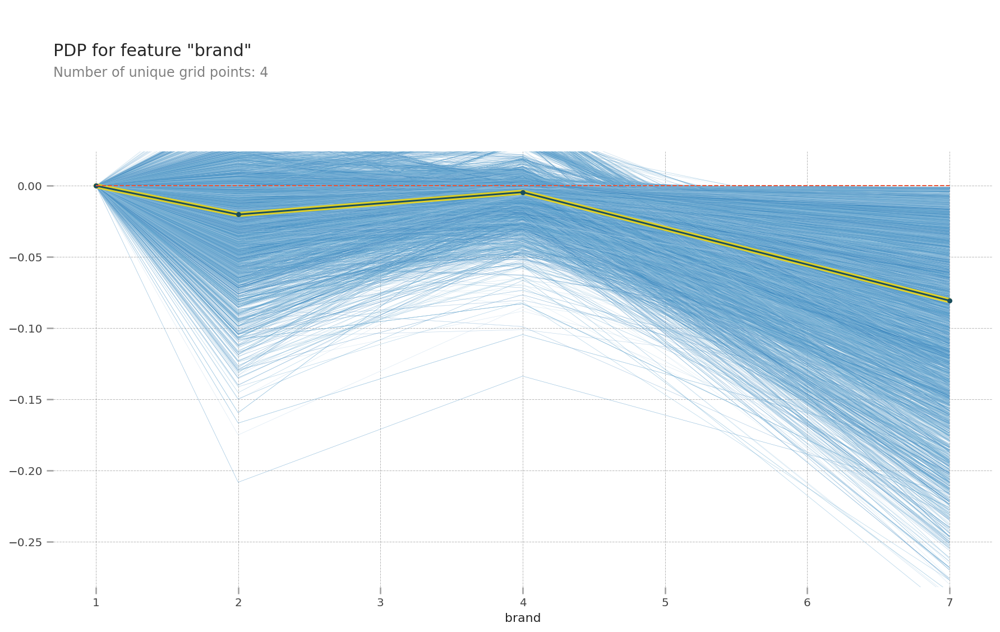

In [ ]:
# 이번엔 catboost 모델을 확인
import pdpbox
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'brand'

isolated = pdp_isolate(
    model=pipe, 
    dataset=x_val_encoded, 
    model_features=x_val_encoded.columns,  
    feature=feature
)

pdp_plot(isolated, 
         feature_name = feature, 
         plot_lines=True, 
         ); 
         
# 모델은 브랜드 5,6,7일수록 구매 가능성이 낮아짐.

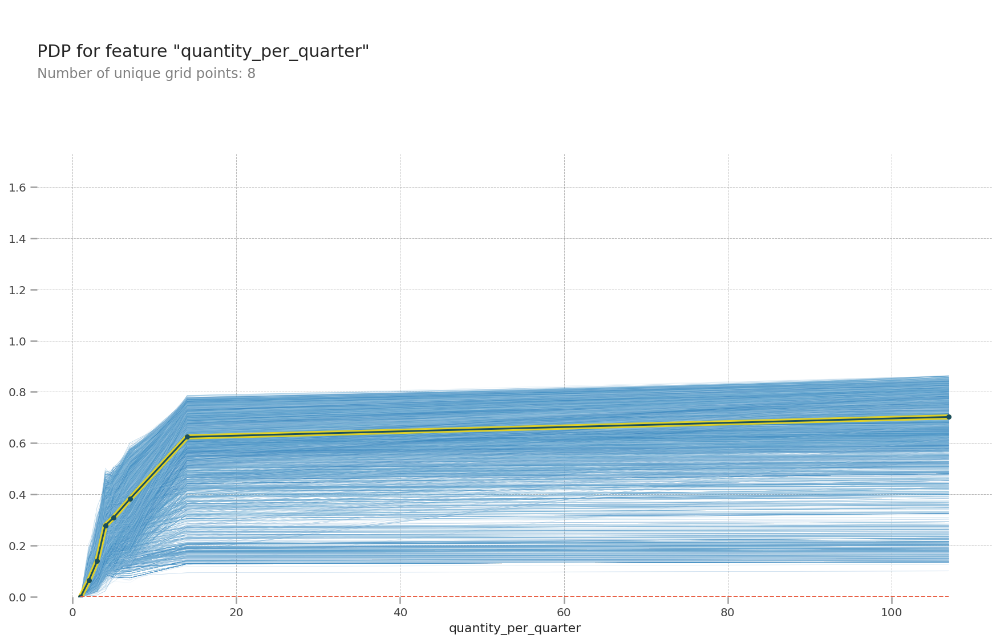

In [ ]:
# 이번엔 catboost 모델을 확인
import pdpbox
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'quantity_per_quarter'

isolated = pdp_isolate(
    model=pipe, 
    dataset=x_val_encoded, 
    model_features=x_val_encoded.columns,  
    feature=feature
)

pdp_plot(isolated, 
         feature_name = feature, 
         plot_lines=True, 
         ); 
         
# 모델은 브랜드 5,6,7일수록 구매 가능성이 낮아짐.

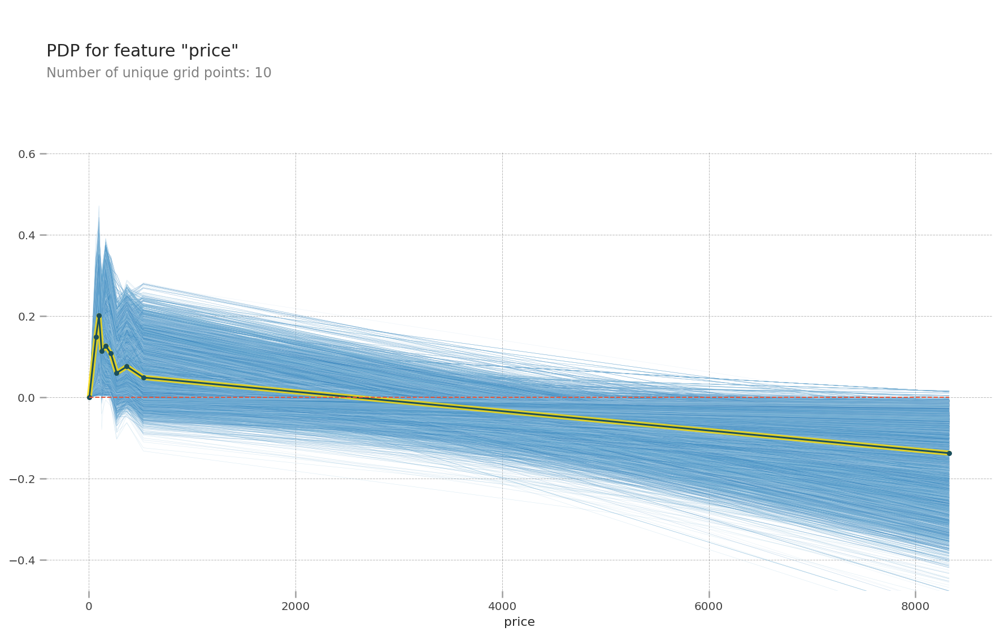

In [ ]:
x_val_encoded# 이번엔 catboost 모델을 확인
import pdpbox
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'price'

isolated = pdp_isolate(
    model=pipe, 
    dataset=x_val_encoded, 
    model_features=x_val_encoded.columns,  
    feature=feature
)

pdp_plot(isolated, 
         feature_name = feature, 
         plot_lines=True, 
         ); 
         
# 모델은 브랜드 5,6,7일수록 구매 가능성이 낮아짐.

In [ ]:
## 두 특성 간 관계 분석 (xgb)

from pdpbox.pdp import pdp_interact, pdp_interact_plot

features = ['quantity_per_quarter', 'price']

interaction = pdp_interact(
    model= pipe, 
    dataset=x_val_encoded,
    model_features=x_val_encoded.columns, 
    features=features
)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


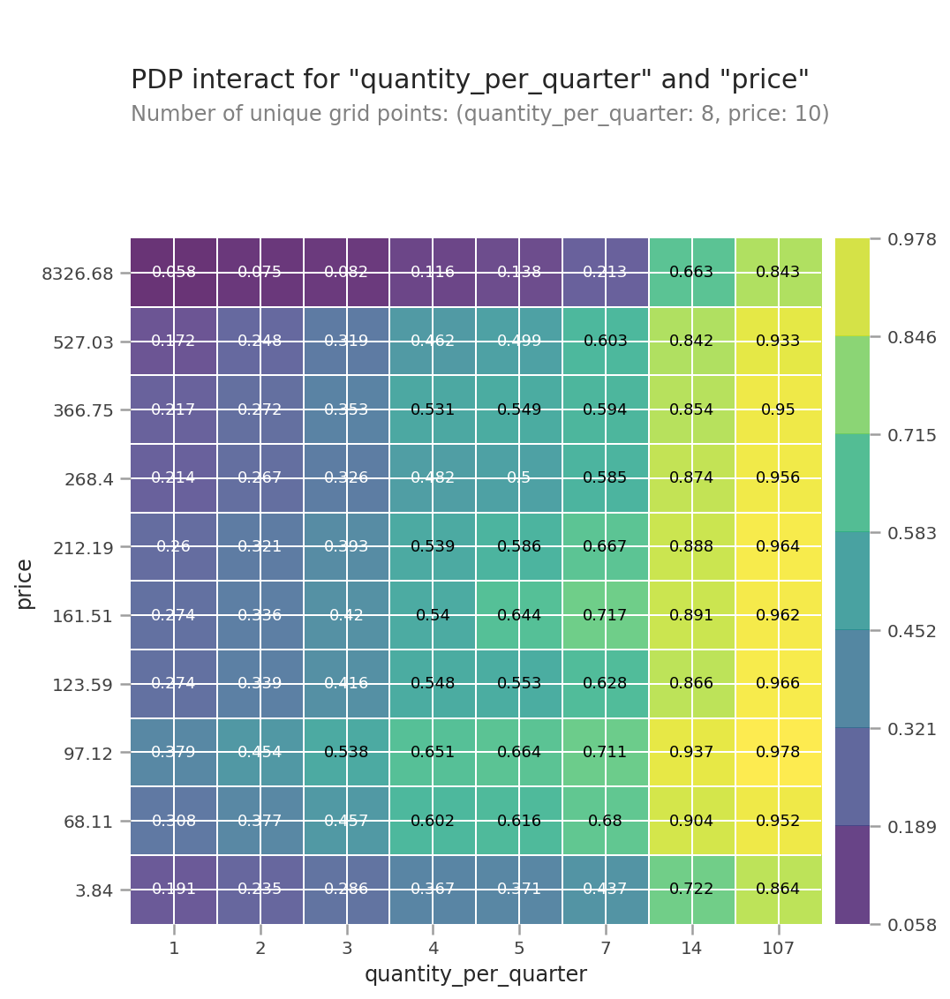

In [ ]:
from pdpbox import pdp
features = ['quantity_per_quarter', 'price']

interaction = pdp.pdp_interact(
    model= pipe, 
    dataset=x_val_encoded,
    model_features=x_val_encoded.columns, 
    features=features
)

#pdp_interact_plot(interaction, plot_type='grid', 
     #             feature_names=features);

pdp.pdp_interact_plot(interaction, plot_type='grid', feature_names=features);

# gem은 거의 영향을 미치지 않는 것처럼 보임!! Brand가 중요한 것처럼 보임. 7번 브랜드는 다 가격이 비싼 것처럼 나왔는데, 확인이 필요.

### 3) SHAP

In [ ]:
pipe

Pipeline(steps=[('preprocessing',
                 OrdinalEncoder(cols=['month', 'product_id', 'category_id',
                                      'brand', 'color', 'gem'],
                                mapping=[{'col': 'month',
                                          'data_type': dtype('O'),
                                          'mapping': 11      1
12      2
01      3
02      4
03      5
04      6
06      7
05      8
07      9
08     10
09     11
10     12
NaN    -2
dtype: int64},
                                         {'col': 'product_id',
                                          'data_type': dtype('O'),
                                          'mapping': 1836250225916772582       1
1836015460420681761       2
1806829194936582544       3
18369186408...
corundum               20
corundum_synthetic     21
sitall                 22
emerald_geothermal     23
rhodolite              24
chrysoprase            25
coral                  26
sapphire_geothermal    27
onyx         

In [ ]:
x_val_encoded = pipe['preprocessing'].transform(x_val_selected)

In [ ]:
a = x_val_encoded.iloc[[0]] #중첩 브라켓 사용하면 결과물이 데이터프레임!!
a

,month,user_id,product_id,category_id,brand,price,color,gem,quantity_per_day,quantity_per_month,quantity_per_quarter,sales_per_quarter
71538,4,17975,4509.0,2,4,282.15,1,1.0,1,1,1,282.15


In [ ]:
print(f'실제값: {y_val.iloc[[0]]}') #실제값 660
print(f'예측값: {pipe.predict(a)}') #예측값 168 ??? 

실제값: 71538    0
Name: next_quarter, dtype: int64
예측값: [0]


In [ ]:
pipe.predict_proba(x_val_selected)[0:17]

array([[0.7845088 , 0.21549116],
       [0.45421106, 0.54578894],
       [0.43668205, 0.56331795],
       [0.49026114, 0.50973886],
       [0.49364018, 0.5063598 ],
       [0.09822059, 0.9017794 ],
       [0.0958063 , 0.9041937 ],
       [0.09324169, 0.9067583 ],
       [0.14136088, 0.8586391 ],
       [0.07654989, 0.9234501 ],
       [0.7865713 , 0.21342869],
       [0.7488744 , 0.25112554],
       [0.7184607 , 0.28153932],
       [0.5586345 , 0.4413655 ],
       [0.42853767, 0.57146233],
       [0.42853767, 0.57146233],
       [0.42853767, 0.57146233]], dtype=float32)

In [ ]:
pipe.predict_proba(x_val_encoded)

array([[0.87346643, 0.12653358],
       [0.789135  , 0.21086505],
       [0.789135  , 0.21086505],
       ...,
       [0.88895726, 0.11104272],
       [0.8608949 , 0.13910511],
       [0.88531274, 0.11468726]], dtype=float32)

In [ ]:
import shap

explainer = shap.TreeExplainer(pipe['xgb'])
b = ecd.transform(a)
shap_values = explainer.shap_values(b)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=b
)

In [ ]:
x_val_encoded = pipe['preprocessing'].transform(x_val_selected)
a = x_val_encoded.iloc[[8]]
b = x_val_selected.iloc[[8]]#중첩 브라켓 사용하면 결과물이 데이터프레임!!
print(f'실제값: {y_val.iloc[[8]]}') #실제값 660
print(f'예측값: {pipe.predict(b)}') #예측값 168 ??? 

import shap

explainer = shap.TreeExplainer(pipe['xgb'])
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=b
)

실제값: 71546    1
Name: next_quarter, dtype: int64
예측값: [1]


In [ ]:
x_val_encoded = pipe['preprocessing'].transform(x_val_selected)
a = x_val_encoded.iloc[[8000]]
b = x_val_selected.iloc[[8000]]#중첩 브라켓 사용하면 결과물이 데이터프레임!!
print(f'실제값: {y_val.iloc[[8000]]}') #실제값 660
print(f'예측값: {pipe.predict(b)}') #예측값 168 ??? 

import shap

explainer = shap.TreeExplainer(pipe['xgb'])
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=b
)

실제값: 79538    1
Name: next_quarter, dtype: int64
예측값: [1]


In [ ]:
x_val_encoded = pipe['preprocessing'].transform(x_val_selected)
a = x_val_encoded.iloc[[700]]
b = x_val_selected.iloc[[700]]#중첩 브라켓 사용하면 결과물이 데이터프레임!!
print(f'실제값: {y_val.iloc[[700]]}') #실제값 660
print(f'예측값: {pipe.predict(b)}') #예측값 168 ??? 

import shap

explainer = shap.TreeExplainer(pipe['xgb'])
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=b
)

실제값: 72238    0
Name: next_quarter, dtype: int64
예측값: [0]


In [ ]:
x_val_encoded = pipe['preprocessing'].transform(x_val_selected)
a = x_val_encoded.iloc[[5]]
b = x_val_selected.iloc[[5]]#중첩 브라켓 사용하면 결과물이 데이터프레임!!
print(f'실제값: {y_val.iloc[[5]]}') #실제값 660
print(f'예측값: {pipe.predict(b)}') #예측값 168 ??? 

import shap

explainer = shap.TreeExplainer(pipe['xgb'])
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=b
)

실제값: 71543    1
Name: next_quarter, dtype: int64
예측값: [1]


In [ ]:
x_val_selected[x_val_selected.user_id.isin(trend_leader)]

,month,user_id,product_id,category_id,brand,price,color,gem,quantity_per_day,quantity_per_month,quantity_per_quarter,sales_per_quarter
71543,02,59,1956663831274980347,1.8068292018907384e+18,1.0,340.37,yellow,unknown,1,3,5,1701.85
72228,03,59,1320277167157805999,1.8068292018823498e+18,1.0,398.60,red,diamond,1,1,1,398.60
72436,03,59,1492647267050455581,1.8068292018823498e+18,1.0,384.22,white,diamond,1,1,1,384.22


In [ ]:
x_val_selected.iloc[[5]]

,month,user_id,product_id,category_id,brand,price,color,gem,quantity_per_day,quantity_per_month,quantity_per_quarter,sales_per_quarter
71543,02,59,1956663831274980347,1.8068292018907384e+18,1.0,340.37,yellow,unknown,1,3,5,1701.85


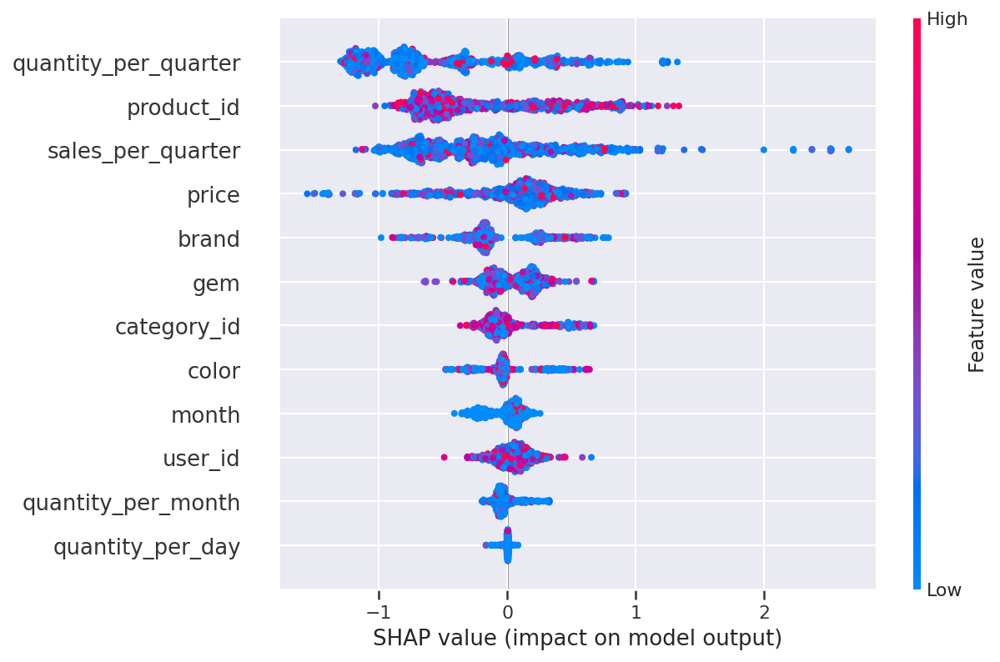

In [ ]:
shap_values = explainer.shap_values(x_val_encoded.iloc[:1000])
shap.summary_plot(shap_values, x_train_encoded.iloc[:1000])

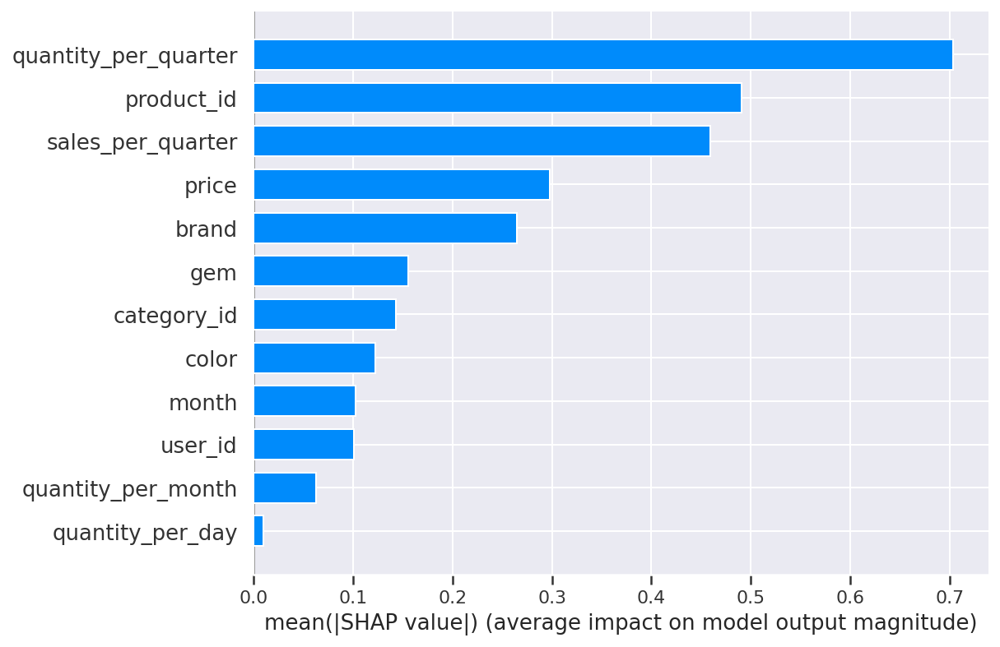

In [ ]:
shap.summary_plot(shap_values, x_train_encoded.iloc[:1000], plot_type="bar")

### ✔︎ CatBoost

In [ ]:
train

,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter,hour,next_quarter
0,11,Thursday,afternoon,1923415742179443254,1,1836250225916772582,1.8068292019159043e+18,jewelry.pendant,0.0,1,67.78,unknown,red,gold,diamond,1,1,2018,4,2018-4,1,67.78,16,0
1,11,Thursday,afternoon,1923426489303302817,2,1836015460420681761,1.8068292019159043e+18,jewelry.pendant,0.0,1,32.63,unknown,red,gold,unknown,1,1,2018,4,2018-4,1,32.63,16,0
2,11,Thursday,afternoon,1923459963229831173,3,1806829194936582544,1.8068292018823498e+18,jewelry.ring,1.0,1,75.21,unknown,red,gold,amethyst,1,1,2018,4,2018-4,1,75.21,17,0
3,11,Thursday,evening,1923625730730623830,4,1836918640855745365,1.8068292018823498e+18,jewelry.ring,1.0,1,73.93,unknown,white,gold,amethyst,1,1,2018,4,2018-4,1,73.93,23,0
4,11,Thursday,evening,1923534078074684181,5,1835566854668550661,1.8068292018907384e+18,jewelry.earring,0.0,1,131.37,f,red,gold,unknown,1,1,2018,4,2018-4,1,131.37,20,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72953,03,Tuesday,afternoon,2276982632082309939,24013,1917387672314183833,1.8068292018823498e+18,jewelry.ring,0.0,1,568.12,f,red,gold,diamond,1,1,2020,1,2020-1,1,568.12,12,0
72954,03,Tuesday,afternoon,2277065139016433839,30197,2236401021351886998,1.8068292018823498e+18,jewelry.ring,7.0,1,406.16,f,white,gold,diamond,1,1,2020,1,2020-1,1,406.16,15,0
72955,03,Tuesday,morning,2276953160083833556,30198,1956663846282199698,1.8068292018907384e+18,jewelry.earring,0.0,1,532.16,f,red,gold,diamond,1,1,2020,1,2020-1,1,532.16,11,0
72956,03,Tuesday,morning,2276960093889102055,30199,1956663847439827016,1.8068292018907384e+18,jewelry.earring,1.0,1,866.07,unknown,red,gold,diamond,1,1,2020,1,2020-1,1,866.07,11,1


In [ ]:
val

,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,quantity_per_day,quantity_per_month,year,quantity_per_quarter,next_quarter
66538,01,Tuesday,evening,2226435175816889126,1.5159156254035003e+18,1897215826520441309,1.8068292018823498e+18,jewelry.ring,0.0,1,482,f,red,gold,diamond,1,1,2020,3,0
66539,03,Thursday,afternoon,2258214071700554513,1.515915625389993e+18,1897215826520441309,1.8068292018823498e+18,jewelry.ring,0.0,1,482,f,red,gold,diamond,1,2,2020,3,0
66540,03,Friday,afternoon,2258867969826226319,1.515915625389993e+18,1897215826520441309,1.8068292018823498e+18,jewelry.ring,0.0,1,482,f,red,gold,diamond,1,2,2020,3,0
66541,01,Tuesday,evening,2226436513581761388,1.515915625279842e+18,1956663845669830776,1.8068292018823498e+18,jewelry.ring,1.0,1,198,unknown,red,gold,diamond,1,1,2020,2,1
66542,02,Saturday,evening,2249636813704528789,1.5159156254195924e+18,1956663845669830776,1.8068292018823498e+18,jewelry.ring,1.0,1,198,unknown,red,gold,diamond,1,1,2020,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103006,05,Sunday,morning,2300738475193794654,1.5159156254536732e+18,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1.0,1,438,unknown,white,gold,diamond,1,1,2020,1,1
103007,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0.0,1,351,f,red,gold,unknown,1,1,2020,1,0
103008,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0.0,1,406,f,red,gold,fianit,1,1,2020,1,1
103009,05,Sunday,morning,2300755162030932428,1.5159156251084856e+18,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5.0,1,426,f,red,gold,unknown,1,1,2020,1,0


In [ ]:
ecd = OrdinalEncoder()
x_train_encoded = ecd.fit_transform(x_train_selected)
x_val_encoded = ecd.transform(x_val_selected)

In [ ]:
save_x_train_encoded = x_train_encoded.copy()
save_x_val_encoded = x_val_encoded.copy()
save_y_val = y_val.copy()

In [ ]:
x_train_encoded = save_x_train_encoded.copy()
x_val_encoded = save_x_val_encoded.copy()
y_val = save_y_val.copy()

In [ ]:
x_train[x_train.year_quarter == '2020-1']#.index

,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,quantity_per_day,quantity_per_month,year,quarter,year_quarter,quantity_per_quarter,sales_per_quarter,hour
56126,01,Wednesday,morning,2211672330558505760,23438,1515966223003317451,1.8068292019159043e+18,jewelry.pendant,0.0,1,57.40,f,red,gold,unknown,2,9,2020,1,2020-1,17,975.80,9
56127,01,Wednesday,morning,2211673865883484976,23438,1515966223003317451,1.8068292019159043e+18,jewelry.pendant,0.0,1,57.40,f,red,gold,unknown,2,9,2020,1,2020-1,17,975.80,9
56128,01,Friday,morning,2213039591227654771,47,1515966223003317451,1.8068292019159043e+18,jewelry.pendant,0.0,1,57.40,f,red,gold,unknown,1,9,2020,1,2020-1,17,975.80,7
56129,01,Monday,morning,2215283064165105732,23439,1515966223003317451,1.8068292019159043e+18,jewelry.pendant,0.0,1,57.40,f,red,gold,unknown,1,9,2020,1,2020-1,17,975.80,9
56130,01,Wednesday,afternoon,2216898435297050788,23440,1515966223003317451,1.8068292019159043e+18,jewelry.pendant,0.0,1,57.40,f,red,gold,unknown,1,9,2020,1,2020-1,17,975.80,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71533,02,Saturday,afternoon,2249515078845989823,25308,1956663848362573845,1.8068292018823498e+18,jewelry.ring,0.0,1,409.90,f,white,gold,diamond,1,1,2020,1,2020-1,1,409.90,14
71534,02,Saturday,afternoon,2249575456380551273,6581,1956663831392420015,1.8068292018823498e+18,jewelry.ring,5.0,1,266.07,f,red,gold,diamond,1,1,2020,1,2020-1,1,266.07,16
71535,02,Saturday,evening,2249624644208296345,29710,1313994886097141903,1.8068292018823498e+18,jewelry.ring,0.0,1,123.15,f,red,gold,fianit,1,1,2020,1,2020-1,3,369.45,18
71536,03,Sunday,morning,2260167326198399483,28095,1313994886097141903,1.8068292018823498e+18,jewelry.ring,0.0,1,123.15,f,red,gold,fianit,1,2,2020,1,2020-1,3,369.45,7


In [ ]:
x_train_encoded.iloc[56133:72964]

,month,user_id,product_id,category_id,brand,price,color,gem,quantity_per_day,quantity_per_month,quantity_per_quarter,sales_per_quarter
56127,3,23438,4937,1,1,57.40,1,2,2,9,17,975.80
56128,3,47,4937,1,1,57.40,1,2,1,9,17,975.80
56129,3,23439,4937,1,1,57.40,1,2,1,9,17,975.80
56130,3,23440,4937,1,1,57.40,1,2,1,9,17,975.80
56131,3,22094,4937,1,1,57.40,1,2,1,9,17,975.80
...,...,...,...,...,...,...,...,...,...,...,...,...
71533,4,25308,3507,2,1,409.90,2,1,1,1,1,409.90
71534,4,6581,1457,2,4,266.07,1,1,1,1,1,266.07
71535,4,29710,7380,2,1,123.15,1,5,1,1,3,369.45
71536,5,28095,7380,2,1,123.15,1,5,1,2,3,369.45


In [ ]:
val_set2_index = x_train[x_train.year_quarter == '2020-1'].index
x_val_set2 = x_train_encoded[56133:72964]
y_val_set2 = y_train[56133:72964]

x_train_encoded = x_train_encoded.drop(x_val_set2.index)
y_train_encoded = y_train.drop(y_val_set2.index)

In [ ]:
x_train_encoded.shape, y_train_encoded.shape, x_val_encoded.shape, y_val.shape, x_val_set2.shape, y_val_set2.shape

((56133, 12), (56133,), (10000, 12), (10000,), (15411, 12), (15411,))

In [ ]:
from catboost import CatBoostClassifier

cfi = np.where(x_train_selected.dtypes == np.object)[0]

catBoost = CatBoostClassifier(n_estimators = 200,
                              eval_metric = 'F1'
                              )

catBoost.fit(x_train_encoded, y_train_encoded, use_best_model=True, cat_features = cfi, eval_set=(x_val_set2, y_val_set2))

Learning rate set to 0.172591
0:	learn: 0.9313598	test: 0.9249015	best: 0.9249015 (0)	total: 48.3ms	remaining: 9.61s
1:	learn: 0.9313686	test: 0.9249015	best: 0.9249015 (0)	total: 160ms	remaining: 15.8s
2:	learn: 0.9479570	test: 0.9268789	best: 0.9268789 (2)	total: 285ms	remaining: 18.7s
3:	learn: 0.9620468	test: 0.9293037	best: 0.9293037 (3)	total: 378ms	remaining: 18.5s
4:	learn: 0.9662140	test: 0.9303995	best: 0.9303995 (4)	total: 477ms	remaining: 18.6s
5:	learn: 0.9663411	test: 0.9303285	best: 0.9303995 (4)	total: 556ms	remaining: 18s
6:	learn: 0.9663910	test: 0.9303615	best: 0.9303995 (4)	total: 617ms	remaining: 17s
7:	learn: 0.9685702	test: 0.9302855	best: 0.9303995 (4)	total: 722ms	remaining: 17.3s
8:	learn: 0.9686655	test: 0.9302855	best: 0.9303995 (4)	total: 827ms	remaining: 17.6s
9:	learn: 0.9690298	test: 0.9302425	best: 0.9303995 (4)	total: 917ms	remaining: 17.4s
10:	learn: 0.9694737	test: 0.9302425	best: 0.9303995 (4)	total: 1.01s	remaining: 17.4s
11:	learn: 0.9696822	test:

In [ ]:
x_val_set1

,product_id,category_id,brand,price,color,quantity_per_day,quantity_per_month,quantity_per_quarter
66538,4215,2,1,482,1,1,1,3
66539,4215,2,1,482,1,1,2,3
66540,4215,2,1,482,1,1,2,3
66541,5247,2,2,198,1,1,1,2
66542,5247,2,2,198,1,1,1,2
...,...,...,...,...,...,...,...,...
76533,1851,2,1,161,1,2,3,3
76534,1851,2,1,161,1,2,3,3
76535,1851,2,1,161,1,1,3,3
76536,1189,2,2,947,1,1,3,6


In [ ]:
x_val_set1.product_id = x_val_set1.product_id.astype(int)
x_val_set2.product_id = x_val_set2.product_id.astype(int)
x_val_set1.dtypes #brand -> int,

product_id              int64
category_id             int64
brand                   int64
price                   int64
color                   int64
quantity_per_day        int64
quantity_per_month      int64
quantity_per_quarter    int64
dtype: object

In [ ]:
x_val_encoded.dtypes



product_id              float64
category_id               int64
category_code             int64
brand                     int64
price                   float64
gender                    int64
gem                     float64
quantity_per_day          int64
quantity_per_month        int64
quantity_per_quarter      int64
dtype: object

In [ ]:
x_val_selected

,product_id,category_id,category_code,brand,price,gender,gem,quantity_per_day,quantity_per_month,quantity_per_quarter
72958,1956663845854380413,1.8068292019159043e+18,jewelry.pendant,0.0,139.00,unknown,unknown,1,3,8
72959,1956663845854380413,1.8068292019159043e+18,jewelry.pendant,0.0,139.00,unknown,unknown,1,3,8
72960,1956663845854380413,1.8068292019159043e+18,jewelry.pendant,0.0,139.00,unknown,unknown,1,3,8
72961,1956663845854380413,1.8068292019159043e+18,jewelry.pendant,0.0,139.00,unknown,unknown,2,4,8
72962,1956663845854380413,1.8068292019159043e+18,jewelry.pendant,0.0,139.00,unknown,unknown,2,4,8
...,...,...,...,...,...,...,...,...,...,...
103006,1956663836375253810,1.8068292018907384e+18,jewelry.earring,1.0,438.67,unknown,diamond,1,1,1
103007,1837992230703334301,1.8068292018907384e+18,jewelry.earring,0.0,351.33,f,unknown,1,1,1
103008,1956663846181536282,1.8068292018907384e+18,jewelry.earring,0.0,406.71,f,fianit,1,1,1
103009,2292856517801542617,1.8068292018907384e+18,jewelry.earring,5.0,426.62,f,unknown,1,1,1


In [ ]:
x_val_selected.brand = x_val_selected.brand.fillna(7)
x_val_selected.gender = x_val_selected.gender.fillna('unknown')
x_val_selected.gem = x_val_selected.gem.fillna('unknown')

In [ ]:
x_val_encoded = ecd.transform(x_val_selected)
x_val_encoded

,product_id,category_id,category_code,brand,price,gender,gem,quantity_per_day,quantity_per_month,quantity_per_quarter
72958,4520.0,1,1,1,139.00,1,2.0,1,3,8
72959,4520.0,1,1,1,139.00,1,2.0,1,3,8
72960,4520.0,1,1,1,139.00,1,2.0,1,3,8
72961,4520.0,1,1,1,139.00,1,2.0,2,4,8
72962,4520.0,1,1,1,139.00,1,2.0,2,4,8
...,...,...,...,...,...,...,...,...,...,...
103006,5529.0,3,3,2,438.67,1,1.0,1,1,1
103007,3304.0,3,3,1,351.33,2,2.0,1,1,1
103008,2166.0,3,3,1,406.71,2,5.0,1,1,1
103009,-1.0,3,3,4,426.62,2,2.0,1,1,1


In [ ]:
x_train_encoded.dtypes

month                     int64
user_id                   int64
product_id                int64
category_id               int64
brand                     int64
price                   float64
color                     int64
gem                       int64
quantity_per_day          int64
quantity_per_month        int64
quantity_per_quarter      int64
sales_per_quarter       float64
dtype: object

In [ ]:
x_val_encoded.dtypes

month                     int64
user_id                   int64
product_id              float64
category_id               int64
brand                     int64
price                   float64
color                     int64
gem                     float64
quantity_per_day          int64
quantity_per_month        int64
quantity_per_quarter      int64
sales_per_quarter       float64
dtype: object

In [ ]:
x_val_encoded[['product_id','gem']] = x_val_encoded[['product_id','gem']].astype(int)

In [ ]:
x_val_encoded['product_id'] = x_val_encoded['product_id'].astype('int')
x_val_encoded['gem'] = x_val_encoded['gem'].astype('int')

In [ ]:
# y_pred = catBoost.predict(x_test_selected)
# print('R2 Score', r2_score(y_test, y_pred)) #ㅜㅜ

print('검증 정확도: ', catBoost.score(x_val_encoded, y_val)) 

y_pred = catBoost.predict(x_val_encoded)
print(classification_report(y_val, y_pred))


검증 정확도:  0.8142
              precision    recall  f1-score   support

           0       0.63      0.39      0.48      2202
           1       0.84      0.93      0.89      7798

    accuracy                           0.81     10000
   macro avg       0.73      0.66      0.68     10000
weighted avg       0.80      0.81      0.80     10000



In [ ]:
#확인해본 threshold 조정
from sklearn.metrics import roc_curve

# roc_curve(타겟값, prob of 1)
y_proba = catBoost.predict_proba(x_val_encoded)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_proba)

import numpy as np

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

print('Best Threshold=%f' % (optimal_threshold))

from sklearn.metrics import classification_report 
y_pred_optimal = (y_proba >= optimal_threshold)
print(classification_report(y_val, y_pred_optimal))

Best Threshold=0.998103
              precision    recall  f1-score   support

           0       0.42      0.82      0.55      2202
           1       0.93      0.68      0.78      7798

    accuracy                           0.71     10000
   macro avg       0.67      0.75      0.67     10000
weighted avg       0.82      0.71      0.73     10000



In [ ]:
from sklearn.metrics import roc_auc_score
auc_score = roc_auc_score(y_val, y_pred_optimal)
auc_score

0.7782975629653288

### ✔︎ lightGBM

In [ ]:
pip install lightgbm

In [ ]:
#모델 생성 & 이후 permutation importance를 통한 특성 확인 및 필요없는 특성 정리.


from sklearn.pipeline import Pipeline
from category_encoders import OrdinalEncoder
from lightgbm import LGBMClassifier

lgbmodel = Pipeline([
    ('preprocessing', OrdinalEncoder()),
    ('lgb', LGBMClassifier(
        n_estimators = 400,
        categorical_feature = ['user_id','product_id','category_id','month','color','gem','brand'],
        feature_names = ['user_id','product_id','category_id','month','color','gem','brand']

        # scale_pos_weight = ratio,
        # max_depth = 9,
        # early_stoppings = 50,
        # objective = 'binary:logistic',
        # eval_metric = 'logloss',
        # subsample = 0.9,
        # colsample_bytree = 0.3,
        # reg_lambda = 0.8,
        # gamma = 4
                          )) 
])

lgbmodel.fit(x_train_selected, y_train)

print('검증 정확도: ', lgbmodel.score(x_val_selected, y_val)) 
y_pred = lgbmodel.predict(x_val_selected)
print(classification_report(y_val, y_pred))

In [ ]:
x_train_selected

NameError: ignored

### ✔︎ 예측

### ✔︎ XGB Regressor (target = quantity per quarter)

In [ ]:
train.dtypes

fillnan(train)
fillnan(val)

month                     object
day                       object
ampm                      object
order_id                  object
user_id                 category
product_id              category
category_id             category
category_code           category
brand                   category
quantity                   int64
price                    float64
gender                  category
color                   category
metal                   category
gem                     category
quantity_per_day           int64
quantity_per_month         int64
year                    category
quarter                 category
year_quarter              object
quantity_per_quarter       int64
sales_per_quarter        float64
hour                    category
next_quarter               int64
dtype: object

In [ ]:
val.dtypes

date                    datetime64[ns]
time                            object
month                           object
day                             object
ampm                            object
order_id                        object
user_id                          int64
product_id                      object
category_id                     object
category_code                   object
brand                          float64
quantity                         int64
price                          float64
gender                          object
color                           object
metal                           object
gem                             object
month_year              datetime64[ns]
quantity_per_day                 int64
quantity_per_month               int64
year                             int64
quarter                          int64
year_quarter                    object
quantity_per_quarter             int64
sales_per_quarter              float64
dtype: object

In [ ]:
target = 'sales_per_quarter'

def dataType_classifier(df):
  df[['user_id','brand','quarter','year','product_id','category_id','category_code','gender','color','metal','gem']] = df[['user_id','brand','quarter','year','product_id','category_id','category_code','gender','color','metal','gem']].astype('category') #continuous data로 처리되어있지만, 카테고리인 것은 카테고리로 변경.
  #df[['price','sales_per_quarter']] = df[['price','sales_per_quarter']].astype(int)

dataType_classifier(train)
dataType_classifier(val)

In [ ]:
date = ['date','time','month_year']
train.drop(date, axis = 1, inplace=True)
val.drop(date, axis = 1, inplace=True)
#test.drop(date, axis = 1, inplace=True)

In [ ]:
train.dtypes

month                     object
day                       object
ampm                      object
order_id                  object
user_id                 category
product_id              category
category_id             category
category_code           category
brand                   category
quantity                   int64
price                    float64
gender                  category
color                   category
metal                   category
gem                     category
quantity_per_day           int64
quantity_per_month         int64
year                    category
quarter                 category
year_quarter              object
quantity_per_quarter       int64
sales_per_quarter        float64
hour                    category
next_quarter                bool
dtype: object

In [ ]:
before_leakage_train = train.copy()
before_leakage_val = val.copy()

### ✔︎ 모델의 leakage column 처리

In [ ]:
leakage = ['quantity_per_month','quarter','quantity_per_quarter','next_quarter']
train.drop(leakage, axis = 1, inplace=True)  #test는 한 quarter가 완전히 끝나지 않은 상태. 

In [ ]:
leakage_val = ['quantity_per_month','quarter','quantity_per_quarter'] #val은 가장 최신의 데이터라 next_quarter가 없음
val.drop(leakage_val, axis = 1, inplace=True)

In [ ]:
save_train_classify = train.copy()
save_test_classify = predict.copy()

In [ ]:
train = save_train_classify.copy()

In [ ]:
target = 'sales_per_quarter' #'quantity_per_quarter'

x_train = train.drop(target, axis = 1)
y_train = train[target]

x_val = val.drop(target, axis = 1)
y_val = val[target]

In [ ]:
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((81544, 19), (81544,), (21467, 19), (21467,))

In [ ]:
#Baseline
mean = val['sales_per_quarter'].mean()
base = [mean] * len(val)
# errors = predict - val['sales_per_quarter']
# mae = errors.abs().mean()
# mse = np.square(errors).mean()
# rmse = np.sqrt(mse)

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

print('검증 정확도: ', r2_score(y_val, base))
print('mae:', mean_absolute_error(y_val, base)) #MAE값이 90정도인데, test data의 갯수가 약 1000개인 것을 감안하면 매우 좋은 score!!
print('mse:',mean_squared_error(y_val, base))
print('rmse:', np.sqrt(mean_squared_error(y_val, base)))

검증 정확도:  0.0
mae: 2740.436520210339
mse: 18031171.51233848
rmse: 4246.312696015036


In [ ]:
check_x_train = x_train.copy()
check_x_val = x_val.copy()

✔︎ 월별 매출이 나오지 않았을 때

In [ ]:
# x_train.drop('quantity_per_month', axis = 1, inplace = True)
# x_val.drop('quantity_per_month', axis = 1, inplace = True)

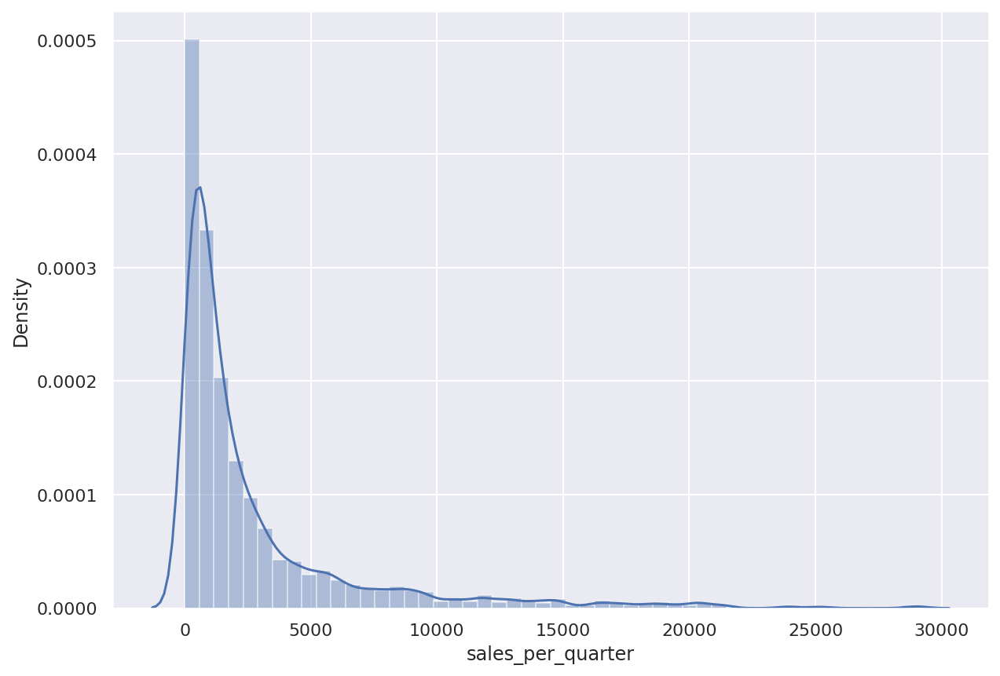

In [ ]:
sns.distplot(y_train)

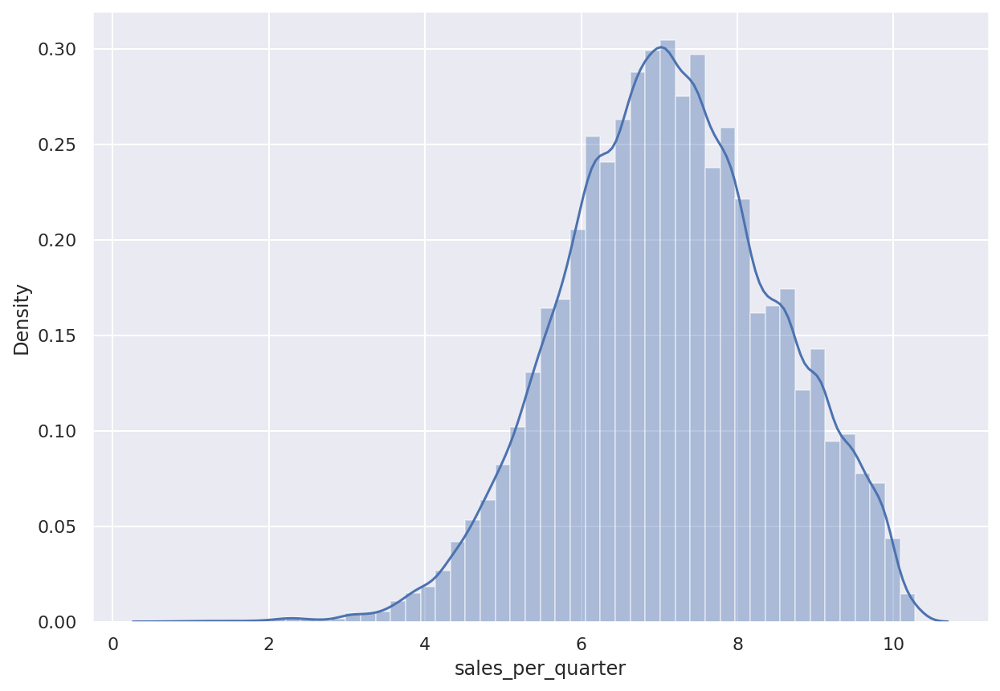

In [ ]:
sns.distplot(y_train_log)

In [ ]:
y_train_log = np.log1p(y_train)
y_train_log
y_val_log = np.log1p(y_val)

In [ ]:
from xgboost import XGBRegressor
from sklearn.pipeline import make_pipeline
from category_encoders import OrdinalEncoder

pipe = make_pipeline(
    OrdinalEncoder(),
    XGBRegressor( n_estimators=200
                   , random_state=2
                   , n_jobs=-1
                   , max_depth=8
                   , learining_rate=0.05
                 )
)

pipe.fit(x_train, y_train);

[07:23:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


KeyboardInterrupt: ignored

In [ ]:
from lightgbm import LGBMRegressor

pipe = make_pipeline(
    OrdinalEncoder(),
    LGBMRegressor(
        num_boost_round = 1000,
        learning_rate = 0.1,
        num_iterations = 90,
        max_depth = 8,
        metric = 'l1',
        colsample_bytree = 0.6,
        #drop_rate = 0.3,
        num_leaves = 50,
        max_bin = 446,
        min_data = 42,
        lambda_l1 = 40,
        #feature_pre_filter = True,
        boost_from_average = False,
        #tweedie_variance_power = 1.2
    )
)

pipe.fit(x_train, y_train);

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

y_pred = pipe.predict(x_val)

print('검증 정확도: ', pipe.score(x_val, y_val)) 
print('mae:', mean_absolute_error(y_val, y_pred)) #MAE값이 90정도인데, test data의 갯수가 약 1000개인 것을 감안하면 매우 좋은 score!!
print('mse:',mean_squared_error(y_val, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_val, y_pred)))

검증 정확도:  0.6541280049684421
mae: 1385.3728706745412
mse: 6236477.263728703
rmse: 2497.293988245818


In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import eli5
from eli5.sklearn import PermutationImportance

# permuter 정의
permuter = PermutationImportance(
    pipe.named_steps['lgbmregressor'], # model
    scoring='r2', # metric
    n_iter=5, # 다른 random seed를 사용하여 5번 반복
    random_state=2
)

# permuter 계산은 preprocessing 된 X_val을 사용합니다.
x_val_encoded = pipe.named_steps['ordinalencoder'].transform(x_val)

# 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
permuter.fit(x_val_encoded, y_val);

In [ ]:
feature_names = x_train.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values()

gender             -0.000999
user_id            -0.000067
ampm               -0.000029
day                -0.000023
year_quarter        0.000000
order_id            0.000000
year                0.000000
quantity            0.000000
metal               0.000072
color               0.002905
category_code       0.004043
brand               0.006714
month               0.007772
quantity_per_day    0.040568
gem                 0.092353
category_id         0.101040
price               0.252207
product_id          0.281307
dtype: float64

In [ ]:
# 특성별 score 확인
eli5.show_weights(
    permuter, 
    top=None, # top n 지정 가능, None 일 경우 모든 특성 보이기 
    feature_names=feature_names # list로 넣음.
)

Weight,Feature
0.2813 ± 0.0122,product_id
0.2522 ± 0.0078,price
0.1010 ± 0.0075,category_id
0.0924 ± 0.0053,gem
0.0406 ± 0.0024,quantity_per_day
0.0078 ± 0.0019,month
0.0067 ± 0.0014,brand
0.0040 ± 0.0007,category_code
0.0029 ± 0.0025,color
0.0001 ± 0.0001,metal


In [ ]:
x_val.dtypes

month                 object
day                   object
ampm                  object
order_id              object
user_id             category
product_id          category
category_id         category
category_code       category
brand               category
quantity               int64
price                float64
gender              category
color               category
metal               category
gem                 category
quantity_per_day       int64
year                category
year_quarter          object
hour                category
dtype: object

In [ ]:
#이를 활용해 특성을 선택
minimum_importance = 0
mask = permuter.feature_importances_ > minimum_importance
features = x_train.columns[mask]
x_train_selected = x_train[features]
x_val_selected = x_val[features]

In [ ]:
x_train_selected.shape, x_val_selected.shape

((81544, 13), (21467, 13))

In [ ]:
from lightgbm import LGBMRegressor

pipe = make_pipeline(
    OrdinalEncoder(),
    LGBMRegressor(
        num_boost_round = 100,
        # learning_rate = 0.1,
        # num_iterations = 90,
        max_depth = 8,
        metric = 'l1',
        colsample_bytree = 0.6,
        drop_rate = 0.3,
        num_leaves = 50,
        max_bin = 446,
        min_data = 42,
        lambda_l1 = 40,
        #feature_pre_filter = True,
        boost_from_average = False,
        #tweedie_variance_power = 1.2
    )
)

pipe.fit(x_train_selected, y_train);

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

y_pred = pipe.predict(x_val_selected)

print('검증 정확도: ', pipe.score(x_val_selected, y_val)) 
print('mae:', mean_absolute_error(y_val, y_pred)) #MAE값이 90정도인데, test data의 갯수가 약 1000개인 것을 감안하면 매우 좋은 score!!
print('mse:',mean_squared_error(y_val, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_val, y_pred)))

검증 정확도:  0.6417611463028348
mae: 1501.3960908775548
mse: 6459466.213397118
rmse: 2541.5479954935176


In [ ]:
✔︎ 월별 매출이 나왔을 때

SyntaxError: ignored

In [ ]:
train = before_leakage_train.copy()
val = before_leakage_val.copy()

In [ ]:
leakage = ['quarter','quantity_per_quarter','next_quarter']
train.drop(leakage, axis = 1, inplace=True)  #test는 한 quarter가 완전히 끝나지 않은 상태. 

In [ ]:
leakage_val = ['quarter','quantity_per_quarter'] #val은 가장 최신의 데이터라 next_quarter가 없음
val.drop(leakage_val, axis = 1, inplace=True)

In [ ]:
target = 'sales_per_quarter' #'quantity_per_quarter'

x_train = train.drop(target, axis = 1)
y_train = train[target]

x_val = val.drop(target, axis = 1)
y_val = val[target]

In [ ]:
from xgboost import XGBRegressor
from sklearn.pipeline import make_pipeline
from category_encoders import OrdinalEncoder

pipe = make_pipeline(
    OrdinalEncoder(),
    XGBRegressor( #n_estimators=500
    #                , random_state=2
    #                , n_jobs=-1
    #                , max_depth=8
    #                , learining_rate=0.05
                 )
)

pipe.fit(x_train, y_train);

[19:21:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

y_pred = pipe.predict(x_val)

print('검증 정확도: ', pipe.score(x_val, y_val)) 
print('mae:', mean_absolute_error(y_val, y_pred)) #MAE값이 90정도인데, test data의 갯수가 약 1000개인 것을 감안하면 매우 좋은 score!!
print('mse:',mean_squared_error(y_val, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_val, y_pred)))

검증 정확도:  0.8061941058062037
mae: 1077.13885217564
mse: 3494547.318310467
rmse: 1869.3708348828134


In [ ]:
from sklearn.pipeline import Pipeline
pipe = Pipeline([
    ('preprocessing', OrdinalEncoder()),
    ('xgb', XGBRegressor())
    ])

pipe.fit(x_train, y_train)
print('검증 정확도: ', pipe.score(x_val, y_val)) #r2 score

[19:22:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
검증 정확도:  0.8061941058062037


In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import eli5
from eli5.sklearn import PermutationImportance

# permuter 정의
permuter = PermutationImportance(
    pipe.named_steps['xgb'], # model
    scoring='r2', # metric
    n_iter=5, # 다른 random seed를 사용하여 5번 반복
    random_state=2
)

# permuter 계산은 preprocessing 된 X_val을 사용합니다.
x_val_encoded = pipe.named_steps['preprocessing'].transform(x_val)

# 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
permuter.fit(x_val_encoded, y_val);

In [ ]:
feature_names = x_train.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values()

color                -0.006701
month                -0.002096
gender               -0.000804
year                  0.000000
quantity_per_day      0.000000
metal                 0.000000
year_quarter          0.000000
quantity              0.000000
user_id               0.000000
order_id              0.000000
ampm                  0.000000
day                   0.000000
hour                  0.000000
category_id           0.000228
brand                 0.000403
category_code         0.000782
gem                   0.000857
product_id            0.021698
price                 0.595070
quantity_per_month    1.540145
dtype: float64

In [ ]:
# 특성별 score 확인
eli5.show_weights(
    permuter, 
    top=None, # top n 지정 가능, None 일 경우 모든 특성 보이기 
    feature_names=feature_names # list로 넣음.
)

Weight,Feature
1.5401 ± 0.0179,quantity_per_month
0.5951 ± 0.0238,price
0.0217 ± 0.0023,product_id
0.0009 ± 0.0003,gem
0.0008 ± 0.0004,category_code
0.0004 ± 0.0002,brand
0.0002 ± 0.0007,category_id
0 ± 0.0000,hour
0 ± 0.0000,day
0 ± 0.0000,ampm


In [ ]:
x_val.dtypes

month                 object
day                   object
ampm                  object
order_id              object
user_id             category
product_id          category
category_id         category
category_code       category
brand               category
quantity               int64
price                float64
gender              category
color               category
metal               category
gem                 category
quantity_per_day       int64
year                category
year_quarter          object
hour                category
dtype: object

In [ ]:
#이를 활용해 특성을 선택
minimum_importance = 0
mask = permuter.feature_importances_ > minimum_importance
features = x_train.columns[mask]
x_train_selected = x_train[features]
x_val_selected = x_val[features]

In [ ]:
x_train_selected.shape, x_val_selected.shape

((81544, 7), (21467, 7))

In [ ]:
pipe = Pipeline([
    ('preprocessing', OrdinalEncoder()),
    ('xgb', XGBRegressor())
], verbose=1)

pipe.fit(x_train_selected, y_train);

[Pipeline] ..... (step 1 of 2) Processing preprocessing, total=   0.1s
[19:22:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[Pipeline] ............... (step 2 of 2) Processing xgb, total=   3.0s


In [ ]:
y_pred = pipe.predict(x_val_selected)
print('검증 정확도: ', pipe.score(x_val_selected, y_val)) #오!! r2 score가 엄청 올랐습니다! MSE값은 커졌는데(내가 임의로 Feature selection했을 때) 흠 .. r2가 엄청 올라서 일단은 이렇게 가야겠습니다.  
print('mae:',mean_absolute_error(y_val, y_pred))
print('mse:',mean_squared_error(y_val, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_val, y_pred)))

검증 정확도:  0.8238969726901091
mae: 1003.5122811551253
mse: 3175343.889266671
rmse: 1781.9494631629348


In [ ]:
pd.DataFrame(
    {'columns': x_train.columns,
    'permuter': permuter.feature_importances_ - permuter.feature_importances_std_ > 0}
).set_index('columns').T

columns,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,price,gender,color,metal,gem,year,quarter,year_quarter
permuter,True,True,False,False,False,False,True,True,True,True,True,True,True,True,True,False,False,False


In [ ]:
from xgboost import XGBRegressor

pipe = make_pipeline(
    OrdinalEncoder(),
    XGBRegressor(n_estimators=100
                   , random_state=2
                   , n_jobs=-1
                   , max_depth=8
                   , learining_rate=0.05
                 )
)

pipe.fit(x_train_selected, y_train);

[19:24:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
from lightgbm import LGBMRegressor

pipe = make_pipeline(
    OrdinalEncoder(),
    LGBMRegressor(
        num_boost_round = 1000,
        learning_rate = 0.1,
        num_iterations = 90,
        max_depth = 8,
        metric = 'l1',
        colsample_bytree = 0.6,
        #drop_rate = 0.3,
        num_leaves = 50,
        max_bin = 446,
        min_data = 42,
        lambda_l1 = 40,
        #feature_pre_filter = True,
        boost_from_average = False,
        #tweedie_variance_power = 1.2
    )
)

pipe.fit(x_train_selected, y_train);

In [ ]:
from sklearn.metrics import accuracy_score
y_pred = pipe.predict(x_val_selected)
print('검증 정확도: ', pipe.score(x_val_selected, y_val)) #오!! r2 score가 엄청 올랐습니다! MSE값은 커졌는데(내가 임의로 Feature selection했을 때) 흠 .. r2가 엄청 올라서 일단은 이렇게 가야겠습니다.  
print('mae:',mean_absolute_error(y_val, y_pred))
print('mse:',mean_squared_error(y_val, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_val, y_pred)))

검증 정확도:  0.8231979274599959
mae: 983.0601552123317
mse: 3187948.493705725
rmse: 1785.4827060785901


### ✔︎ XGB

In [ ]:
from xgboost import XGBRegressor

pipe = make_pipeline(
    OrdinalEncoder(),
    XGBRegressor(n_estimators=500
                   , random_state=2
                   , n_jobs=-1
                   , max_depth=8
                   , learining_rate=0.05
                 )
)

pipe.fit(x_train_selected, y_train);

[06:08:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
from sklearn.metrics import accuracy_score
y_pred = pipe.predict(x_test_selected)

print('검증 정확도: ', pipe.score(x_test_selected, y_test)) #R2 스코어는 비슷하거나 조금 떨어졌지만 MAE값은 거의 반 이하로 줄어듬.
print('mae:',mean_absolute_error(y_test, y_pred)) #MAE값이 90정도인데, test data의 갯수가 약 1000개인 것을 감안하면 매우 좋은 score!!
print('mse:',mean_squared_error(y_test, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_test, y_pred)))

검증 정확도:  0.46589772805145446
mae: 90.0089785597229
mse: 46569.20313834106
rmse: 215.79898780657211


In [ ]:
#Baseline
predict = df['price'].mean()
errors = predict - df['price']
mean_absolute_error = errors.abs().mean()
mean_squared_error = np.square(errors).mean()
root_mean_squared_error = np.sqrt(mean_squared_error)

print('baseline mae:', mean_absolute_error)
print('baseline mse:', mean_squared_error)
print('baseline rmse:', root_mean_squared_error)

baseline mae: 183.5325997415345
baseline mse: 98473.88282862204
baseline rmse: 313.80548565731294


In [ ]:
train = df.copy()

target = 'price'

test = train.sort_values('date', ascending = True)[-1000:] #test data 1000개
train = train.drop(test.index)

x_train = train.drop([target], axis = 1)
y_train = train[target]
x_test= test.drop([target], axis = 1)
y_test = test[target]

In [ ]:
from sklearn.pipeline import Pipeline
pipe = Pipeline([
    ('preprocessing', make_pipeline(OrdinalEncoder(), SimpleImputer())),
    ('rf', RandomForestRegressor()) 
])

pipe.fit(x_train, y_train)
print('검증 정확도: ', pipe.score(x_test, y_test)) #r2 score

검증 정확도:  -0.06286640546981159


In [ ]:
y_pred = pipe.predict(x_test)
print('mae:',mean_absolute_error(y_test, y_pred))
print('mse:',mean_squared_error(y_test, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_test, y_pred)))

mae: 148.04685242581527
mse: 92672.965731197
rmse: 304.42234762119057


In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import eli5
from eli5.sklearn import PermutationImportance

# permuter 정의
permuter = PermutationImportance(
    pipe.named_steps['rf'], # model
    scoring='r2', # metric
    n_iter=5, # 다른 random seed를 사용하여 5번 반복
    random_state=2
)

# permuter 계산은 preprocessing 된 X_val을 사용합니다.
x_test_transformed = pipe.named_steps['preprocessing'].transform(x_test)

# 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
permuter.fit(x_test_transformed, y_test);

In [ ]:
feature_names = x_train.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values()

date            -0
time            -0
order_id        -0
month            0
category_id      0
quantity         0
user_id          0
metal            0
day              0
ampm             0
brand            0
gender           0
product_id       1
color            1
category_code    1
gem              2
dtype: float64

In [ ]:
# 특성별 score 확인
eli5.show_weights(
    permuter, 
    top=None, # top n 지정 가능, None 일 경우 모든 특성 보이기 
    feature_names=feature_names # list로 넣음.
)

Weight,Feature
2.2184 ± 0.6484,gem
1.1348 ± 0.2667,category_code
0.5739 ± 0.6832,color
0.5446 ± 0.3109,product_id
0.4335 ± 0.1445,gender
0.2507 ± 0.1277,brand
0.0127 ± 0.0511,ampm
0.0073 ± 0.0208,day
0.0013 ± 0.0000,metal
0.0009 ± 0.0021,user_id


In [ ]:
#이를 활용해 특성을 선택
minimum_importance = 0.001
mask = permuter.feature_importances_ > minimum_importance
features = x_train.columns[mask]
x_train_selected = x_train[features]
x_test_selected = x_test[features]

In [ ]:
x_train_selected.shape, x_test_selected.shape

((102011, 9), (1000, 9))

In [ ]:
pipe = Pipeline([
    ('preprocessing', make_pipeline(OrdinalEncoder(), SimpleImputer())),
    ('rf', RandomForestRegressor()) 
], verbose=1)

pipe.fit(x_train_selected, y_train);

[Pipeline] ..... (step 1 of 2) Processing preprocessing, total=   0.2s
[Pipeline] ................ (step 2 of 2) Processing rf, total=  14.6s


In [ ]:
print('검증 정확도: ', pipe.score(x_test_selected, y_test)) #오!! r2 score가 엄청 올랐습니다! MSE값은 커졌는데(내가 임의로 Feature selection했을 때) 흠 .. r2가 엄청 올라서 일단은 이렇게 가야겠습니다.  
print('mae:',mean_absolute_error(y_test, y_pred))
print('mse:',mean_squared_error(y_test, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_test, y_pred)))

검증 정확도:  0.4616515245223968
mae: 148.04685242581527
mse: 92672.965731197
rmse: 304.42234762119057


In [ ]:
pd.DataFrame(
    {'columns': x_train.columns,
    'permuter': permuter.feature_importances_ - permuter.feature_importances_std_ > 0}
).set_index('columns').T

columns,date,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,gender,color,metal,gem
permuter,False,False,False,False,False,False,False,True,False,True,True,False,True,True,True,True


In [ ]:
from xgboost import XGBRegressor

pipe = make_pipeline(
    OrdinalEncoder(),
    XGBRegressor(n_estimators=500
                   , random_state=2
                   , n_jobs=-1
                   , max_depth=8
                   , learining_rate=0.05
                 )
)

pipe.fit(x_train_selected, y_train);

[06:08:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
from sklearn.metrics import accuracy_score
y_pred = pipe.predict(x_test_selected)

print('검증 정확도: ', pipe.score(x_test_selected, y_test)) #R2 스코어는 비슷하거나 조금 떨어졌지만 MAE값은 거의 반 이하로 줄어듬.
print('mae:',mean_absolute_error(y_test, y_pred)) #MAE값이 90정도인데, test data의 갯수가 약 1000개인 것을 감안하면 매우 좋은 score!!
print('mse:',mean_squared_error(y_test, y_pred))
print('rmse:', np.sqrt(mean_squared_error(y_test, y_pred)))

검증 정확도:  0.46589772805145446
mae: 90.0089785597229
mse: 46569.20313834106
rmse: 215.79898780657211


### ✔︎ CatBoost

In [ ]:
from catboost import CatBoostClassifier

cfi = np.where(x_train_selected.dtypes == np.object)[0]

catBoost = CatBoostClassifier(n_estimators = 100,
                              eval_metric = 'F1'
                              )

catBoost.fit(x_train_selected, y_train, use_best_model=True, cat_features = cfi, eval_set=(x_val_selected, y_val))

CatBoostError: ignored

In [ ]:
# y_pred = catBoost.predict(x_test_selected)
# print('R2 Score', r2_score(y_test, y_pred)) #ㅜㅜ

print('검증 정확도: ', catBoost.score(x_val_selected, y_val)) 

y_pred = catBoost.predict(x_val_selected)
print(classification_report(y_val, y_pred)) 


검증 정확도:  0.9656
              precision    recall  f1-score   support

           0       0.99      0.83      0.90      1947
           1       0.96      1.00      0.98      8053

    accuracy                           0.97     10000
   macro avg       0.98      0.91      0.94     10000
weighted avg       0.97      0.97      0.96     10000



✔︎ CatBoost Regressor

In [ ]:
from catboost import CatBoostRegressor

cfi = np.where(x_train_selected.dtypes == np.object)[0]

catBoost = CatBoostRegressor(n_estimators = 100,
                              eval_metric = 'R2'
                              )

catBoost.fit(x_train_selected, y_train, use_best_model=True, cat_features = cfi, eval_set=(x_val_selected, y_val))

Learning rate set to 0.414084
0:	learn: 0.5912476	test: 0.4502268	best: 0.4502268 (0)	total: 47.3ms	remaining: 4.68s
1:	learn: 0.8077399	test: 0.5756627	best: 0.5756627 (1)	total: 85.2ms	remaining: 4.17s
2:	learn: 0.8818752	test: 0.5893606	best: 0.5893606 (2)	total: 118ms	remaining: 3.81s
3:	learn: 0.9104954	test: 0.5859134	best: 0.5893606 (2)	total: 147ms	remaining: 3.53s
4:	learn: 0.9212105	test: 0.5716219	best: 0.5893606 (2)	total: 181ms	remaining: 3.44s
5:	learn: 0.9290572	test: 0.5631508	best: 0.5893606 (2)	total: 228ms	remaining: 3.56s
6:	learn: 0.9321934	test: 0.5566218	best: 0.5893606 (2)	total: 257ms	remaining: 3.42s
7:	learn: 0.9333648	test: 0.5499605	best: 0.5893606 (2)	total: 286ms	remaining: 3.29s
8:	learn: 0.9343381	test: 0.5448328	best: 0.5893606 (2)	total: 314ms	remaining: 3.17s
9:	learn: 0.9349440	test: 0.5421772	best: 0.5893606 (2)	total: 341ms	remaining: 3.07s
10:	learn: 0.9352172	test: 0.5407140	best: 0.5893606 (2)	total: 367ms	remaining: 2.97s
11:	learn: 0.9354881	

In [ ]:
from sklearn.metrics import r2_score
x_test_encoded = pipe.named_steps['ordinalencoder'].transform(x_test_selected)
x_test_encoded = x_test_encoded.astype(str)
y_pred = catBoost.predict(x_test_encoded)
print('R2 Score', r2_score(y_test, y_pred))

R2 Score -0.020441881926642758


In [ ]:
pipe

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['product_id', 'category_id',
                                      'category_code', 'gender', 'metal',
                                      'gem'],
                                mapping=[{'col': 'product_id',
                                          'data_type': dtype('O'),
                                          'mapping': 1836250225916772582       1
1836015460420681761       2
1806829194936582544       3
1836918640855745365       4
1835566854668550661       5
                       ... 
1956663836350087959    6779
1515966223363439597    6780
19566638481612480...
garnet                  7
pearl                   8
sapphire                9
topaz                  10
ruby                   11
emerald                12
quartz_smoky           13
chrysolite             14
nanocrystal            15
quartz                 16
mix                    17
citrine                18
agate                  19
corundum    

In [ ]:
test

x_test = test.drop(target, axis=1)
y_test = test[target]

x_test.drop(leakage, axis = 1, inplace = True)
x_test

,time,month,day,ampm,order_id,user_id,product_id,category_id,category_code,brand,quantity,price,gender,color,metal,gem,year,quarter,year_quarter
81533,00:17:58,07,Wednesday,night,2343296046773305609,1.515915625481427e+18,1515966223467164785,1.8068292019159043e+18,jewelry.pendant,0,1,53,f,red,gold,fianit,2020,3,2020-3
81534,07:37:27,07,Wednesday,morning,2363810966384148747,1.515915625496276e+18,1515966223467164785,1.8068292019159043e+18,jewelry.pendant,0,1,53,f,red,gold,fianit,2020,3,2020-3
81535,05:06:34,07,Wednesday,morning,2343441300746928608,1.5159156254814746e+18,1956663847750205966,1.8068292019159043e+18,jewelry.pendant,5,1,56,f,red,gold,garnet,2020,3,2020-3
81536,12:48:28,07,Tuesday,afternoon,2358169297378869421,1.5159156254338606e+18,1956663847750205966,1.8068292019159043e+18,jewelry.pendant,5,1,56,f,red,gold,garnet,2020,3,2020-3
81537,16:29:44,07,Monday,afternoon,2362629316660953537,1.5159156252284306e+18,1956663847750205966,1.8068292019159043e+18,jewelry.pendant,5,1,56,f,red,gold,garnet,2020,3,2020-3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102995,11:41:46,11,Sunday,morning,2453081350689784357,1.5159156251559772e+18,1956663846374474513,1.8068292018907384e+18,jewelry.earring,1,1,671,unknown,red,gold,diamond,2020,4,2020-4
102996,14:21:39,11,Sunday,afternoon,2453161822262395043,1.5159156255461586e+18,1515966223509090291,1.8068292018907384e+18,jewelry.earring,5,1,417,f,red,gold,unknown,2020,4,2020-4
102997,11:47:49,11,Sunday,morning,2453084397507707489,1.5159156255458017e+18,1515966223545341186,1.8068292018655726e+18,jewelry.bracelet,5,1,159,f,unknown-color,silver,unknown,2020,4,2020-4
102998,10:09:03,11,Sunday,morning,2453034685341631171,1.515915625450853e+18,1515966222711500252,1.80682920194107e+18,jewelry.brooch,5,1,425,f,red,gold,rhodolite,2020,4,2020-4


In [ ]:
x_test.isna().sum()

time             0
month            0
day              0
ampm             0
order_id         0
user_id          0
product_id       0
category_id      0
category_code    0
brand            0
quantity         0
price            0
gender           0
color            0
metal            0
gem              0
year             0
quarter          0
year_quarter     0
dtype: int64

In [ ]:
x_test_selected = x_test[features]

In [ ]:
from sklearn.metrics import r2_score

y_pred = catBoost.predict(x_test_selected)
print('R2 Score', r2_score(y_test, y_pred))

R2 Score 0.720893457943341


### 2) PDP를 만들어 모델을 설명하세요
- 한 특성에 대한 PDP를 만들고 모델을 설명하세요
- 두 특성간 관계에 대한 PDP를 만들고 모델을 설명하세요


In [ ]:
#이미지 화질 조정

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 144

In [ ]:
ecd = OrdinalEncoder()
x_train_encoded = ecd.fit_transform(x_train_selected)
x_val_encoded = ecd.transform(x_val_selected)

In [ ]:
ecd.mapping

[{'col': 'order_id',
  'data_type': dtype('O'),
  'mapping': 1923415742179443254        1
  1923426489303302817        2
  1923459963229831173        3
  1923625730730623830        4
  1923534078074684181        5
                         ...  
  2342838013677011237    61827
  2343001562567147731    61828
  2342816929942602472    61829
  2300738475193794654    61830
  NaN                       -2
  Length: 61831, dtype: int64},
 {'col': 'product_id',
  'data_type': dtype('O'),
  'mapping': 1836250225916772582       1
  1836015460420681761       2
  1806829194936582544       3
  1836918640855745365       4
  1835566854668550661       5
                         ... 
  1515966223503272917    8481
  1840352252980625763    8482
  2292856517801542617    8483
  2279188208812032095    8484
  NaN                      -2
  Length: 8485, dtype: int64},
 {'col': 'category_id',
  'data_type': dtype('O'),
  'mapping': 1.8068292019159043e+18     1
  1.8068292018823498e+18     2
  1.8068292018907384e+

In [ ]:
x_val_encoded

,order_id,product_id,category_id,brand,price,gem,quantity_per_day,quantity_per_month
71537,54172,1290,2,0,1321,1,1,3
71538,54173,6541,2,0,198,1,1,1
71539,54174,2344,2,1,503,9,1,1
71540,54174,3939,2,1,340,1,1,2
71541,54175,3939,2,1,340,1,1,2
...,...,...,...,...,...,...,...,...
103006,59127,3304,3,0,351,2,1,1
103007,59127,2166,3,0,406,5,1,1
103008,59127,8483,3,5,426,2,1,1
103009,59127,8484,4,7,376,1,1,1


In [ ]:
x_val_encoded = x_val_encoded.astype(int)
x_val_encoded.dtypes

order_id              int64
product_id            int64
category_id           int64
brand                 int64
price                 int64
gem                   int64
quantity_per_day      int64
quantity_per_month    int64
dtype: object

In [ ]:
x_val_encoded

,month,product_id,category_id,category_code,brand,price,color,metal,gem,quantity_per_day
81533,9,7162.0,1,1,1,53.04,1,1,5.0,1
81534,9,7162.0,1,1,1,53.04,1,1,5.0,1
81535,9,1264.0,1,1,4,56.48,1,1,7.0,1
81536,9,1264.0,1,1,4,56.48,1,1,7.0,1
81537,9,1264.0,1,1,4,56.48,1,1,7.0,1
...,...,...,...,...,...,...,...,...,...,...
102995,1,3378.0,3,3,2,670.86,1,1,1.0,1
102996,1,-1.0,3,3,4,417.03,1,1,2.0,1
102997,1,-1.0,4,4,4,159.08,3,2,2.0,1
102998,1,3066.0,6,6,4,424.52,1,1,24.0,1


KeyboardInterrupt: ignored

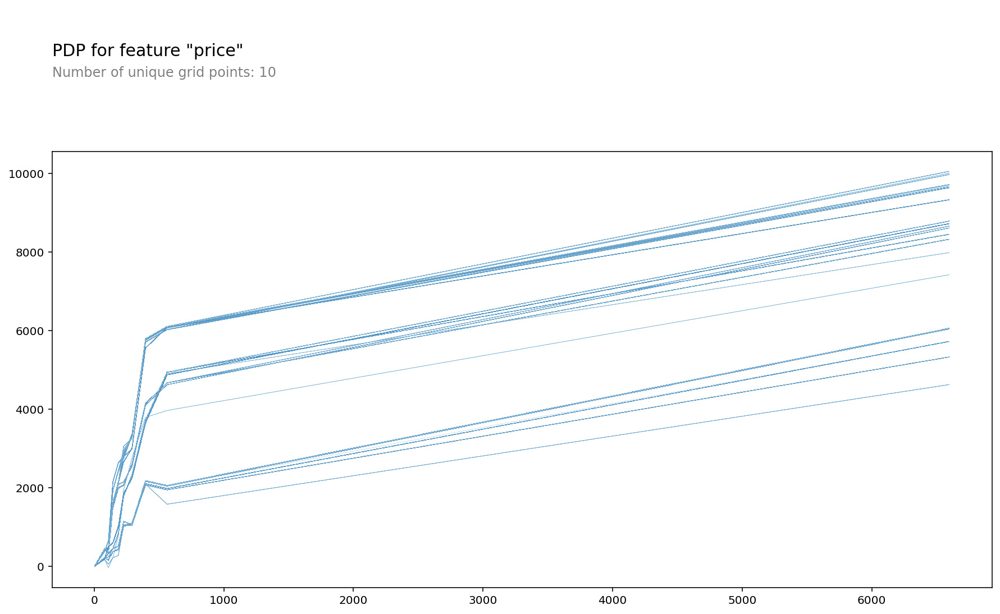

In [ ]:
# 이번엔 catboost 모델을 확인
import pdpbox
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'price'

isolated = pdp_isolate(
    model=pipe, 
    dataset=x_val_encoded, 
    model_features=x_val_encoded.columns,  
    feature=feature
)

pdp_plot(isolated, 
         feature_name = feature, 
         plot_lines=True, 
         ); 
         
# 모델은 브랜드 5,6,7일수록 구매 가능성이 낮아짐.

In [ ]:
val.groupby('brand').price.agg(['count','sum','mean']).T

brand,0,1,2,4,5,7
count,5456,2846,7,13,1330,348
sum,1426044,721429,1148,336,373768,200350
mean,261,253,164,26,281,576


In [ ]:
# x_val_encoded['brand'] = x_val_encoded['brand'].astype(str)
# x_val_encoded['order_id'] = x_val_encoded['order_id'].astype(str)
# x_val_encoded['product_id'] = x_val_encoded['product_id'].astype(str)
# x_val_encoded['category_id'] = x_val_encoded['category_id'].astype(str)
# x_val_encoded['gem'] = x_val_encoded['gem'].astype(str)

x_val_encoded[['brand','order_id','product_id','category_id','gem']] = x_val_encoded[['brand','order_id','product_id','category_id','gem']].astype(str)
x_val_encoded[['price','quantity_per_day','quantity_per_month']] = x_val_encoded[['price','quantity_per_day','quantity_per_month']].astype(int)

In [ ]:
x_val_encoded.dtypes

order_id              object
product_id            object
category_id           object
brand                 object
price                  int64
gem                   object
quantity_per_day       int64
quantity_per_month     int64
dtype: object

In [ ]:
x_val_encoded.isna().sum()

order_id              0
product_id            0
category_id           0
brand                 0
price                 0
gem                   0
quantity_per_day      0
quantity_per_month    0
dtype: int64

In [ ]:
# 이번엔 catboost 모델을 확인
import pdpbox
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'category_id'

isolated = pdp_isolate(
    model=catBoost, 
    dataset=x_val_encoded, 
    model_features=x_val_encoded.columns,  
    feature=feature
)

pdp_plot(isolated, 
         feature_name = feature, 
         plot_lines=True, 
         ); 
         
# 모델은 브랜드 5,6,7일수록 구매 가능성이 낮아짐.

CatBoostError: ignored

In [ ]:
## 두 특성 간 관계 분석 (xgb)

from pdpbox.pdp import pdp_interact, pdp_interact_plot

features = ['brand', 'gem']

interaction = pdp_interact(
    model= pipe, 
    dataset=x_val_encoded,
    model_features=x_val_encoded.columns, 
    features=features
)

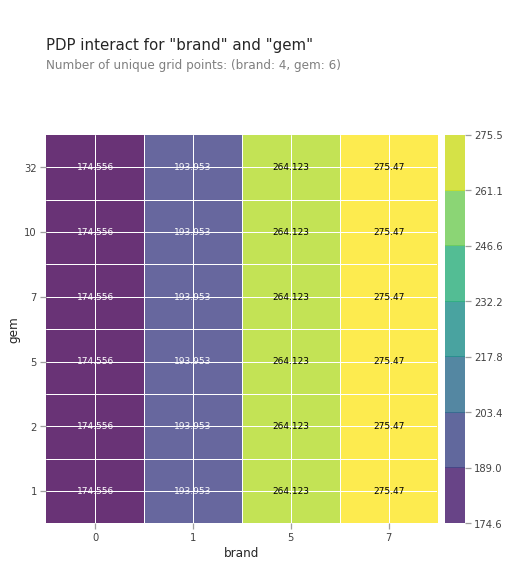

In [ ]:
from pdpbox import pdp
features = ['brand', 'gem']

interaction = pdp.pdp_interact(
    model= pipe, 
    dataset=x_val_encoded,
    model_features=x_val_encoded.columns, 
    features=features
)

#pdp_interact_plot(interaction, plot_type='grid', 
     #             feature_names=features);

pdp.pdp_interact_plot(interaction, plot_type='grid', feature_names=features);

# gem은 거의 영향을 미치지 않는 것처럼 보임!! Brand가 중요한 것처럼 보임. 7번 브랜드는 다 가격이 비싼 것처럼 나왔는데, 확인이 필요.

In [ ]:
## 이번에는 categorical features 들을 map해서

features = ['gem', 'brand']

for item in ecd.mapping:
  if item['col'] in features:
    feature_mapping = item['mapping']

feature_mapping = feature_mapping[feature_mapping.index.dropna()]
cat_name = feature_mapping.index.tolist()
cat_code = feature_mapping.values.tolist()

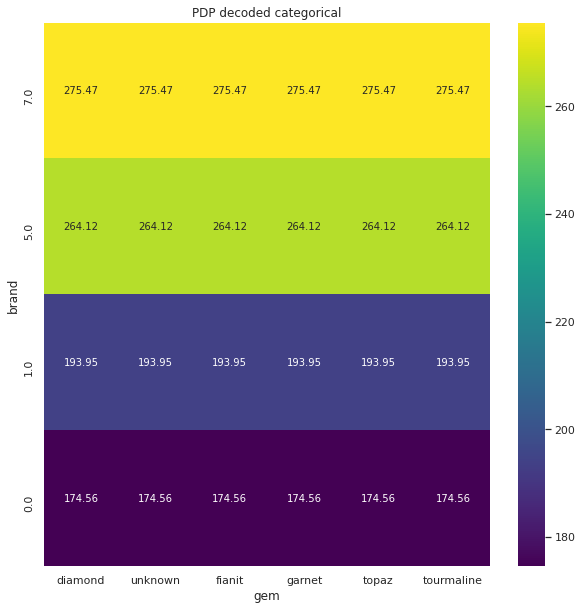

In [ ]:
pdp = interaction.pdp.pivot_table(
    values='preds', 
    columns=features[0], 
    index=features[1]
)[::-1]

pdp = pdp.rename(columns=dict(zip(cat_code, cat_name)))
plt.figure(figsize=(10,10))
sns.heatmap(pdp, annot=True, fmt='.2f', cmap='viridis')
plt.title('PDP decoded categorical');

### 3) SHAP 라이브러리를 사용해 최소 3개 이상 시각화를 하고 분석하세요

In [ ]:
a = x_val_encoded.iloc[[340]] #중첩 브라켓 사용하면 결과물이 데이터프레임!!
a

,month,product_id,category_id,category_code,brand,price,color,metal,gem,quantity_per_day
81873,9,1418.0,3,3,1,93.01,1,1,5.0,1


In [ ]:
b = x_val_selected.iloc[[340]]

In [ ]:
print(f'실제값: {y_val.iloc[[340]]}') #실제값 660
print(f'예측값: {pipe.predict(b)}') #예측값 168 ??? 

실제값: 81873    1209.13
Name: sales_per_quarter, dtype: float64
예측값: [938.87962137]


In [ ]:
y_val[300:350]

In [ ]:
y_pred[300:350]

array([1922.33450082, 2933.34323217, 2933.34323217, 1922.33450082,
       1922.33450082, 1922.33450082, 1922.33450082, 1922.33450082,
       4480.53904301,  374.59473546,  374.59473546,  291.02834668,
        291.02834668,  323.31487124,  323.31487124,  291.02834668,
        291.02834668,  246.21274403,  722.26171866,  280.9883166 ,
        280.9883166 ,  280.9883166 ,  280.9883166 ,  280.9883166 ,
       2733.67714333,  733.16124358,  733.16124358,  733.16124358,
        774.27839231,  774.27839231,  774.27839231,  968.04121187,
        370.0250835 ,  370.0250835 ,  700.04233946,  700.04233946,
       1139.14749574, 1139.14749574,  791.94139019,  791.94139019,
        791.94139019,  791.94139019,  791.94139019, 1139.14749574,
       1139.14749574,  791.94139019,  791.94139019,  791.94139019,
        791.94139019,  938.87962137])

In [ ]:
b = x_val.iloc[[1]]
pipe.predict(b)

array([1148.6777], dtype=float32)

In [ ]:
import shap

explainer = shap.TreeExplainer(pipe['lgbmregressor']) # 여기선 666???? 원래 pipe로 묶여있던것중에 떼내서 regressor만 썼는데 성능이 훨씬 나아지는데 ... ㅠㅠ 다른 row들도 그렇습니다. 확인해보아야 할 것 같습니다. 
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=a
)

In [ ]:
pipe

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['month', 'product_id', 'category_id',
                                      'category_code', 'brand', 'color',
                                      'metal', 'gem'],
                                mapping=[{'col': 'month',
                                          'data_type': dtype('O'),
                                          'mapping': 11      1
12      2
01      3
02      4
03      5
04      6
06      7
05      8
07      9
08     10
09     11
10     12
NaN    -2
dtype: int64},
                                         {'col': 'product_id',
                                          'data_type': CategoricalDtype(categories=['1313550904313512734', '131355119558275...
corundum_synthetic     21
sitall                 22
emerald_geothermal     23
rhodolite              24
chrysoprase            25
coral                  26
sapphire_geothermal    27
onyx                   28
nacre                  29
spinel        

In [ ]:
x_val_encoded = pipe['ordinalencoder'].transform(x_val_selected)
a = x_val_encoded.iloc[[500]]
b = x_val_selected.iloc[[500]]#중첩 브라켓 사용하면 결과물이 데이터프레임!!
print(f'실제값: {y_val.iloc[[500]]}') #실제값 660
print(f'예측값: {pipe.predict(b)}') #예측값 168 ??? 

import shap

explainer = shap.TreeExplainer(pipe['lgbmregressor'])
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=b
)

실제값: 82033    3077.13
Name: sales_per_quarter, dtype: float64
예측값: [2249.54166764]


In [ ]:

import shap

explainer = shap.TreeExplainer(pipe['lgbmregressor'])
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=b
)

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['month', 'product_id', 'category_id',
                                      'category_code', 'brand', 'color',
                                      'metal', 'gem'],
                                mapping=[{'col': 'month',
                                          'data_type': dtype('O'),
                                          'mapping': 11      1
12      2
01      3
02      4
03      5
04      6
06      7
05      8
07      9
08     10
09     11
10     12
NaN    -2
dtype: int64},
                                         {'col': 'product_id',
                                          'data_type': CategoricalDtype(categories=['1313550904313512734', '131355119558275...
corundum_synthetic     21
sitall                 22
emerald_geothermal     23
rhodolite              24
chrysoprase            25
coral                  26
sapphire_geothermal    27
onyx                   28
nacre                  29
spinel        

In [ ]:
import shap

explainer = shap.TreeExplainer(catBoost) # 여기선 666???? 원래 pipe로 묶여있던것중에 떼내서 regressor만 썼는데 성능이 훨씬 나아지는데 ... ㅠㅠ 다른 row들도 그렇습니다. 확인해보아야 할 것 같습니다. 
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=a
)

In [ ]:
a = x_val_encoded.iloc[[1]] #중첩 브라켓 사용하면 결과물이 데이터프레임!!
a

,day,ampm,product_id,category_code,brand,gender,color,metal,gem
86031,4,1,1943509975414342509,4,0,1,1,1,2


In [ ]:
print(f'실제값: {y_val.iloc[[1]]}') #실제값 660
print(f'예측값: {pipe.predict(a)}') #예측값 168 ??? 

실제값: 86031   660
Name: price, dtype: float64
예측값: [168.42111]


In [ ]:
b = x_val.iloc[[1]]
pipe.predict(b)

array([1148.6777], dtype=float32)

In [ ]:
import shap

explainer = shap.TreeExplainer(pipe['xgbregressor']) # 여기선 666???? 원래 pipe로 묶여있던것중에 떼내서 regressor만 썼는데 성능이 훨씬 나아지는데 ... ㅠㅠ 다른 row들도 그렇습니다. 확인해보아야 할 것 같습니다. 
shap_values = explainer.shap_values(a)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=a
)

In [ ]:
pipe

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['day', 'ampm', 'category_code', 'gender',
                                      'color', 'metal', 'gem'],
                                mapping=[{'col': 'day', 'data_type': dtype('O'),
                                          'mapping': Thursday     1
Friday       2
Saturday     3
Sunday       4
Monday       5
Tuesday      6
Wednesday    7
NaN         -2
dtype: int64},
                                         {'col': 'ampm',
                                          'data_type': dtype('O'),
                                          'mapping': afternoon    1
evening      2
morning      3
night        4
NaN         -2
dtype: int64},
                                         {'col':...
quartz_smoky           13
chrysolite             14
nanocrystal            15
quartz                 16
mix                    17
citrine                18
agate                  19
corundum               20
corundum_synthetic     21

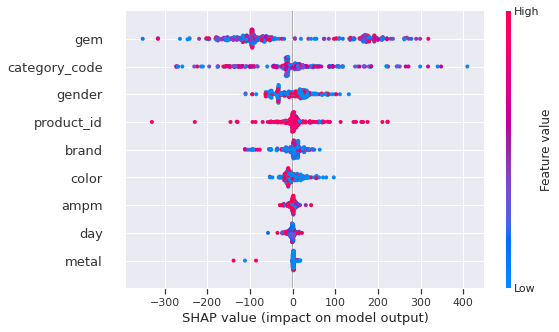

In [ ]:
shap_values = explainer.shap_values(x_val_encoded.iloc[:300])
shap.summary_plot(shap_values, x_train_encoded.iloc[:300])